# Prediction of type of Diabetes

## Importing Required Libraries

In [121]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, roc_auc_score, ConfusionMatrixDisplay,accuracy_score,recall_score
from sklearn.preprocessing import StandardScaler
pd.set_option('display.max_columns', None)
from sklearn.metrics import accuracy_score,confusion_matrix,f1_score,precision_score
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier,AdaBoostClassifier,ExtraTreesClassifier
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from collections import Counter
from sklearn.ensemble import VotingClassifier
from sklearn.ensemble import StackingClassifier

# Step-1 : EDA

## Reading the data

In [2]:
data=pd.read_csv("Diabetic.csv",index_col='SI.No')
# Reading of the csv file using pandas library and seting SI.No as index

## Creating a copy of original dataset

In [3]:
df=data.copy()
#Creating a copy of original dataset by using copy function

## Displaying first 5 records

In [4]:
df.head()
#to check whether the data is correctly loaded, we are checking the top 5 records, using head

,Target,Genetic Markers,Autoantibodies,Family History,Environmental Factors,Insulin Levels,Age,BMI,Physical Activity,Dietary Habits,Blood Pressure,Cholesterol Levels,Waist Circumference,Ethnicity,Socioeconomic Factors,Smoking Status,Alcohol Consumption,Glucose Tolerance Test,History of PCOS,Previous Gestational Diabetes,Pregnancy History,Weight Gain During Pregnancy,Pancreatic Health,Pulmonary Function,Cystic Fibrosis Diagnosis,Steroid Use History,Genetic Testing,Neurological Assessments,Liver Function Tests,Digestive Enzyme Levels,Urine Test,Birth Weight,Early Onset Symptoms
SI.No,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,Type 1 Diabetes,Positive,Negative,No,Present,40,44,38,High,Healthy,124,201,50,Low Risk,Medium,Smoker,High,Normal,No,No,Normal,18,36,76,No,No,Positive,3,Normal,56,Ketones Present,2629,No
2,Type 1 Diabetes,Positive,Negative,No,Present,13,1,17,High,Healthy,73,121,24,Low Risk,High,Non-Smoker,Moderate,Normal,Yes,No,Normal,8,26,60,Yes,No,Negative,1,Normal,28,Glucose Present,1881,Yes
3,Normal / Prediabetic,Positive,Positive,Yes,Present,27,36,24,High,Unhealthy,121,185,36,Low Risk,Medium,Smoker,High,Abnormal,Yes,No,Normal,15,56,80,Yes,No,Negative,1,Abnormal,55,Ketones Present,3622,Yes
4,Normal / Prediabetic,Negative,Positive,No,Present,8,7,16,Low,Unhealthy,100,151,29,Low Risk,High,Smoker,Moderate,Abnormal,No,Yes,Normal,12,49,89,Yes,No,Positive,2,Abnormal,60,Ketones Present,3542,No
5,Other Genetic/Specific Diabetes,Negative,Negative,Yes,Present,17,10,17,High,Healthy,103,146,33,Low Risk,Low,Smoker,Moderate,Normal,No,Yes,Complications,2,10,41,No,No,Positive,1,Normal,24,Protein Present,1770,No


## Number of Rows and columns

In [5]:
df.shape
# checking on the now of rows and columns
# we can observe that there are 70000 records/rows and 33 columns

(70000, 33)

In [6]:
df.describe()
# understanbding of data using 5 point summary

,Insulin Levels,Age,BMI,Blood Pressure,Cholesterol Levels,Waist Circumference,Weight Gain During Pregnancy,Pancreatic Health,Pulmonary Function,Neurological Assessments,Digestive Enzyme Levels,Birth Weight
count,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000
mean,21.607443,32.020700,24.782943,111.339543,194.867200,35.051657,15.496414,47.564243,70.264671,1.804157,46.420529,3097.061071
std,10.785852,21.043173,6.014236,19.945000,44.532466,6.803461,9.633096,19.984683,11.965600,0.680154,19.391089,713.837300
min,5.000000,0.000000,12.000000,60.000000,100.000000,20.000000,0.000000,10.000000,30.000000,1.000000,10.000000,1500.000000
25%,13.000000,14.000000,20.000000,99.000000,163.000000,30.000000,7.000000,32.000000,63.000000,1.000000,31.000000,2629.000000
50%,19.000000,31.000000,25.000000,113.000000,191.000000,34.000000,16.000000,46.000000,72.000000,2.000000,48.000000,3103.000000
75%,28.000000,49.000000,29.000000,125.000000,225.000000,39.000000,22.000000,64.000000,79.000000,2.000000,61.000000,3656.250000
max,49.000000,79.000000,39.000000,149.000000,299.000000,54.000000,39.000000,99.000000,89.000000,3.000000,99.000000,4499.000000


In [7]:
#Key takeaways from 5 point summary
#1. Some of the data points are left skewed and some are right skewed ( based on the mean and median/(50%) values)
#2. The average age in this dataset is 32 years
#3. Since some features are skewed there might be presence of outliers, which we will confirm in our further analysis
#4. Looking at the min and max values the data seems authentic.
#5. Birth weight is given in grams.

## Checking on data types and missing values

In [8]:
df.info()
# checking on data type and missing values

<class 'pandas.core.frame.DataFrame'>
Index: 70000 entries, 1 to 70000
Data columns (total 33 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   Target                         70000 non-null  object
 1   Genetic Markers                70000 non-null  object
 2   Autoantibodies                 70000 non-null  object
 3   Family History                 70000 non-null  object
 4   Environmental Factors          70000 non-null  object
 5   Insulin Levels                 70000 non-null  int64 
 6   Age                            70000 non-null  int64 
 7   BMI                            70000 non-null  int64 
 8   Physical Activity              70000 non-null  object
 9   Dietary Habits                 70000 non-null  object
 10  Blood Pressure                 70000 non-null  int64 
 11  Cholesterol Levels             70000 non-null  int64 
 12  Waist Circumference            70000 non-null  int64 
 13  Ethnic

In [9]:
# we can observe that there are 33 columnns, having 2 types of datatype int and object.
# And also there are no missing values in the dataset.

## Checking for null or missing values

In [10]:
df.isna().sum()

Target                           0
Genetic Markers                  0
Autoantibodies                   0
Family History                   0
Environmental Factors            0
Insulin Levels                   0
Age                              0
BMI                              0
Physical Activity                0
Dietary Habits                   0
Blood Pressure                   0
Cholesterol Levels               0
Waist Circumference              0
Ethnicity                        0
Socioeconomic Factors            0
Smoking Status                   0
Alcohol Consumption              0
Glucose Tolerance Test           0
History of PCOS                  0
Previous Gestational Diabetes    0
Pregnancy History                0
Weight Gain During Pregnancy     0
Pancreatic Health                0
Pulmonary Function               0
Cystic Fibrosis Diagnosis        0
Steroid Use History              0
Genetic Testing                  0
Neurological Assessments         0
Liver Function Tests

In [11]:
#To confirm the null or missing values in the dataset, we are checking using isna function. And there are no missing values.

##  Checking for duplicates

In [12]:
df.duplicated().sum()

0

In [13]:
# Duplicated function is used to check if there are any duplicates in the datset and we can observe that there are no duplicates.

## Checking for anamolies

In [14]:
df.describe()

,Insulin Levels,Age,BMI,Blood Pressure,Cholesterol Levels,Waist Circumference,Weight Gain During Pregnancy,Pancreatic Health,Pulmonary Function,Neurological Assessments,Digestive Enzyme Levels,Birth Weight
count,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000
mean,21.607443,32.020700,24.782943,111.339543,194.867200,35.051657,15.496414,47.564243,70.264671,1.804157,46.420529,3097.061071
std,10.785852,21.043173,6.014236,19.945000,44.532466,6.803461,9.633096,19.984683,11.965600,0.680154,19.391089,713.837300
min,5.000000,0.000000,12.000000,60.000000,100.000000,20.000000,0.000000,10.000000,30.000000,1.000000,10.000000,1500.000000
25%,13.000000,14.000000,20.000000,99.000000,163.000000,30.000000,7.000000,32.000000,63.000000,1.000000,31.000000,2629.000000
50%,19.000000,31.000000,25.000000,113.000000,191.000000,34.000000,16.000000,46.000000,72.000000,2.000000,48.000000,3103.000000
75%,28.000000,49.000000,29.000000,125.000000,225.000000,39.000000,22.000000,64.000000,79.000000,2.000000,61.000000,3656.250000
max,49.000000,79.000000,39.000000,149.000000,299.000000,54.000000,39.000000,99.000000,89.000000,3.000000,99.000000,4499.000000


Brief Explaination on 5 point summary:
1. Insulin Levels
Mean: 21.6, Std: 10.79

Spread is moderate; some individuals may have higher levels (max = 49), possibly indicating insulin resistance or diabetes in the dataset.

2. Age
Range: 0 to 79, with a mean of 32.

25% are 14 or younger, suggesting a good portion of the population is pediatric.

High standard deviation indicates wide age dispersion.

3. BMI
Mean: ~24.78 is within normal range.

75% of population is below BMI 29, near overweight boundary.

Max = 39, indicating some obese individuals.

4. Blood Pressure
Mean: 111.34 (normal range), but Max = 149 suggests hypertensive cases.

75% are below 125, which is at the upper end of normal.

5. Cholesterol Levels
Mean: 194.87, which is close to the borderline high category (≥ 200 mg/dL).

Max: 299 — indicating some may have very high cholesterol.

6. Waist Circumference
Mean: 35 inches; max of 54 indicates possible obesity.

Could be useful to evaluate central obesity and metabolic risk.

7. Weight Gain During Pregnancy
Mean: 15.5 kg — within recommended limits.

Range: 0 to 39 — Some gained significantly more than recommended (around 9–18 kg depending on BMI).

8. Pancreatic Health
Mean: 47.56, std = 20 — high variability.

No clear interpretation without domain-specific range classification, but distribution seems symmetric.

9. Pulmonary Function
Mean: 70.26 — assuming this is some composite score or lung capacity measure.

Max = 89, min = 30 — indicating a wide range of respiratory efficiency.

10. Neurological Assessments
Appears categorical, likely ordinal (1, 2, 3).

Median = 2, suggesting average performance on neurological evaluations.

11. Digestive Enzyme Levels
Mean: 46.42, std = 19.4 — moderate variability.

May be used to assess pancreatic exocrine function.

12. Birth Weight
Mean: 3097 g (approx. 3.1 kg) — within normal birth weight range.

25th percentile is 2.63 kg, may indicate a portion of low birth weight infants


In [15]:
for i in df.columns:
    print(f"Unique values in column {i}")
    print(df[i].unique())
    print()

Unique values in column Target
['Type 1 Diabetes' 'Normal / Prediabetic'
 'Other Genetic/Specific Diabetes' 'Type 2 Diabetes']

Unique values in column Genetic Markers
['Positive' 'Negative']

Unique values in column Autoantibodies
['Negative' 'Positive']

Unique values in column Family History
['No' 'Yes']

Unique values in column Environmental Factors
['Present' 'Absent']

Unique values in column Insulin Levels
[40 13 27  8 17 29 10 47 21 16 22  9 38 14 12 30 19 42 34 11 24 44 20 15
 18  6 28 48  5 46 26 45 33 23 41 39  7 31 35 25 32 36 43 49 37]

Unique values in column Age
[44  1 36  7 10 41 30  3 47 72 67 29 59  0 45 53 60 16 35 14 64  9 65 34
 51 11 56 37 22 70 33 50 62 40 28 12 38 19 39 46 43 77 73 32  5 49 26 52
 21 54 18 42 31 23 58 13  8 48 55 17 24 25 79  6  2  4 69 27 15 61 20 66
 68 78 57 71 63 75 74 76]

Unique values in column BMI
[38 17 24 16 26 31 18 25 29 23 28 19 22 37 32 33 39 34 15 21 27 35 14 20
 12 13 30 36]

Unique values in column Physical Activity
['High' 'Low

In [16]:
#checking on the data looks like ther are no anomolies

In [17]:
# In brief explaination of the features
#Target columns consist of 4 classes:Normal / Prediabetic,Type 1 Diabetes,Type 2 Diabetes and Other Genetic/Specific Diabetes
#Genetic Markers are binary class: Positive and Negative
#Autoantibodies are binary class:Positive and Negative
#Family History are binary class: Yes and No
#Environmental Factors are binary class: Present and Absent
#Insulin Levels are numeric, values ranging from 5-49
#Age ranging from 0-79 years, which indicates our dataset has data ranging from few months upto 79 years.
#BMI values ranging from 12-39
#Blood Pressure values ranging from 60-149.
#Physical Activity consist of 3 classes: 'High' 'Low' 'Moderate'
#Dietary Habits are binary class: 'Healthy' 'Unhealthy'
#Cholesterol Levels ranges from 100-299
#Waist Circumference ranges from 20 to 54 inches
#Ethnicity consist of 2 classes: 'Low Risk' 'High Risk'
#Socioeconomic Factors consist of 3 classes:'Medium' 'High' 'Low'
#Smoking Status consist of 2 classes: 'Smoker' 'Non-Smoker', seems like this feature is about the parent.
#Alcohol Consumption consist of 3 classes: 'High' 'Moderate' 'Low', this agin seems like feature is about the parent.
#Glucose Tolerance Test consist of 2 classes: 'Normal' 'Abnormal'
#Polycystic Ovary Syndrome PCOS consist of 2 classes: 'No' 'Yes'
#Previous Gestational Diabetes consist of 2 classes: 'No' 'Yes'
#Pregnancy History consist of 2 classes: 'Normal' 'Complications'
#Pancreatic Health values ranging from 10-99 units
#Pulmonary Function values ranging from 30-89 units
#Weight Gain During Pregnancy values ranging from 0-39 Kg
#Cystic Fibrosis Diagnosis consist of 2 classes: 'No' 'Yes'
#Steroid Use History consist of 2 classes: 'No' 'Yes'
#Genetic Testing are binary class: Positive and Negative
#Neurological Assessments is categoric with 3 values 1, 2 and 3
#Liver Function Tests consist of 2 classes:'Normal' 'Abnormal'
#Digestive Enzyme Levels values ranging from 10-99 units
#Urine Test are of 4 types: 'Ketones Present' 'Glucose Present' 'Protein Present' 'Normal'
#Birth Weight has values ranging from 1500-4499 grams
#Early Onset Symptoms consist of 2 classes: 'No' 'Yes'

## Datatypes

In [18]:
df.dtypes

Target                           object
Genetic Markers                  object
Autoantibodies                   object
Family History                   object
Environmental Factors            object
Insulin Levels                    int64
Age                               int64
BMI                               int64
Physical Activity                object
Dietary Habits                   object
Blood Pressure                    int64
Cholesterol Levels                int64
Waist Circumference               int64
Ethnicity                        object
Socioeconomic Factors            object
Smoking Status                   object
Alcohol Consumption              object
Glucose Tolerance Test           object
History of PCOS                  object
Previous Gestational Diabetes    object
Pregnancy History                object
Weight Gain During Pregnancy      int64
Pancreatic Health                 int64
Pulmonary Function                int64
Cystic Fibrosis Diagnosis        object


In [19]:
# there are mainly 2 types of data in our dataset, int and object
# Neurological Assessments is classified as numeric but we need to covert them to object.

## Changing datatype of Neurological Assessments to object

In [20]:
df['Neurological Assessments']=df['Neurological Assessments'].astype('object')

In [21]:
df.dtypes

Target                           object
Genetic Markers                  object
Autoantibodies                   object
Family History                   object
Environmental Factors            object
Insulin Levels                    int64
Age                               int64
BMI                               int64
Physical Activity                object
Dietary Habits                   object
Blood Pressure                    int64
Cholesterol Levels                int64
Waist Circumference               int64
Ethnicity                        object
Socioeconomic Factors            object
Smoking Status                   object
Alcohol Consumption              object
Glucose Tolerance Test           object
History of PCOS                  object
Previous Gestational Diabetes    object
Pregnancy History                object
Weight Gain During Pregnancy      int64
Pancreatic Health                 int64
Pulmonary Function                int64
Cystic Fibrosis Diagnosis        object


In [22]:
# All the featues are in the required datatype

## Numeric and Categoric columns

In [23]:
num=df.select_dtypes(include=np.number).columns.to_list()
print("Numeric columns",num)
print("shape",df.select_dtypes(include=np.number).shape)

Numeric columns ['Insulin Levels', 'Age', 'BMI', 'Blood Pressure', 'Cholesterol Levels', 'Waist Circumference', 'Weight Gain During Pregnancy', 'Pancreatic Health', 'Pulmonary Function', 'Digestive Enzyme Levels', 'Birth Weight']
shape (70000, 11)


In [24]:
#creating a list of numeric features for better analysis in the further steps

In [25]:
cat=df.select_dtypes(include='object').columns.to_list()
print("Categoric columns",cat)
print("shape",df.select_dtypes(include='object').shape)

Categoric columns ['Target', 'Genetic Markers', 'Autoantibodies', 'Family History', 'Environmental Factors', 'Physical Activity', 'Dietary Habits', 'Ethnicity', 'Socioeconomic Factors', 'Smoking Status', 'Alcohol Consumption', 'Glucose Tolerance Test', 'History of PCOS', 'Previous Gestational Diabetes', 'Pregnancy History', 'Cystic Fibrosis Diagnosis', 'Steroid Use History', 'Genetic Testing', 'Neurological Assessments', 'Liver Function Tests', 'Urine Test', 'Early Onset Symptoms']
shape (70000, 22)


In [26]:
df['Target'].unique()

array(['Type 1 Diabetes', 'Normal / Prediabetic',
       'Other Genetic/Specific Diabetes', 'Type 2 Diabetes'], dtype=object)

In [27]:
#creating a list of Categoric features for better analysis in the further steps

## Understanding the data

### Statistical Summary of numeric variables

In [28]:
df[num].describe()

,Insulin Levels,Age,BMI,Blood Pressure,Cholesterol Levels,Waist Circumference,Weight Gain During Pregnancy,Pancreatic Health,Pulmonary Function,Digestive Enzyme Levels,Birth Weight
count,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000
mean,21.607443,32.020700,24.782943,111.339543,194.867200,35.051657,15.496414,47.564243,70.264671,46.420529,3097.061071
std,10.785852,21.043173,6.014236,19.945000,44.532466,6.803461,9.633096,19.984683,11.965600,19.391089,713.837300
min,5.000000,0.000000,12.000000,60.000000,100.000000,20.000000,0.000000,10.000000,30.000000,10.000000,1500.000000
25%,13.000000,14.000000,20.000000,99.000000,163.000000,30.000000,7.000000,32.000000,63.000000,31.000000,2629.000000
50%,19.000000,31.000000,25.000000,113.000000,191.000000,34.000000,16.000000,46.000000,72.000000,48.000000,3103.000000
75%,28.000000,49.000000,29.000000,125.000000,225.000000,39.000000,22.000000,64.000000,79.000000,61.000000,3656.250000
max,49.000000,79.000000,39.000000,149.000000,299.000000,54.000000,39.000000,99.000000,89.000000,99.000000,4499.000000


In [29]:
# What we can observe from the data
#1. Some of the data points are left skewed and some are right skewed
#2. The average age in this dataset is 32 years

### Statistical Summary of Categoric variables

In [30]:
df[cat].describe()

,Target,Genetic Markers,Autoantibodies,Family History,Environmental Factors,Physical Activity,Dietary Habits,Ethnicity,Socioeconomic Factors,Smoking Status,Alcohol Consumption,Glucose Tolerance Test,History of PCOS,Previous Gestational Diabetes,Pregnancy History,Cystic Fibrosis Diagnosis,Steroid Use History,Genetic Testing,Neurological Assessments,Liver Function Tests,Urine Test,Early Onset Symptoms
count,70000,70000,70000,70000,70000,70000,70000,70000,70000,70000,70000,70000,70000,70000,70000,70000,70000,70000,70000,70000,70000,70000
unique,4,2,2,2,2,3,2,2,3,2,3,2,2,2,2,2,2,2,3,2,4,2
top,Type 1 Diabetes,Positive,Negative,Yes,Absent,Moderate,Healthy,Low Risk,Medium,Smoker,Low,Abnormal,No,Yes,Normal,No,No,Positive,2,Normal,Protein Present,No
freq,27030,35101,35058,35168,35088,23427,35020,35018,23413,35045,23411,35278,35101,35035,35270,35135,35142,35315,34933,35019,17628,35059


In [31]:
# What we can observe from the data
#1. This datasets comprises more of Type 1 Diabetes in count.
#2. Most of the patients are Smokers

## Univariate analysis

### Target Variable

In [32]:
plt.rcParams['figure.figsize']=[15,8]

In [35]:
df['Target'].value_counts()

Target
Type 1 Diabetes                    27030
Normal / Prediabetic               20732
Type 2 Diabetes                    19685
Other Genetic/Specific Diabetes     2553
Name: count, dtype: int64

<Axes: ylabel='count'>

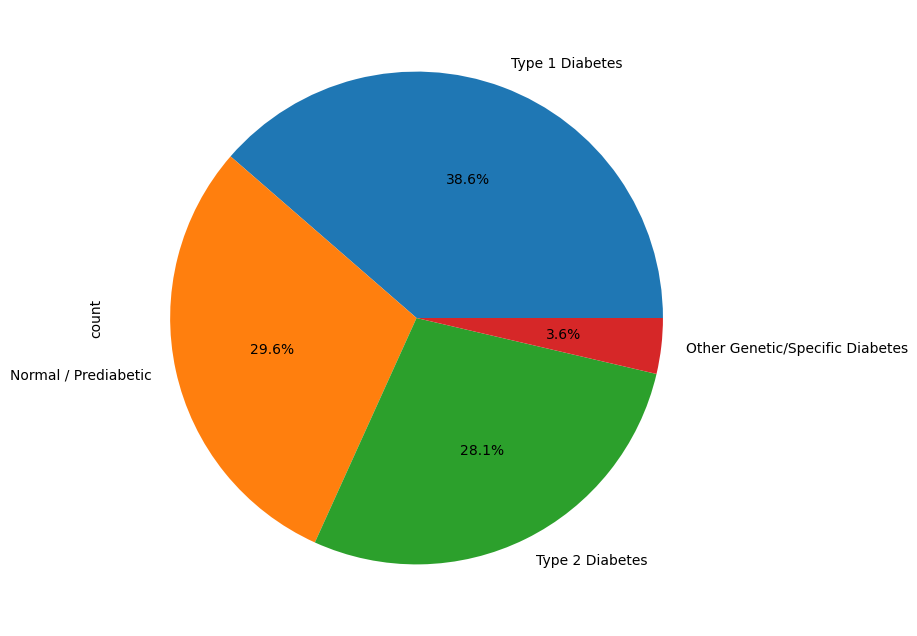

In [36]:
df['Target'].value_counts().plot(kind='pie',autopct='%.1f%%')

Text(0, 0.5, 'Count of Target')

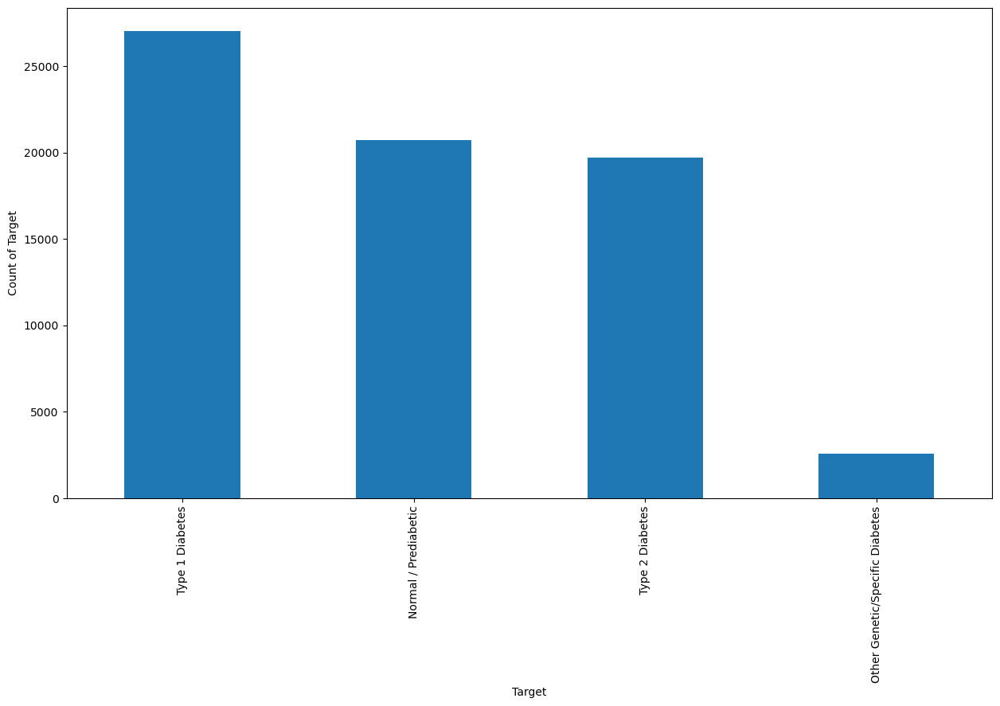

In [35]:
df['Target'].value_counts().plot(kind='bar')
plt.ylabel("Count of Target")

In [36]:
# the target variable is split into 4 types, Type 1 Diabetes, Normal / Prediabetic ,Type 2 Diabetes,Other Genetic/Specific Diabetes 
#with percentage of share 38.6%, 29.6%, 28.1%, 3.6% respectively
# we can observe that data consists of high number of type 1 diabetes, followed by normal/prediabetic, then followed by type 2 diabetes and other genetic 



### Numeric variable

In [37]:
df[num].skew()

Insulin Levels                  0.705479
Age                             0.227190
BMI                             0.089773
Blood Pressure                 -0.382162
Cholesterol Levels              0.261133
Waist Circumference             0.374428
Weight Gain During Pregnancy    0.157372
Pancreatic Health               0.177827
Pulmonary Function             -0.812655
Digestive Enzyme Levels        -0.032288
Birth Weight                   -0.205796
dtype: float64

In [38]:
# We can obserev that Insulin Levels is positively skewed
# And Pulmonary Function is negatively skewed

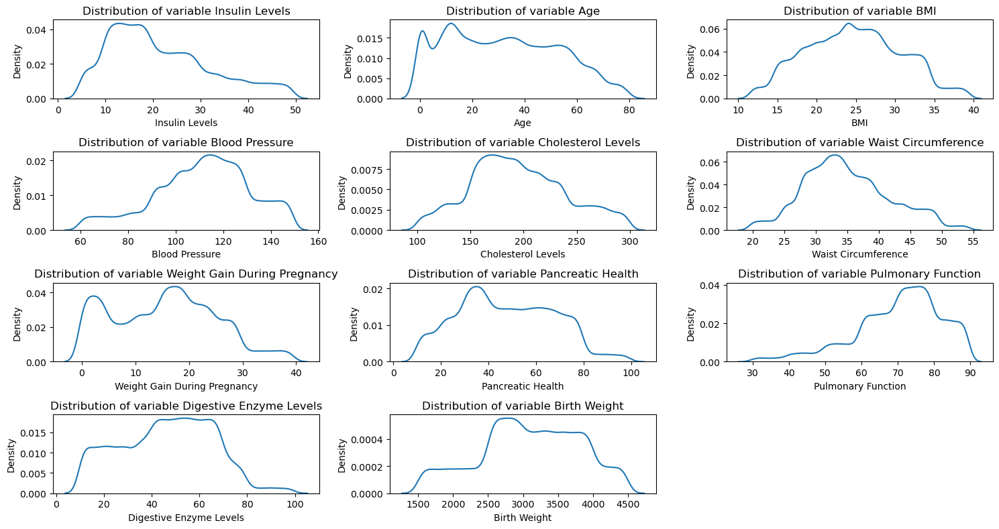

In [39]:
t=1
for i in num:
    plt.subplot(4,3,t)
    sns.kdeplot(df[i])
    plt.title(f'Distribution of variable {i}')
    t+=1
plt.tight_layout()
plt.show()

In [40]:
#We can visually confirm on the same observed in the values of the skewness
# we can observe that the data is skewed, with Pulmonary Function and Insulin Levels having high skewness

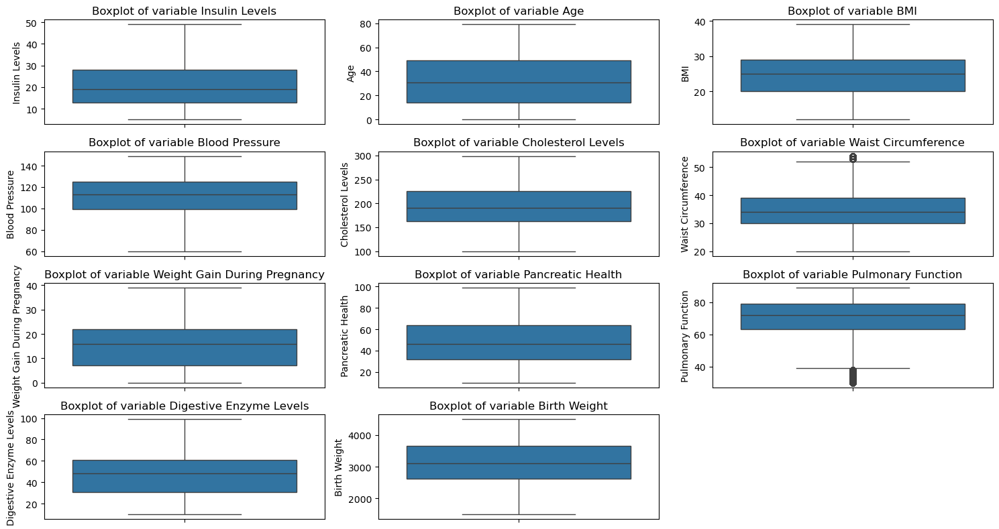

In [41]:
# Check for outliers
t=1
for i in num:
    plt.subplot(4,3,t)
    sns.boxplot(df[i])
    plt.title(f'Boxplot of variable {i}')
    t+=1
plt.tight_layout()
plt.show()

In [42]:
# we can observe certain outliers in Pulmonary Function and Waist Circumference. We need to treat these outliers if required.

In [43]:
df.columns

Index(['Target', 'Genetic Markers', 'Autoantibodies', 'Family History',
       'Environmental Factors', 'Insulin Levels', 'Age', 'BMI',
       'Physical Activity', 'Dietary Habits', 'Blood Pressure',
       'Cholesterol Levels', 'Waist Circumference', 'Ethnicity',
       'Socioeconomic Factors', 'Smoking Status', 'Alcohol Consumption',
       'Glucose Tolerance Test', 'History of PCOS',
       'Previous Gestational Diabetes', 'Pregnancy History',
       'Weight Gain During Pregnancy', 'Pancreatic Health',
       'Pulmonary Function', 'Cystic Fibrosis Diagnosis',
       'Steroid Use History', 'Genetic Testing', 'Neurological Assessments',
       'Liver Function Tests', 'Digestive Enzyme Levels', 'Urine Test',
       'Birth Weight', 'Early Onset Symptoms'],
      dtype='object')

In [44]:
q1=df['Waist Circumference'].quantile(0.25)
q3=df['Waist Circumference'].quantile(0.75)
iqr=q3-q1
df_subset=df[(df['Waist Circumference']>(q3+1.5*iqr))]
df_subset

,Target,Genetic Markers,Autoantibodies,Family History,Environmental Factors,Insulin Levels,Age,BMI,Physical Activity,Dietary Habits,Blood Pressure,Cholesterol Levels,Waist Circumference,Ethnicity,Socioeconomic Factors,Smoking Status,Alcohol Consumption,Glucose Tolerance Test,History of PCOS,Previous Gestational Diabetes,Pregnancy History,Weight Gain During Pregnancy,Pancreatic Health,Pulmonary Function,Cystic Fibrosis Diagnosis,Steroid Use History,Genetic Testing,Neurological Assessments,Liver Function Tests,Digestive Enzyme Levels,Urine Test,Birth Weight,Early Onset Symptoms
SI.No,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
236,Type 1 Diabetes,Negative,Negative,No,Absent,33,56,21,Moderate,Healthy,149,210,53,High Risk,Medium,Smoker,Low,Abnormal,Yes,Yes,Normal,18,30,77,Yes,No,Positive,3,Normal,47,Ketones Present,3132,No
300,Type 2 Diabetes,Negative,Negative,Yes,Absent,17,38,35,High,Healthy,135,293,54,Low Risk,High,Smoker,Moderate,Abnormal,No,No,Normal,26,29,70,Yes,No,Negative,3,Abnormal,66,Glucose Present,3288,No
323,Type 2 Diabetes,Negative,Negative,Yes,Absent,26,61,37,Moderate,Unhealthy,118,289,54,High Risk,Low,Non-Smoker,Low,Abnormal,Yes,No,Normal,24,68,69,No,No,Negative,2,Normal,65,Protein Present,3279,No
537,Type 2 Diabetes,Positive,Positive,No,Present,30,31,38,Low,Healthy,145,278,53,Low Risk,Low,Non-Smoker,Moderate,Abnormal,Yes,Yes,Complications,26,61,63,No,No,Positive,2,Abnormal,64,Ketones Present,4289,Yes
552,Type 2 Diabetes,Negative,Positive,No,Absent,35,57,32,Low,Healthy,133,243,54,Low Risk,Medium,Smoker,Moderate,Abnormal,Yes,No,Complications,28,71,73,Yes,Yes,Positive,2,Abnormal,53,Glucose Present,3554,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69442,Type 1 Diabetes,Positive,Negative,Yes,Absent,32,66,26,Low,Unhealthy,130,244,54,Low Risk,High,Smoker,Low,Abnormal,No,Yes,Normal,22,36,64,Yes,No,Negative,2,Abnormal,33,Ketones Present,3979,Yes
69505,Type 2 Diabetes,Positive,Positive,No,Absent,20,42,24,High,Healthy,116,290,54,High Risk,Medium,Smoker,Low,Abnormal,No,Yes,Complications,21,51,73,Yes,No,Positive,2,Abnormal,64,Glucose Present,3422,Yes
69637,Type 1 Diabetes,Positive,Negative,No,Present,25,65,34,High,Healthy,140,283,54,Low Risk,Medium,Non-Smoker,High,Normal,No,Yes,Complications,16,36,72,Yes,Yes,Positive,2,Abnormal,50,Ketones Present,3814,No


### Categoric Variable

In [45]:
for i in cat:
    print(df[i].value_counts(normalize=True)*100)
    print("--------------------------")

Target
Type 1 Diabetes                    38.614286
Normal / Prediabetic               29.617143
Type 2 Diabetes                    28.121429
Other Genetic/Specific Diabetes     3.647143
Name: proportion, dtype: float64
--------------------------
Genetic Markers
Positive    50.144286
Negative    49.855714
Name: proportion, dtype: float64
--------------------------
Autoantibodies
Negative    50.082857
Positive    49.917143
Name: proportion, dtype: float64
--------------------------
Family History
Yes    50.24
No     49.76
Name: proportion, dtype: float64
--------------------------
Environmental Factors
Absent     50.125714
Present    49.874286
Name: proportion, dtype: float64
--------------------------
Physical Activity
Moderate    33.467143
Low         33.354286
High        33.178571
Name: proportion, dtype: float64
--------------------------
Dietary Habits
Healthy      50.028571
Unhealthy    49.971429
Name: proportion, dtype: float64
--------------------------
Ethnicity
Low Risk     5

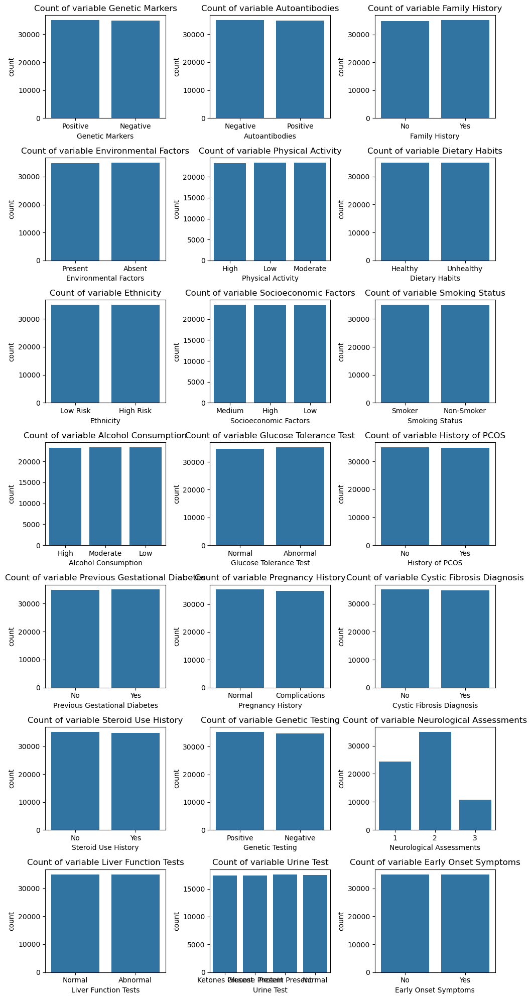

In [46]:
plt.figure(figsize=(10,20))
t=1
for i in cat:
    if i!='Target':
        plt.subplot(7,3,t)
        sns.countplot(x=df[i])
        plt.title(f'Count of variable {i}')
        t+=1
plt.tight_layout()
plt.show()

In [47]:
# we can observe that all the categoric variable are almost equally divided
# for Neurological Assessments, majority is type 2

## Bivariate analysis

### Target vs Numeric

In [45]:
for i in num:
        print(df.groupby('Target')[i].mean())
        print('---------------------------------------------------')

Target
Normal / Prediabetic               19.219564
Other Genetic/Specific Diabetes    14.504896
Type 1 Diabetes                    22.221717
Type 2 Diabetes                    24.200000
Name: Insulin Levels, dtype: float64
---------------------------------------------------
Target
Normal / Prediabetic               30.162888
Other Genetic/Specific Diabetes    11.944771
Type 1 Diabetes                    32.206030
Type 2 Diabetes                    36.326543
Name: Age, dtype: float64
---------------------------------------------------
Target
Normal / Prediabetic               24.647260
Other Genetic/Specific Diabetes    19.567568
Type 1 Diabetes                    25.117647
Type 2 Diabetes                    25.142647
Name: BMI, dtype: float64
---------------------------------------------------
Target
Normal / Prediabetic               110.981092
Other Genetic/Specific Diabetes     94.477869
Type 1 Diabetes                    110.482205
Type 2 Diabetes                    115.081128
Nam

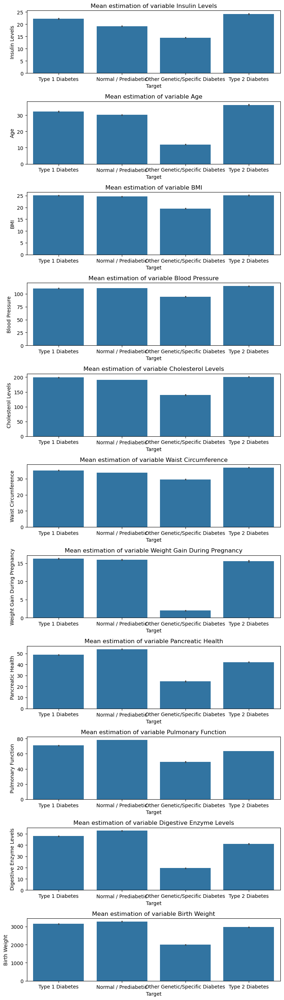

In [35]:
t=1
plt.figure(figsize=(8,30))
for i in num:
    plt.subplot(12,1,t)
    sns.barplot(x=df['Target'], y=df[i])
    plt.title(f'Mean estimation of variable {i}')
    t+=1
plt.tight_layout()
plt.show()

In [ ]:
#Average insulin levels are high for type 2 diabetes
#Average Age 
#Normal / Prediabetic    30.162888
#Type 1 Diabetes         32.206030
#Type 2 Diabetes         36.326543
#Other Genetic/Specific Diabetes        11.944771
#For type 2 diabetes the average blood pressure is also high
# Average Pancreatic health is low for type 2 Diabetes and other genetics/specific Diabetes

### Target Vs Categoric

In [36]:
t=1
for i in cat:
    if i!='Target':
        c_table=pd.crosstab(df['Target'],df[i])
    
        print(c_table)
        print("-------------------------------")
        t+=1
plt.tight_layout()
plt.show()    

Genetic Markers                  Negative  Positive
Target                                             
Normal / Prediabetic                10380     10352
Other Genetic/Specific Diabetes      1281      1272
Type 1 Diabetes                     13454     13576
Type 2 Diabetes                      9784      9901
-------------------------------
Autoantibodies                   Negative  Positive
Target                                             
Normal / Prediabetic                10374     10358
Other Genetic/Specific Diabetes      1304      1249
Type 1 Diabetes                     13541     13489
Type 2 Diabetes                      9839      9846
-------------------------------
Family History                      No    Yes
Target                                       
Normal / Prediabetic             10322  10410
Other Genetic/Specific Diabetes   1239   1314
Type 1 Diabetes                  13465  13565
Type 2 Diabetes                   9806   9879
-------------------------------
Envi

<Figure size 1500x800 with 0 Axes>

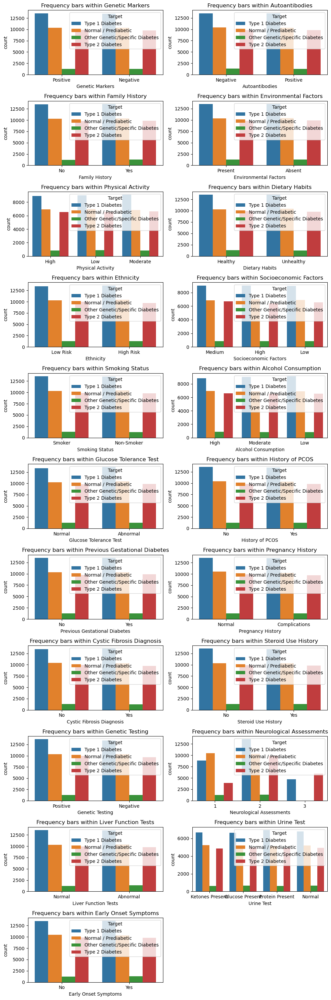

In [36]:
plt.figure(figsize=(10,30))
t=1 
for i in cat:
    if i!='Target':
        plt.subplot(11,2,t)
        sns.countplot(x=df[i],hue=df['Target'])
        plt.title(f'Frequency bars within {i}')
        t+=1
plt.tight_layout()
plt.show()

In [ ]:
# We can obserev widely that all the Target classes are almost equally distributed amoung all the categoric variables individually.
# In Neurological Assessments class 3 is not there for Normal / Prediabetic and Other Genetic/Specific Diabetes

### Numeric Vs Numeric

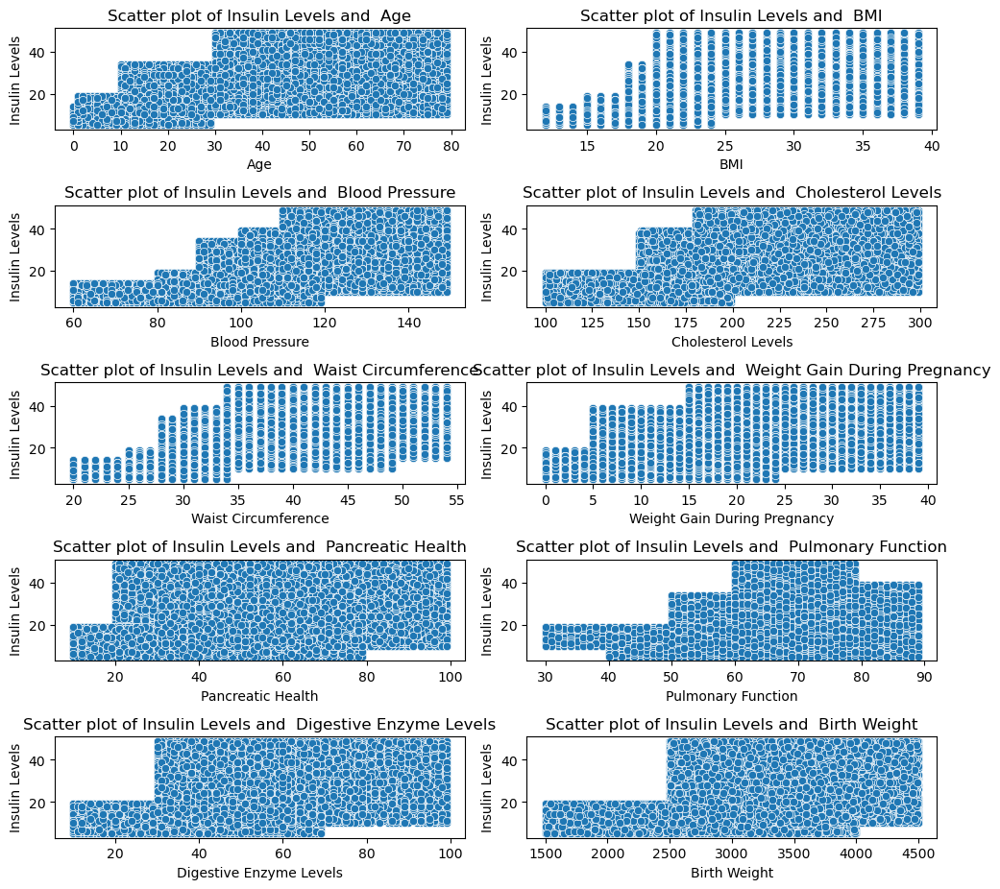

In [62]:
#Scatter plot of Insulin Levels and other Numeric features
plt.figure(figsize=(10,20))
t=1 
for i in num:
    if i!='Insulin Levels':
        plt.subplot(11,2,t)
        sns.scatterplot(x=df[i],y=df['Insulin Levels'])
        plt.title(f'Scatter plot of Insulin Levels and  {i}')
        t+=1
plt.tight_layout()
plt.show()

In [56]:
# We can observe a postive correlation between Insulin levels and each of the features 'Age','BMI','Blood Pressure','Cholesterol Levels','Waist Circumference','Weight Gain During Pregnancy'.
# The features 'Pancreatic Health','Pulmonary Function','Dig+estive Enzyme Levels','Birth Weight' doesnt show much correlation with Insulin levels

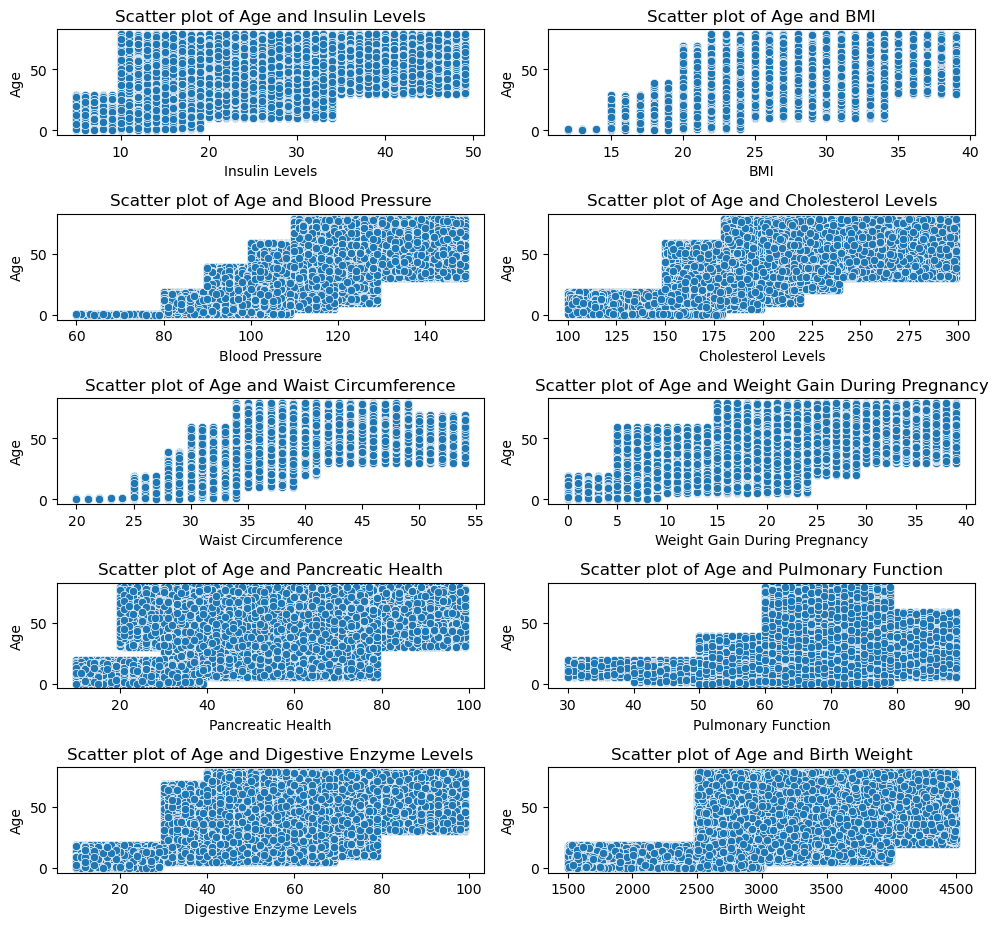

In [63]:
#Scatter plot of Age and other Numeric features
plt.figure(figsize=(10,20))
t=1 
for i in num:
    if i!='Age':
        plt.subplot(11,2,t)
        sns.scatterplot(x=df[i],y=df['Age'])
        plt.title(f'Scatter plot of Age and {i}')
        t+=1
plt.tight_layout()
plt.show()

In [ ]:
# We can observe a postive correlation between Age and each of the features 'Insulin Levels','BMI', 'Blood Pressure', 'Cholesterol Levels','Waist Circumference',
#'Weight Gain During Pregnancy','Digestive Enzyme Levels','Birth Weight'
# The features 'Pancreatic Health' and 'Pulmonary Function' doesnt show much correlation with Age

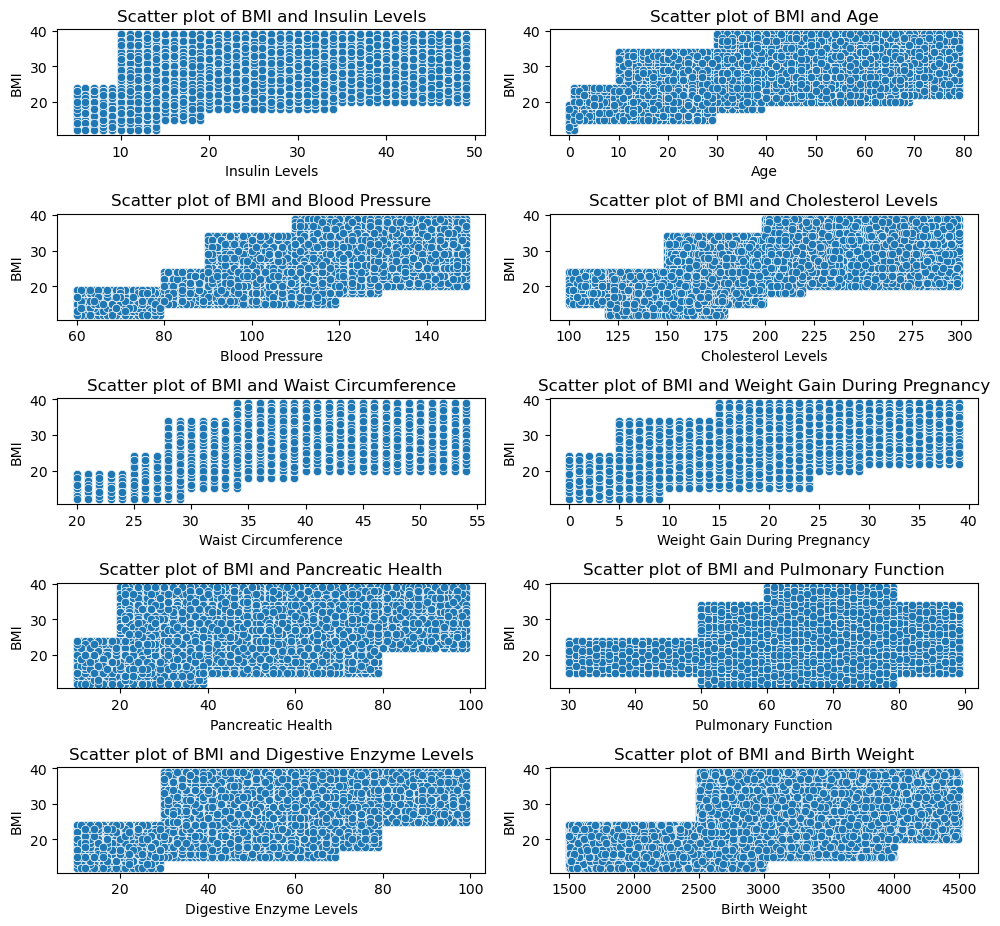

In [66]:
#Scatter plot of BMI and other Numeric features
plt.figure(figsize=(10,20))
t=1 
for i in num:
    if i!='BMI':
        plt.subplot(11,2,t)
        sns.scatterplot(x=df[i],y=df['BMI'])
        plt.title(f'Scatter plot of BMI and {i}')
        t+=1
plt.tight_layout()
plt.show()

In [ ]:
# We can observe a postive correlation between 'BMI' and each of the features 'Insulin Levels','Age','Blood Pressure','Cholesterol Levels',
#'Waist Circumference','Weight Gain During Pregnancy','Digestive Enzyme Levels','Birth Weight'.
# The features 'Pancreatic Health' and 'Pulmonary Function' doesnt show much correlation with 'BMI'.

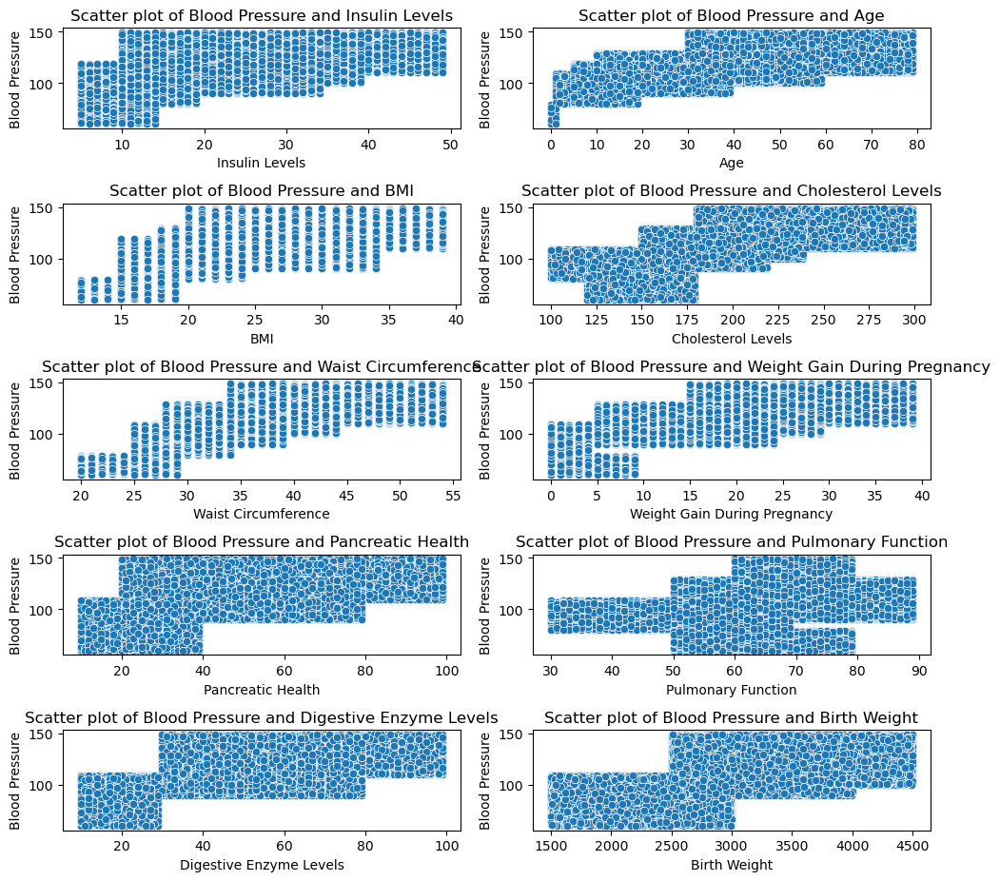

In [69]:
#Scatter plot of Blood Pressure and other Numeric features
plt.figure(figsize=(10,20))
t=1 
for i in num:
    if i!='Blood Pressure':
        plt.subplot(11,2,t)
        sns.scatterplot(x=df[i],y=df['Blood Pressure'])
        plt.title(f'Scatter plot of Blood Pressure and {i}')
        t+=1
plt.tight_layout()
plt.show()

In [ ]:
# We can observe a postive correlation between 'Blood Pressure' and each of the features 'Insulin Levels','Age','BMI','Cholesterol Levels',
#'Waist Circumference','Weight Gain During Pregnancy','Digestive Enzyme Levels','Birth Weight'.
# The features 'Pancreatic Health' and 'Pulmonary Function' doesnt show much correlation with 'Blood Pressure'.

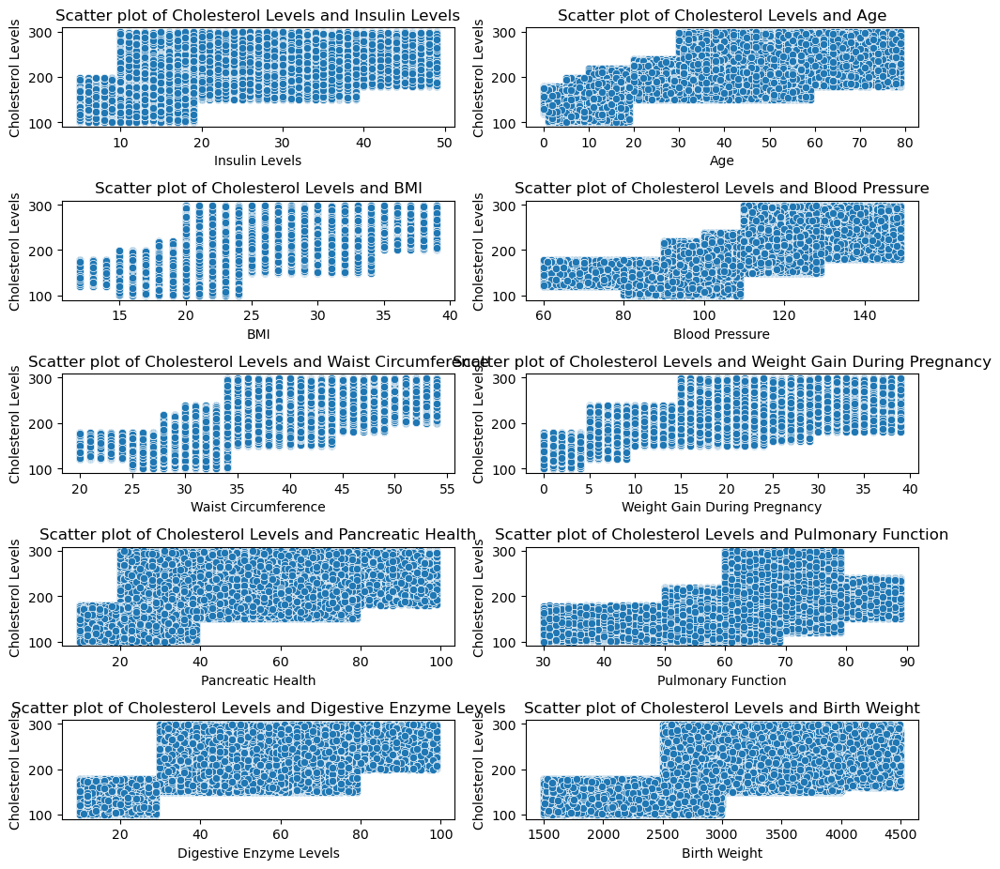

In [72]:
#Scatter plot of Cholesterol Levels and other Numeric features
plt.figure(figsize=(10,20))
t=1 
for i in num:
    if i!='Cholesterol Levels':
        plt.subplot(11,2,t)
        sns.scatterplot(x=df[i],y=df['Cholesterol Levels'])
        plt.title(f'Scatter plot of Cholesterol Levels and {i}')
        t+=1
plt.tight_layout()
plt.show()

In [74]:
# We can observe a postive correlation between 'Cholesterol Levels' and each of the features 'Insulin Levels','Age','BMI','Blood Pressure'
#'Waist Circumference','Weight Gain During Pregnancy','Digestive Enzyme Levels','Birth Weight'.
# The features 'Pancreatic Health' and 'Pulmonary Function' doesnt show much correlation with 'Cholesterol Levels'.

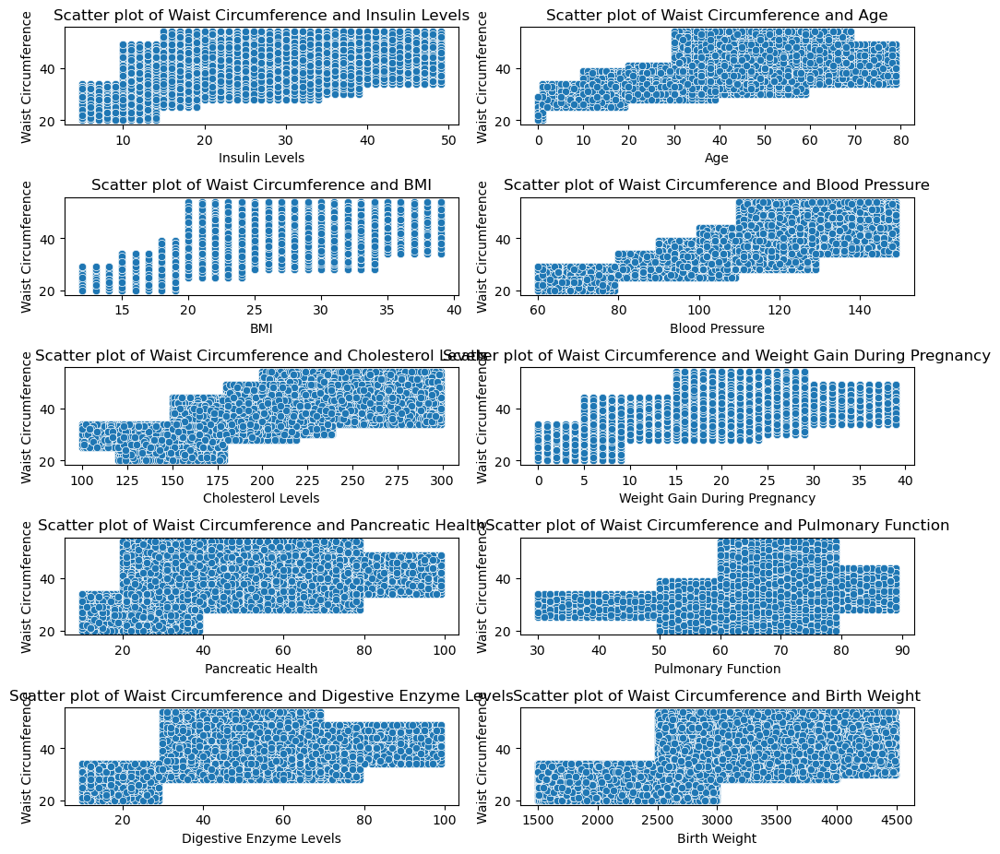

In [77]:
#Scatter plot of Waist Circumference and other Numeric features
plt.figure(figsize=(10,20))
t=1 
for i in num:
    if i!='Waist Circumference':
        plt.subplot(11,2,t)
        sns.scatterplot(x=df[i],y=df['Waist Circumference'])
        plt.title(f'Scatter plot of Waist Circumference and {i}')
        t+=1
plt.tight_layout()
plt.show()

In [ ]:
# We can observe a postive correlation between 'Waist Circumference' and each of the features 'Insulin Levels','Age','BMI','Blood Pressure'
#'Cholesterol Levels','Weight Gain During Pregnancy','Digestive Enzyme Levels','Birth Weight'.
# The features 'Pancreatic Health' and 'Pulmonary Function' doesnt show much correlation with 'Waist Circumference'.

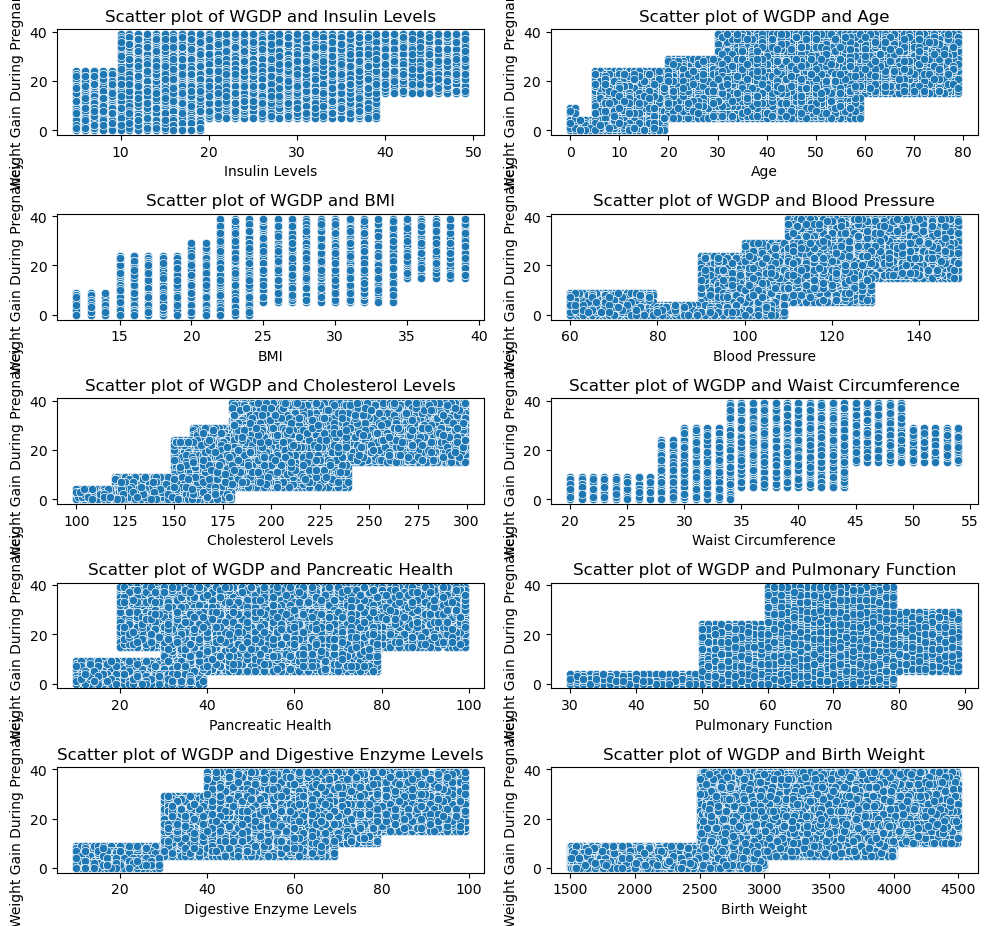

In [81]:
#Scatter plot of Weight Gain During Pregnancy and other Numeric features
plt.figure(figsize=(10,20))
t=1 
for i in num:
    if i!='Weight Gain During Pregnancy':
        plt.subplot(11,2,t)
        sns.scatterplot(x=df[i],y=df['Weight Gain During Pregnancy'])
        plt.title(f'Scatter plot of WGDP and {i}')
        t+=1
plt.tight_layout()
plt.show()

In [ ]:
# We can observe a postive correlation between 'Weight Gain During Pregnancy' and each of the features 'Insulin Levels','Age','BMI','Blood Pressure'
#'Cholesterol Levels','Waist Circumference','Digestive Enzyme Levels','Birth Weight'.
# The features 'Pancreatic Health' and 'Pulmonary Function' doesnt show much correlation with 'Weight Gain During Pregnancy'.

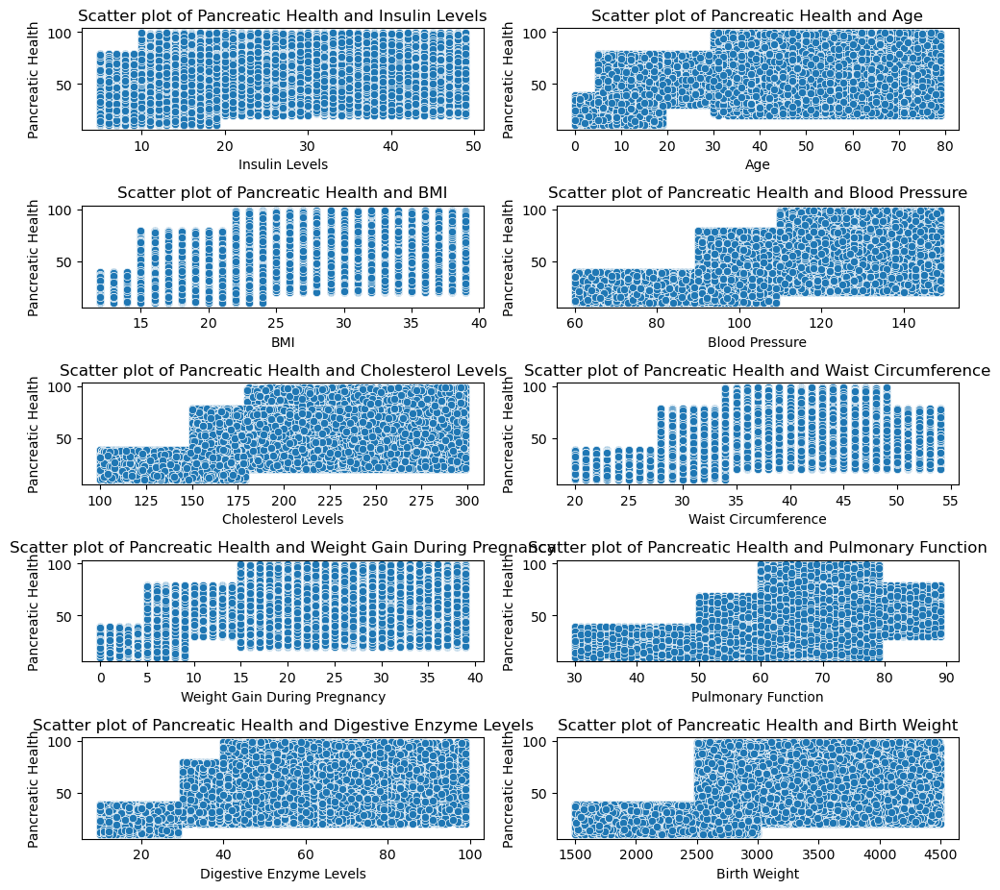

In [82]:
#Scatter plot of Pancreatic Health and other Numeric features
plt.figure(figsize=(10,20))
t=1 
for i in num:
    if i!='Pancreatic Health':
        plt.subplot(11,2,t)
        sns.scatterplot(x=df[i],y=df['Pancreatic Health'])
        plt.title(f'Scatter plot of Pancreatic Health and {i}')
        t+=1
plt.tight_layout()
plt.show()

In [ ]:
# We can observe that there is no corelation pattern between Pancreatic Health and other features

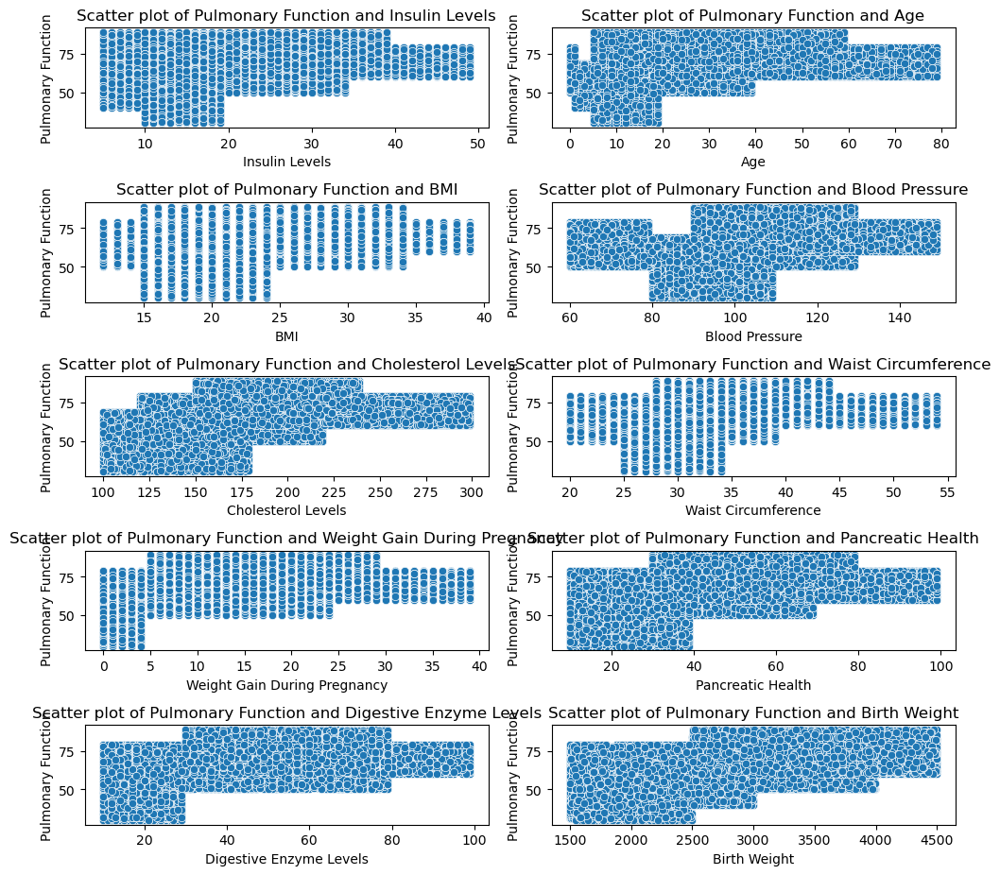

In [84]:
#Scatter plot of Pulmonary Function and other Numeric features
plt.figure(figsize=(10,20))
t=1 
for i in num:
    if i!='Pulmonary Function':
        plt.subplot(11,2,t)
        sns.scatterplot(x=df[i],y=df['Pulmonary Function'])
        plt.title(f'Scatter plot of Pulmonary Function and {i}')
        t+=1
plt.tight_layout()
plt.show()

In [ ]:
# We can observe that there is no corelation pattern between Pulmonary Function and other features

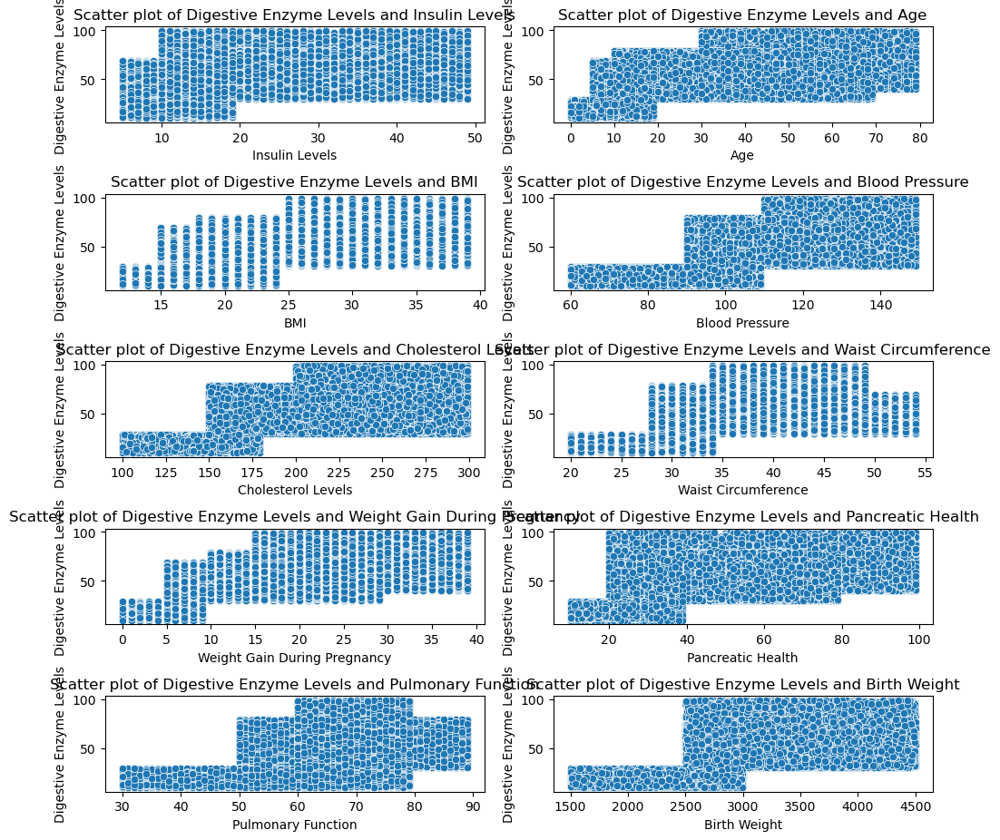

In [87]:
#Scatter plot of Digestive Enzyme Levels and other Numeric features
plt.figure(figsize=(10,20))
t=1 
for i in num:
    if i!='Digestive Enzyme Levels':
        plt.subplot(11,2,t)
        sns.scatterplot(x=df[i],y=df['Digestive Enzyme Levels'])
        plt.title(f'Scatter plot of Digestive Enzyme Levels and {i}')
        t+=1
plt.tight_layout()
plt.show()

In [ ]:
# We can observe a postive correlation between 'Digestive Enzyme Levels' and each of the features ,'Age','BMI','Blood Pressure'
#'Cholesterol Levels','Waist Circumference','Birth Weight','Pancreatic Health' and 'Pulmonary Function'
# The feature 'Insulin Levels' doesnt show much correlation with 'Digestive Enzyme Levels'.

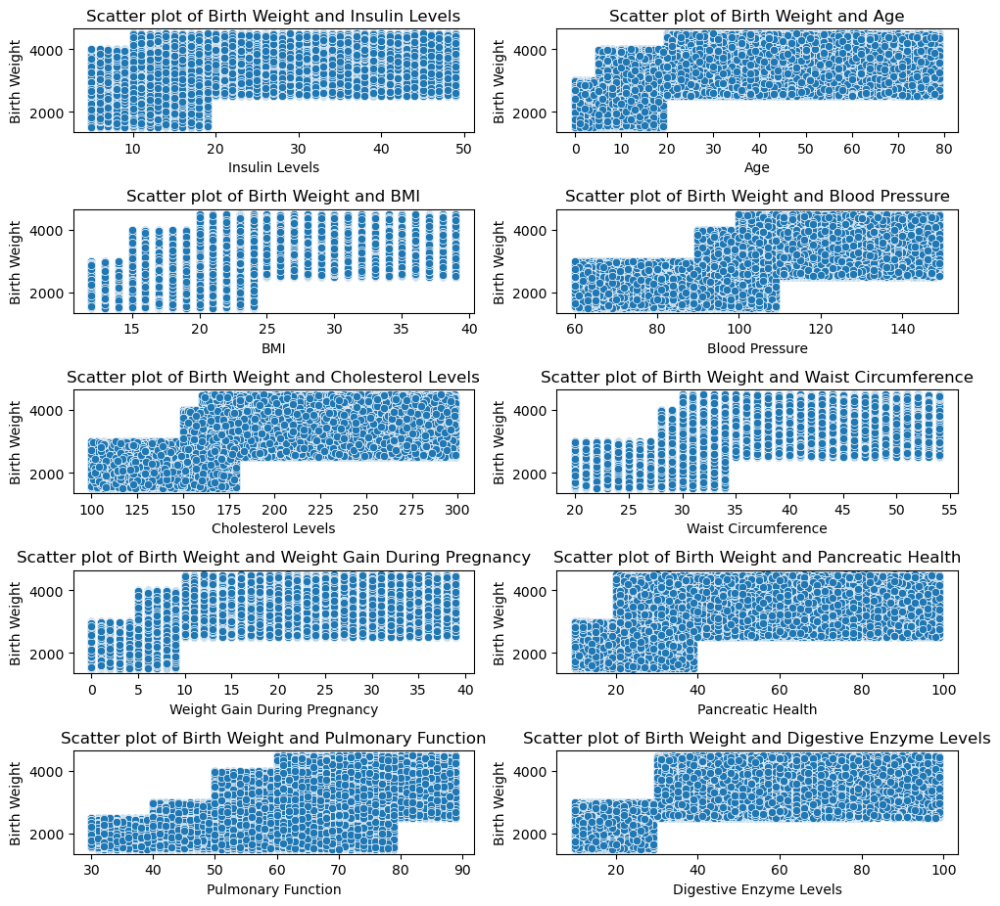

In [90]:
#Scatter plot of Birth Weight and other Numeric features
plt.figure(figsize=(10,20))
t=1 
for i in num:
    if i!='Birth Weight':
        plt.subplot(11,2,t)
        sns.scatterplot(x=df[i],y=df['Birth Weight'])
        plt.title(f'Scatter plot of Birth Weight and {i}')
        t+=1
plt.tight_layout()
plt.show()

In [ ]:
# We can observe a postive correlation between 'Birth Weight' and each of the features ,'Age','BMI','Blood Pressure'
#'Cholesterol Levels','Waist Circumference','Pancreatic Health'
# The feature 'Insulin Levels' ,'Pulmonary Function' doesnt show much correlation with 'Birth Weight'.

### Categoric Vs Categoric

In [111]:
cat_copy=cat[:]
cat_copy.remove('Target')

In [113]:
cat_copy

['Genetic Markers',
 'Autoantibodies',
 'Family History',
 'Environmental Factors',
 'Physical Activity',
 'Dietary Habits',
 'Ethnicity',
 'Socioeconomic Factors',
 'Smoking Status',
 'Alcohol Consumption',
 'Glucose Tolerance Test',
 'History of PCOS',
 'Previous Gestational Diabetes',
 'Pregnancy History',
 'Cystic Fibrosis Diagnosis',
 'Steroid Use History',
 'Genetic Testing',
 'Neurological Assessments',
 'Liver Function Tests',
 'Urine Test',
 'Early Onset Symptoms']

In [131]:
for col1 in df[cat_copy]:
    for col2 in df[cat_copy]:
        if col1 != col2:  # Avoid self-crosstabs
            print(f"Crosstab between {col1} and {col2}:\n")
            print(pd.crosstab(df[col1], df[col2]))
            print("-------------------")
            print("\n")


Crosstab between Genetic Markers and Autoantibodies:

Autoantibodies   Negative  Positive
Genetic Markers                    
Negative            17359     17540
Positive            17699     17402
-------------------


Crosstab between Genetic Markers and Family History:

Family History      No    Yes
Genetic Markers              
Negative         17486  17413
Positive         17346  17755
-------------------


Crosstab between Genetic Markers and Environmental Factors:

Environmental Factors  Absent  Present
Genetic Markers                       
Negative                17441    17458
Positive                17647    17454
-------------------


Crosstab between Genetic Markers and Physical Activity:

Physical Activity   High    Low  Moderate
Genetic Markers                          
Negative           11673  11623     11603
Positive           11552  11725     11824
-------------------


Crosstab between Genetic Markers and Dietary Habits:

Dietary Habits   Healthy  Unhealthy
Genetic 

In [ ]:
# We can observe the distribution of categoric variables with each other is balanced.(except for Neurological Assessments type3<type1<type2 )

### Numeric Vs Categoric

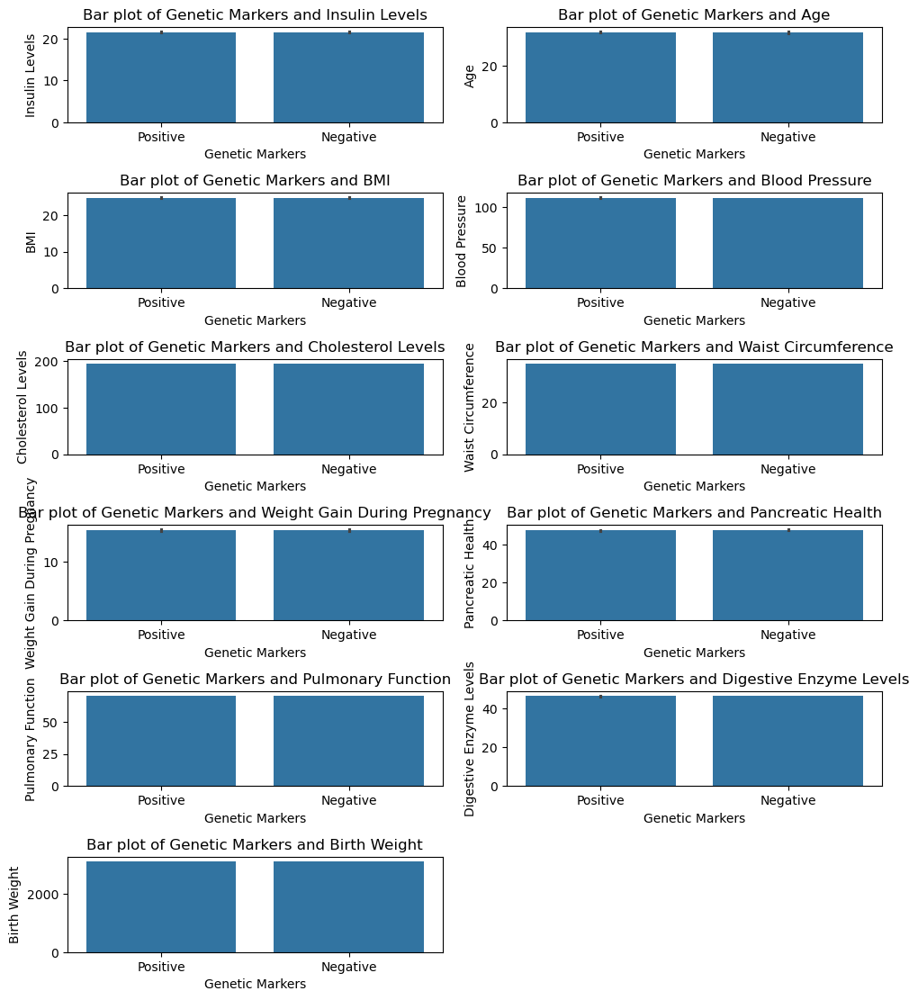

In [84]:
plt.figure(figsize=(10,20))
t=1 
for i in num:
        plt.subplot(11,2,t)
        sns.barplot(y=df[i],x=df['Genetic Markers'])
        plt.title(f'Bar plot of Genetic Markers and {i}')
        t+=1
plt.tight_layout()
plt.show()

In [ ]:
# We can observe that all the data is equally distributed for genetic markers across all the numeric variables

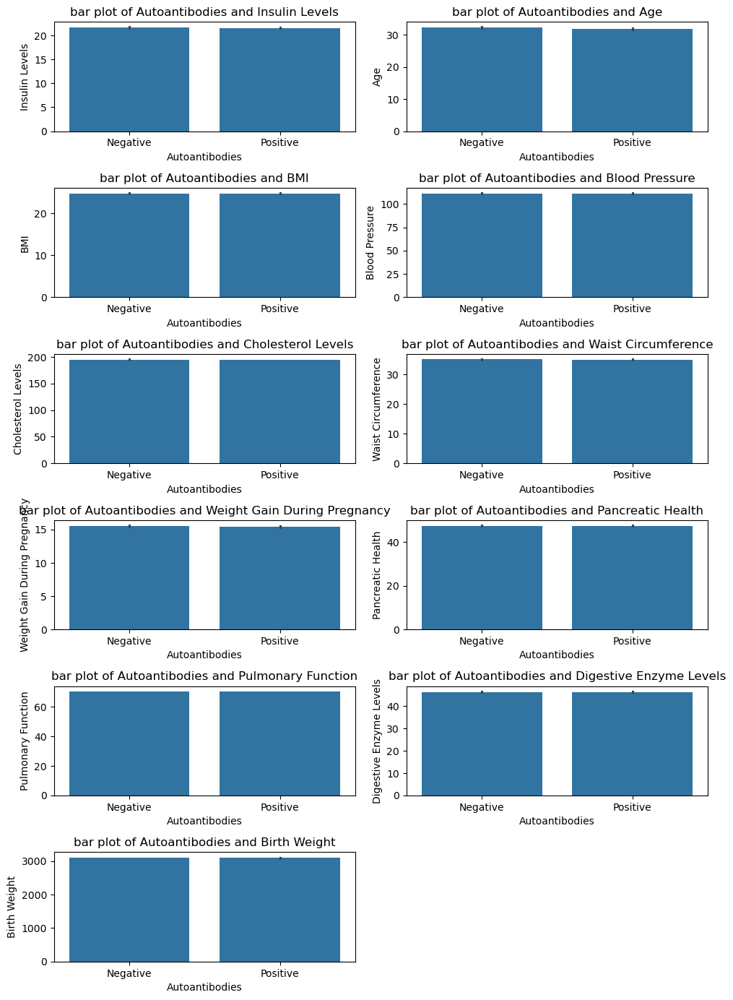

In [123]:
#Barplot of Autoantibodies with all the numeric

plt.figure(figsize=(10,25))
t=1 
for i in num:
        plt.subplot(11,2,t)
        sns.barplot(y=df[i],x=df['Autoantibodies'])
        plt.title(f'Bar plot of Autoantibodies and {i}')
        t+=1
plt.tight_layout()
plt.show()

In [ ]:
# We can observe that all the data is amost equally distributed for Autoantibodies across all the numeric variables

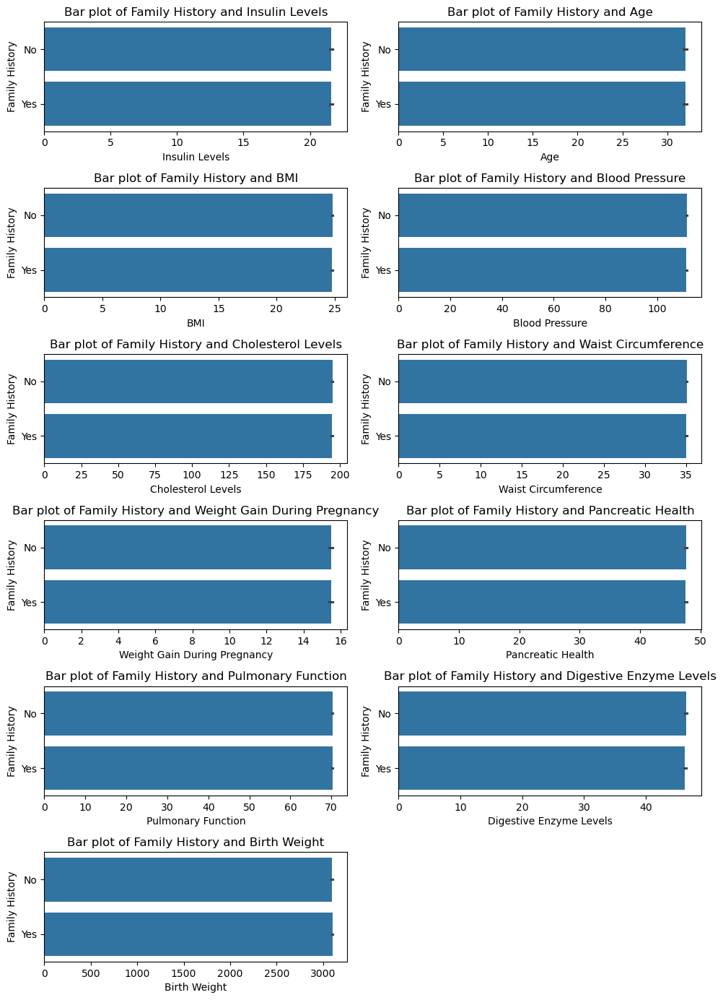

In [128]:
#Barplot of Family History with all the numeric

plt.figure(figsize=(10,25))
t=1 
for i in num:
        plt.subplot(11,2,t)
        sns.barplot(x=df[i],y=df['Family History'])
        plt.title(f'Bar plot of Family History and {i}')
        t+=1
plt.tight_layout()
plt.show()

In [ ]:
# We can observe that all the data is amost equally distributed for Family History across all the numeric variables

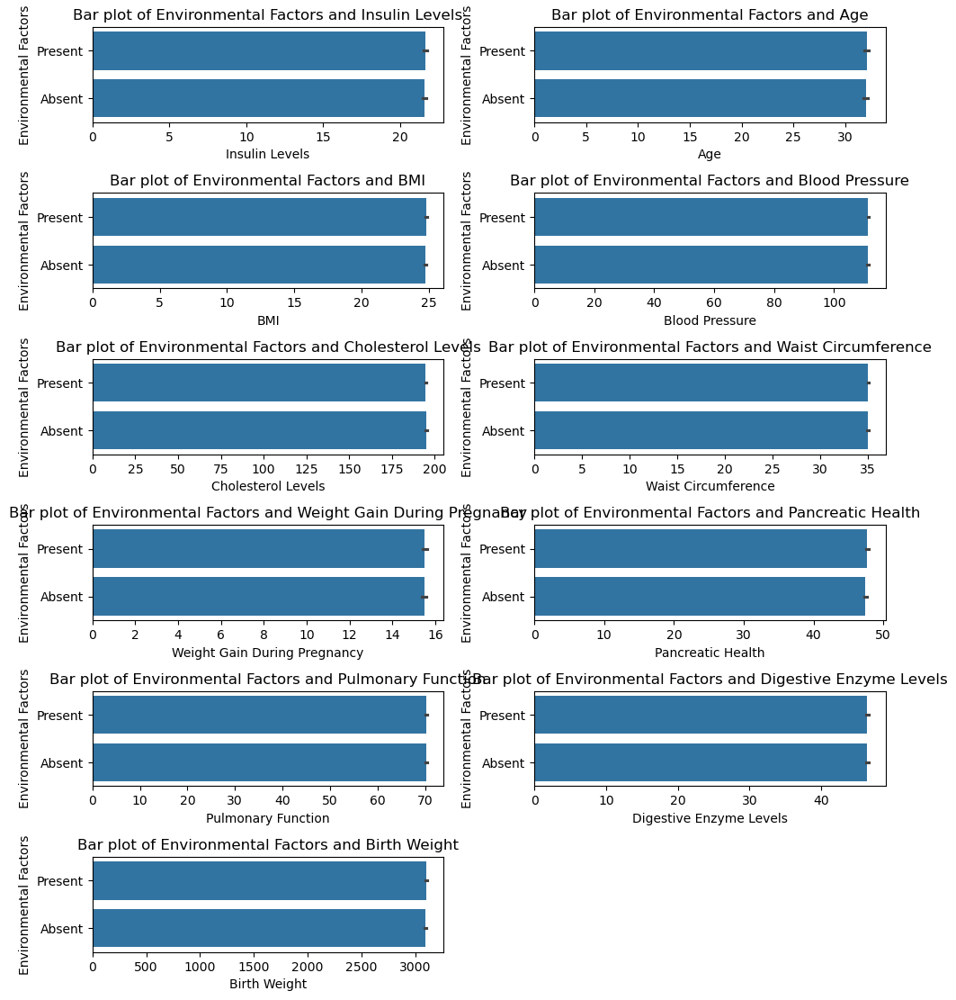

In [130]:
#Barplot of Environmental Factors with all the numeric

plt.figure(figsize=(10,20))
t=1 
for i in num:
        plt.subplot(11,2,t)
        sns.barplot(x=df[i],y=df['Environmental Factors'])
        plt.title(f'Bar plot of Environmental Factors and {i}')
        t+=1
plt.tight_layout()
plt.show()

In [ ]:
# We can observe that all the data is amost equally distributed for Environmental Factors across all the numeric variables

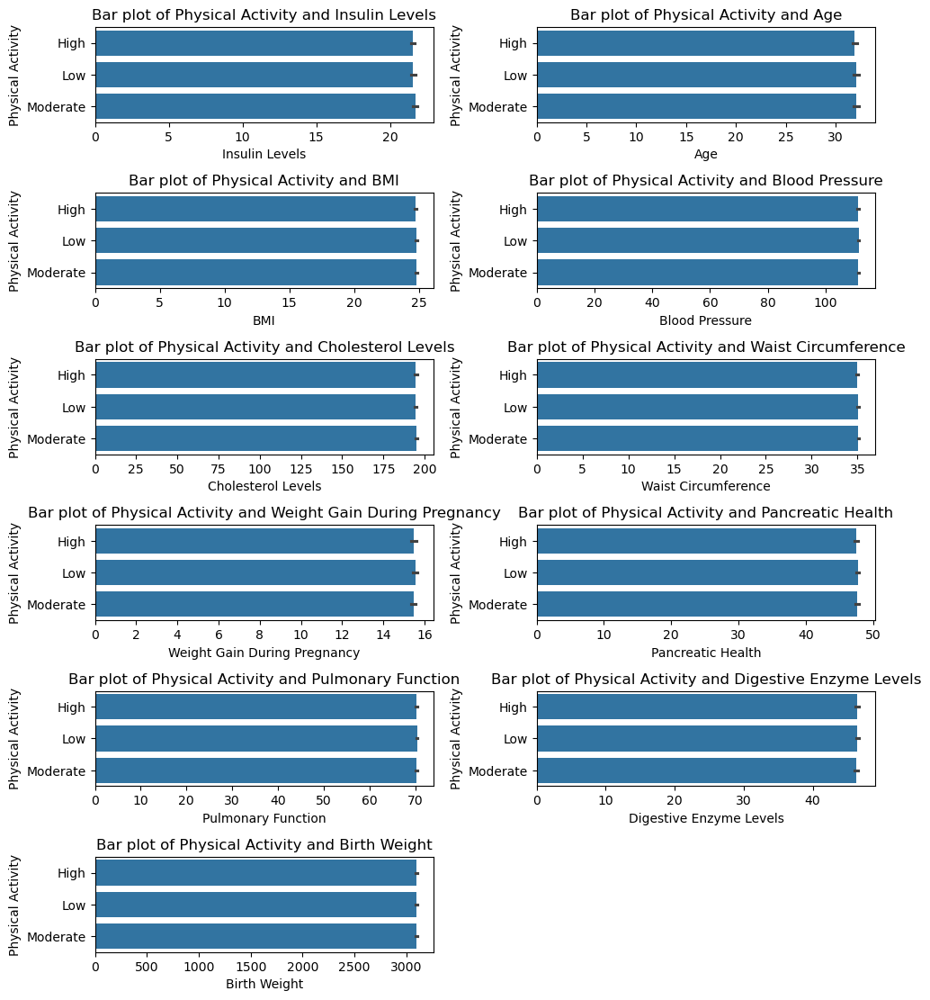

In [206]:
#Barplot of Physical Activity with all the numeric

plt.figure(figsize=(10,20))
t=1 
for i in num:
        plt.subplot(11,2,t)
        sns.barplot(x=df[i],y=df['Physical Activity'])
        plt.title(f'Bar plot of Physical Activity and {i}')
        t+=1
plt.tight_layout()
plt.show()

In [ ]:
# We can observe that all the data is amost equally distributed for Physical Activity across all the numeric variables

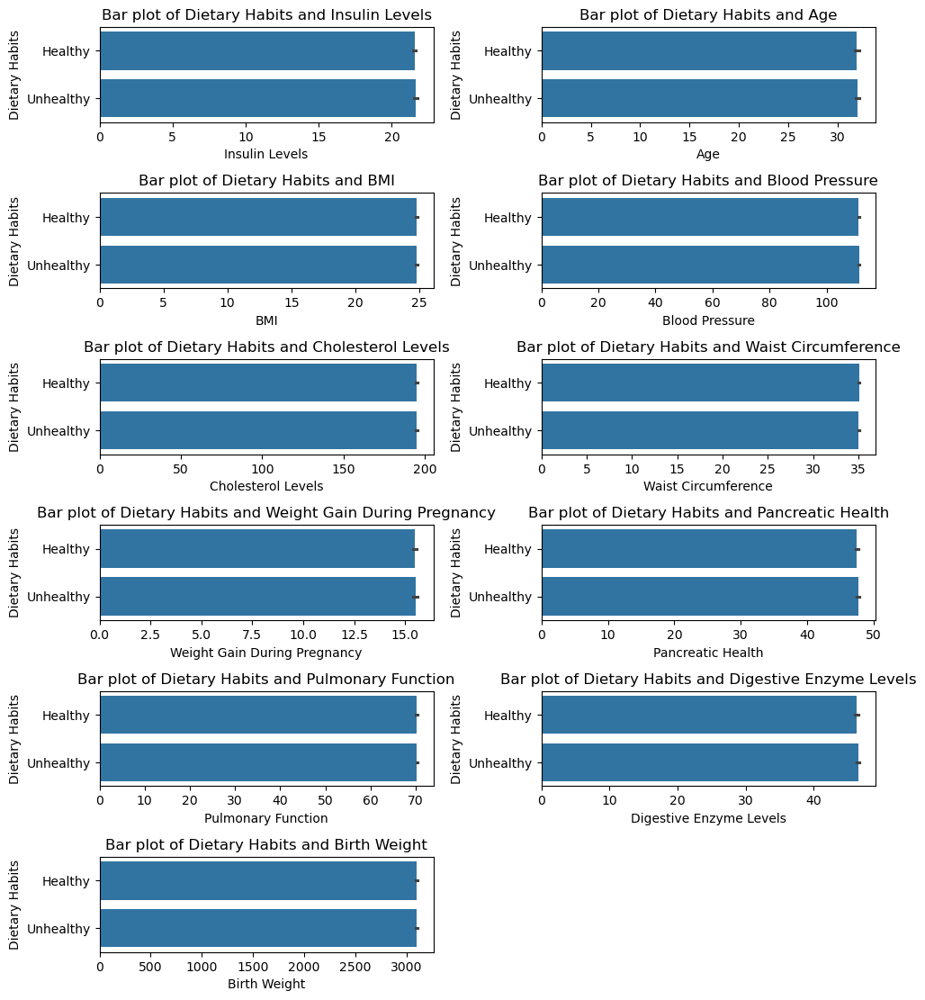

In [207]:
#Barplot of Dietary Habits with all the numeric

plt.figure(figsize=(10,20))
t=1 
for i in num:
        plt.subplot(11,2,t)
        sns.barplot(x=df[i],y=df['Dietary Habits'])
        plt.title(f'Bar plot of Dietary Habits and {i}')
        t+=1
plt.tight_layout()
plt.show()

In [ ]:
# We can observe that all the data is amost equally distributed for Dietary Habits across all the numeric variables

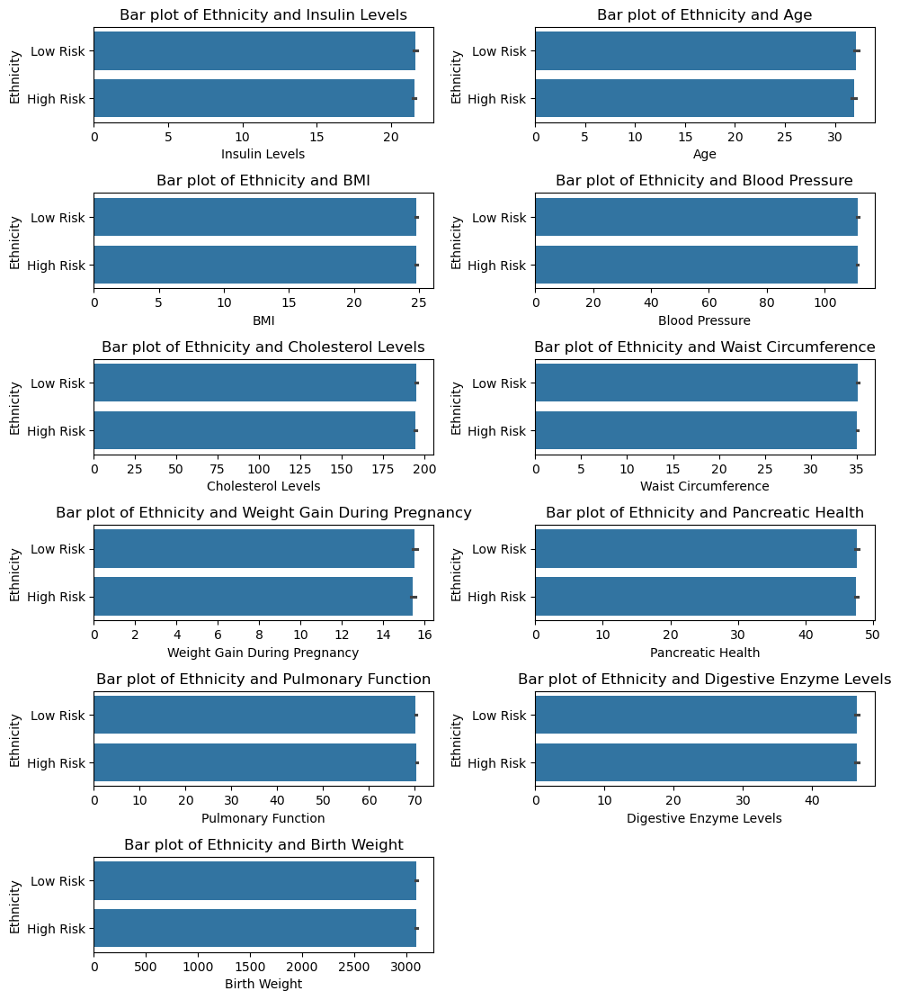

In [208]:
#Barplot of Ethnicity with all the numeric

plt.figure(figsize=(10,20))
t=1 
for i in num:
        plt.subplot(11,2,t)
        sns.barplot(x=df[i],y=df['Ethnicity'])
        plt.title(f'Bar plot of Ethnicity and {i}')
        t+=1
plt.tight_layout()
plt.show()

In [ ]:
# We can observe that all the data is amost equally distributed for Ethnicity across all the numeric variables

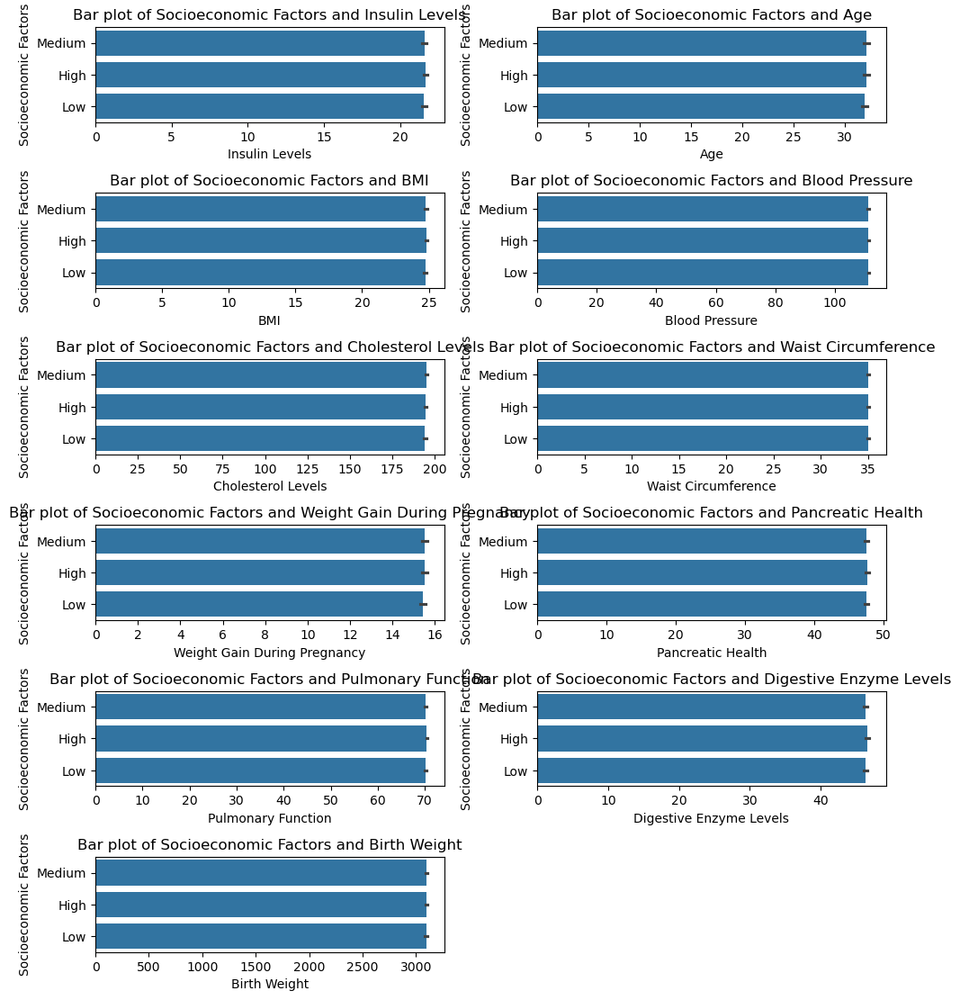

In [209]:
#Barplot of Socioeconomic Factors with all the numeric

plt.figure(figsize=(10,20))
t=1 
for i in num:
        plt.subplot(11,2,t)
        sns.barplot(x=df[i],y=df['Socioeconomic Factors'])
        plt.title(f'Bar plot of Socioeconomic Factors and {i}')
        t+=1
plt.tight_layout()
plt.show()

In [ ]:
# We can observe that all the data is amost equally distributed for Socioeconomic Factors across all the numeric variables

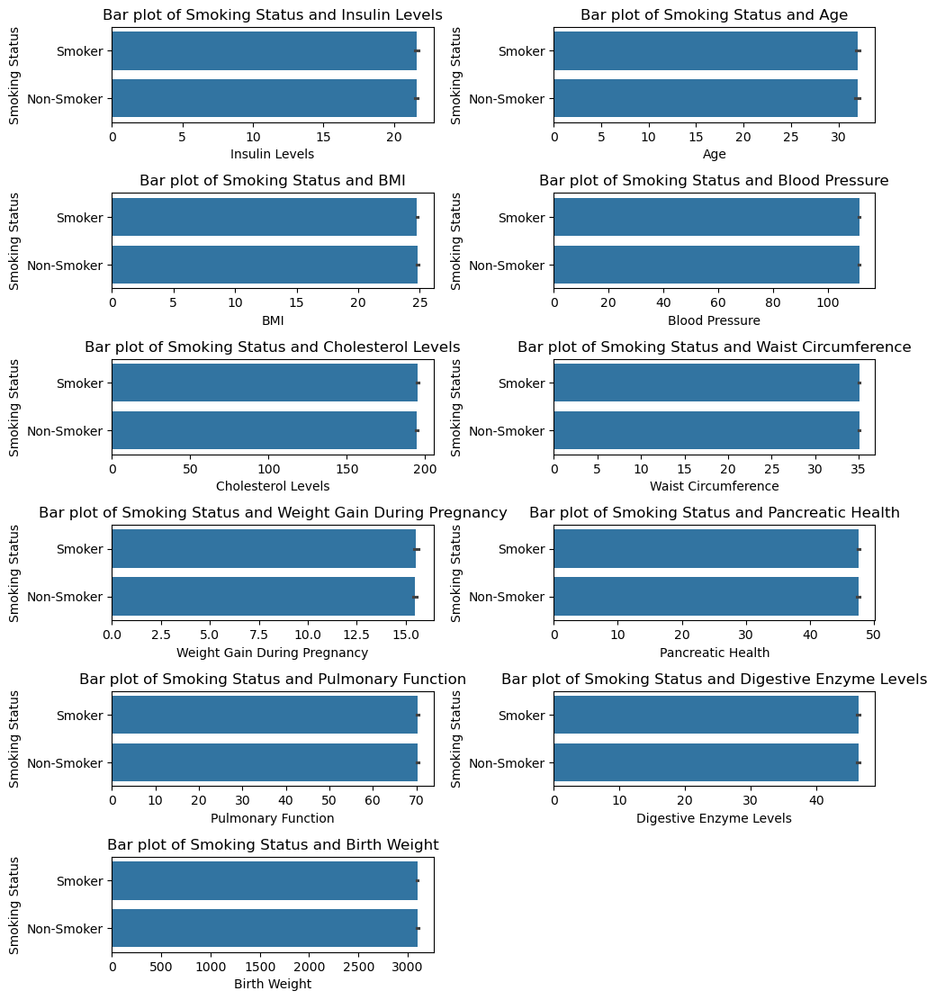

In [210]:
#Barplot of Smoking Status with all the numeric

plt.figure(figsize=(10,20))
t=1 
for i in num:
        plt.subplot(11,2,t)
        sns.barplot(x=df[i],y=df['Smoking Status'])
        plt.title(f'Bar plot of Smoking Status and {i}')
        t+=1
plt.tight_layout()
plt.show()

In [ ]:
# We can observe that all the data is amost equally distributed for Smoking Status across all the numeric variables

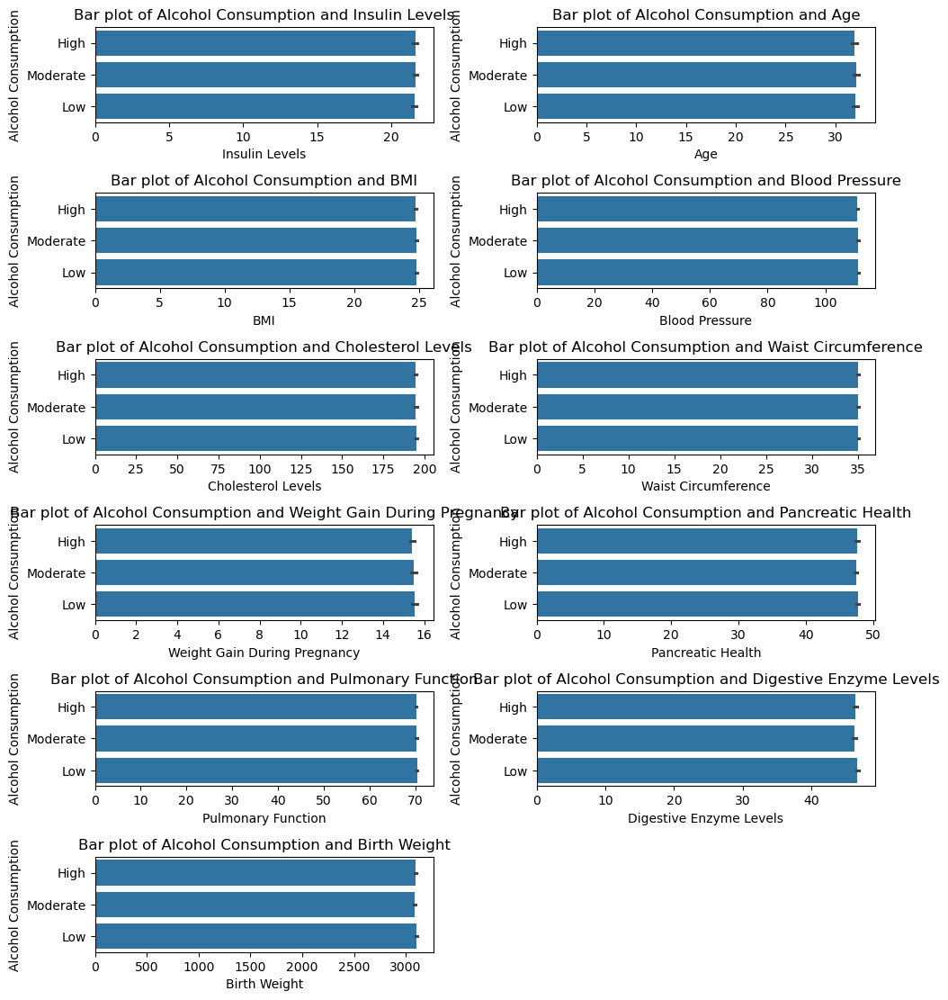

In [211]:
#Barplot of Alcohol Consumption with all the numeric

plt.figure(figsize=(10,20))
t=1 
for i in num:
        plt.subplot(11,2,t)
        sns.barplot(x=df[i],y=df['Alcohol Consumption'])
        plt.title(f'Bar plot of Alcohol Consumption and {i}')
        t+=1
plt.tight_layout()
plt.show()

In [ ]:
# We can observe that all the data is amost equally distributed for Alcohol Consumption across all the numeric variables

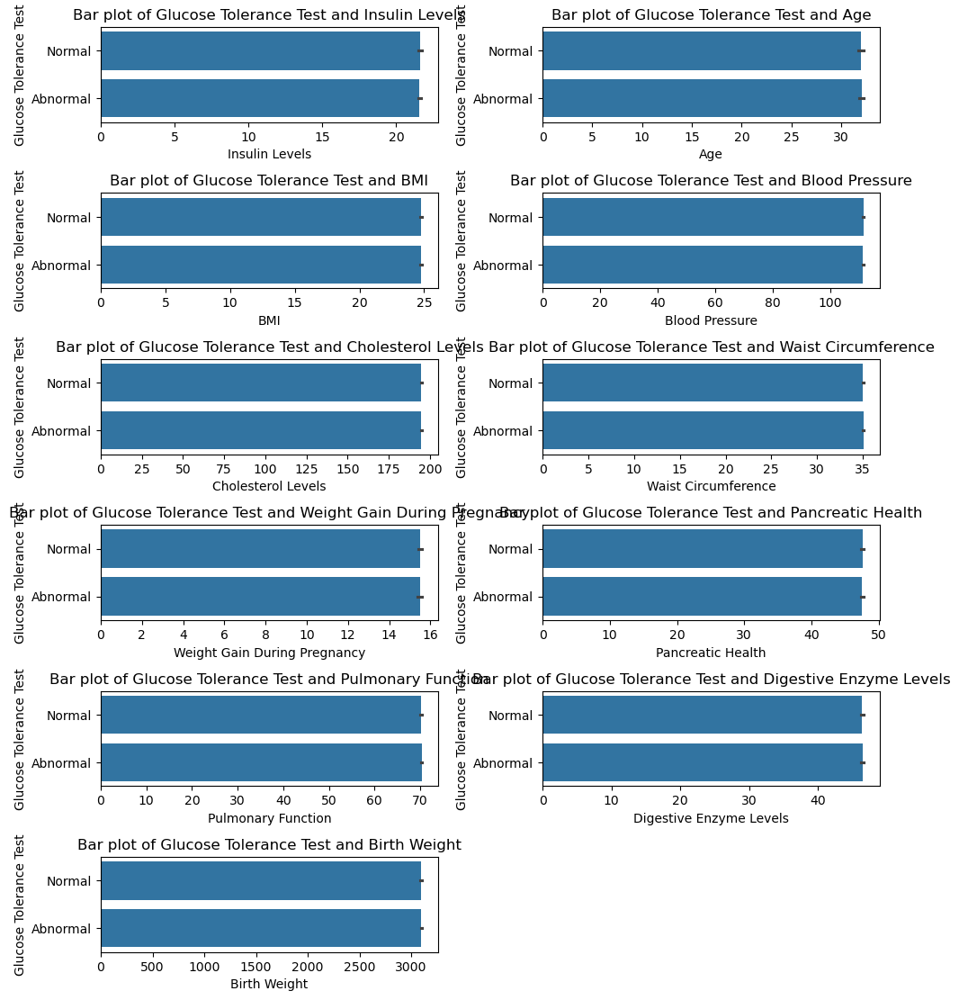

In [212]:
#Barplot of Glucose Tolerance Test with all the numeric

plt.figure(figsize=(10,20))
t=1 
for i in num:
        plt.subplot(11,2,t)
        sns.barplot(x=df[i],y=df['Glucose Tolerance Test'])
        plt.title(f'Bar plot of Glucose Tolerance Test and {i}')
        t+=1
plt.tight_layout()
plt.show()

In [ ]:
# We can observe that all the data is amost equally distributed for Glucose Tolerance Test across all the numeric variables

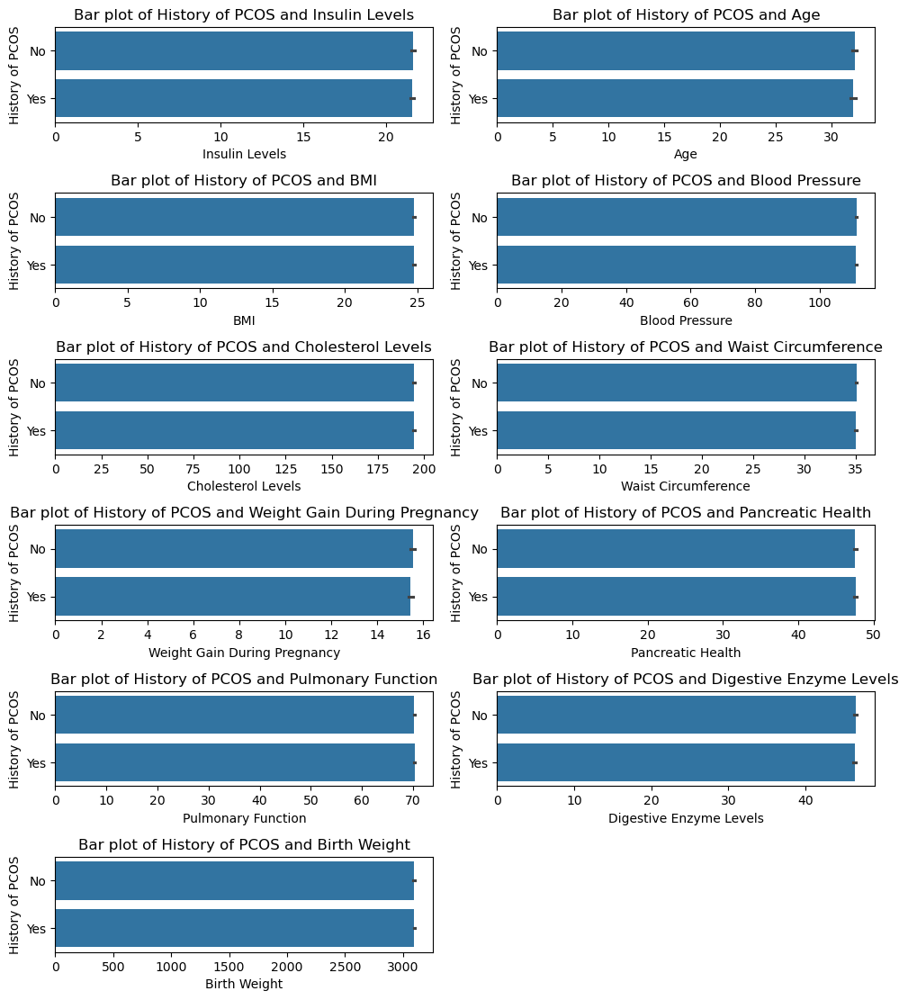

In [213]:
#Barplot of History of PCOS with all the numeric

plt.figure(figsize=(10,20))
t=1 
for i in num:
        plt.subplot(11,2,t)
        sns.barplot(x=df[i],y=df['History of PCOS'])
        plt.title(f'Bar plot of History of PCOS and {i}')
        t+=1
plt.tight_layout()
plt.show()

In [ ]:
# We can observe that all the data is amost equally distributed for History of PCOS across all the numeric variables

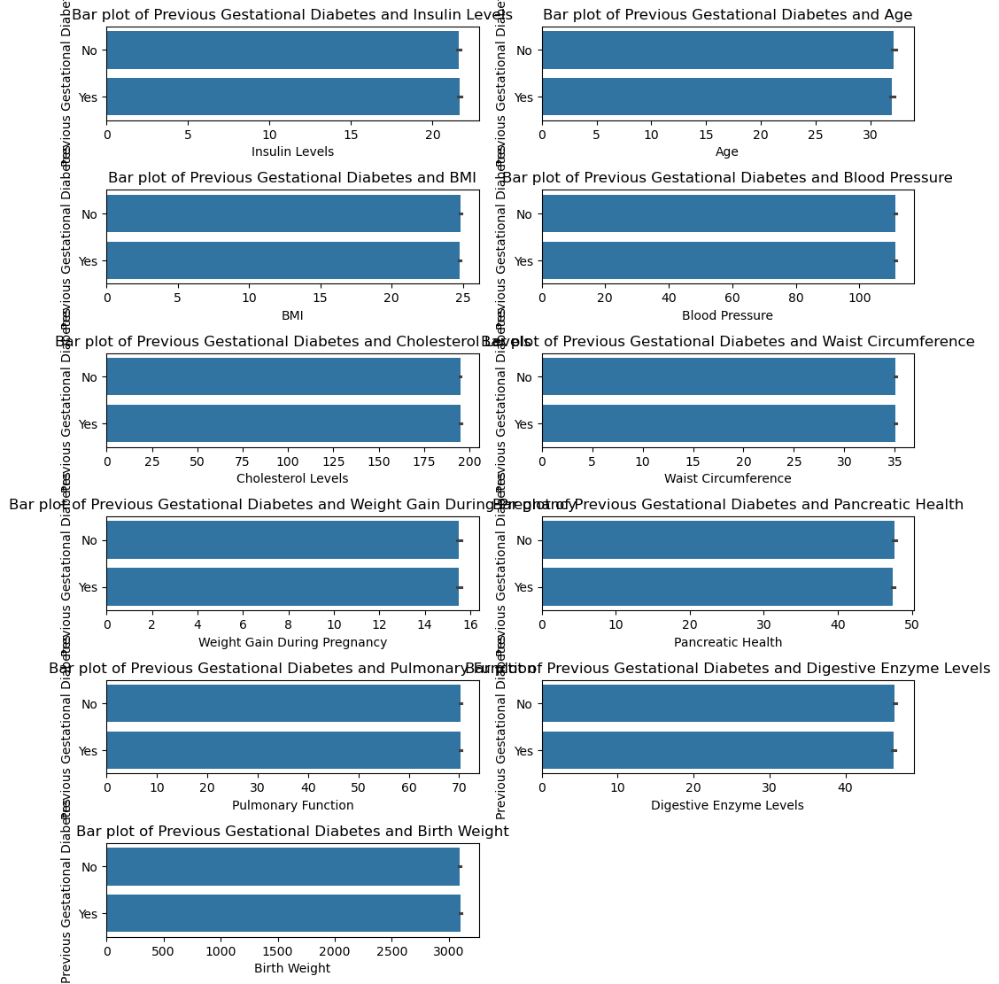

In [214]:
#Barplot of Previous Gestational Diabetes with all the numeric

plt.figure(figsize=(10,20))
t=1 
for i in num:
        plt.subplot(11,2,t)
        sns.barplot(x=df[i],y=df['Previous Gestational Diabetes'])
        plt.title(f'Bar plot of Previous Gestational Diabetes and {i}')
        t+=1
plt.tight_layout()
plt.show()

In [ ]:
# We can observe that all the data is amost equally distributed for Previous Gestational Diabetes across all the numeric variables

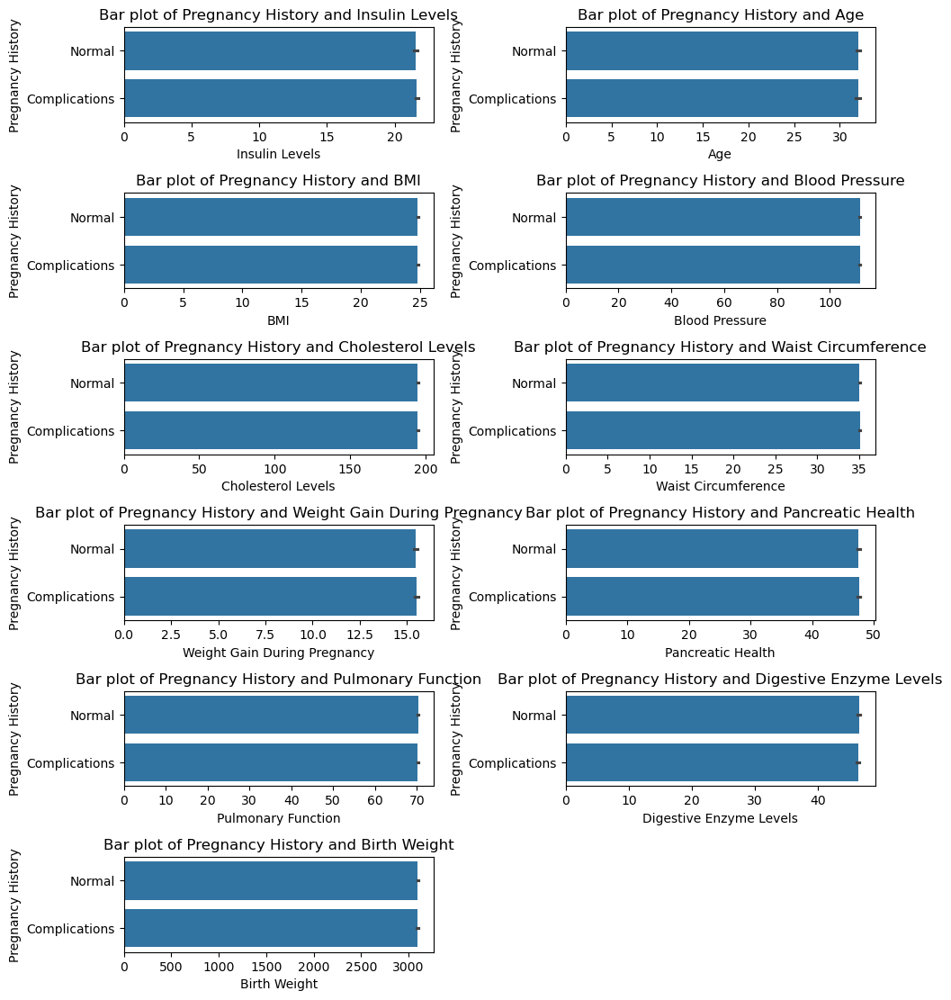

In [215]:
#Barplot of Pregnancy History with all the numeric

plt.figure(figsize=(10,20))
t=1 
for i in num:
        plt.subplot(11,2,t)
        sns.barplot(x=df[i],y=df['Pregnancy History'])
        plt.title(f'Bar plot of Pregnancy History and {i}')
        t+=1
plt.tight_layout()
plt.show()

In [ ]:
# We can observe that all the data is amost equally distributed for Pregnancy History across all the numeric variables

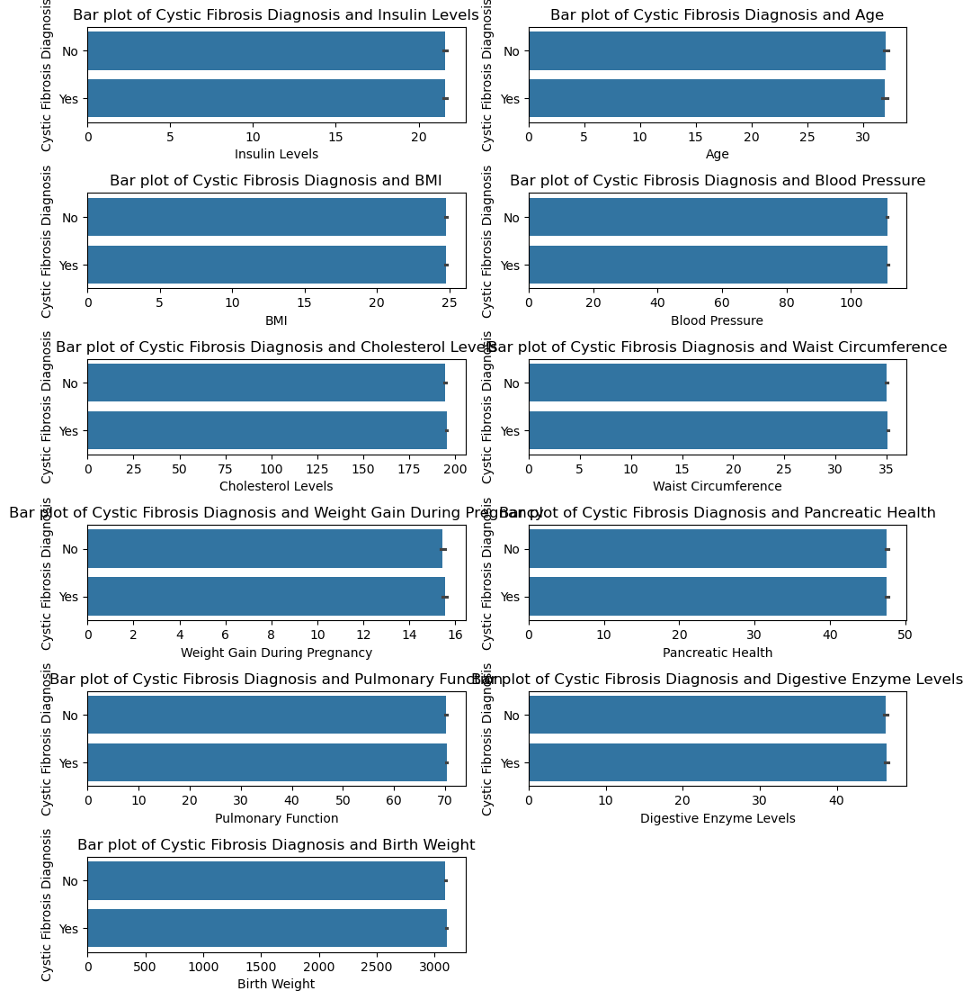

In [216]:
#Barplot of Cystic Fibrosis Diagnosis with all the numeric

plt.figure(figsize=(10,20))
t=1 
for i in num:
        plt.subplot(11,2,t)
        sns.barplot(x=df[i],y=df['Cystic Fibrosis Diagnosis'])
        plt.title(f'Bar plot of Cystic Fibrosis Diagnosis and {i}')
        t+=1
plt.tight_layout()
plt.show()

In [ ]:
# We can observe that all the data is amost equally distributed for Cystic Fibrosis Diagnosis across all the numeric variables

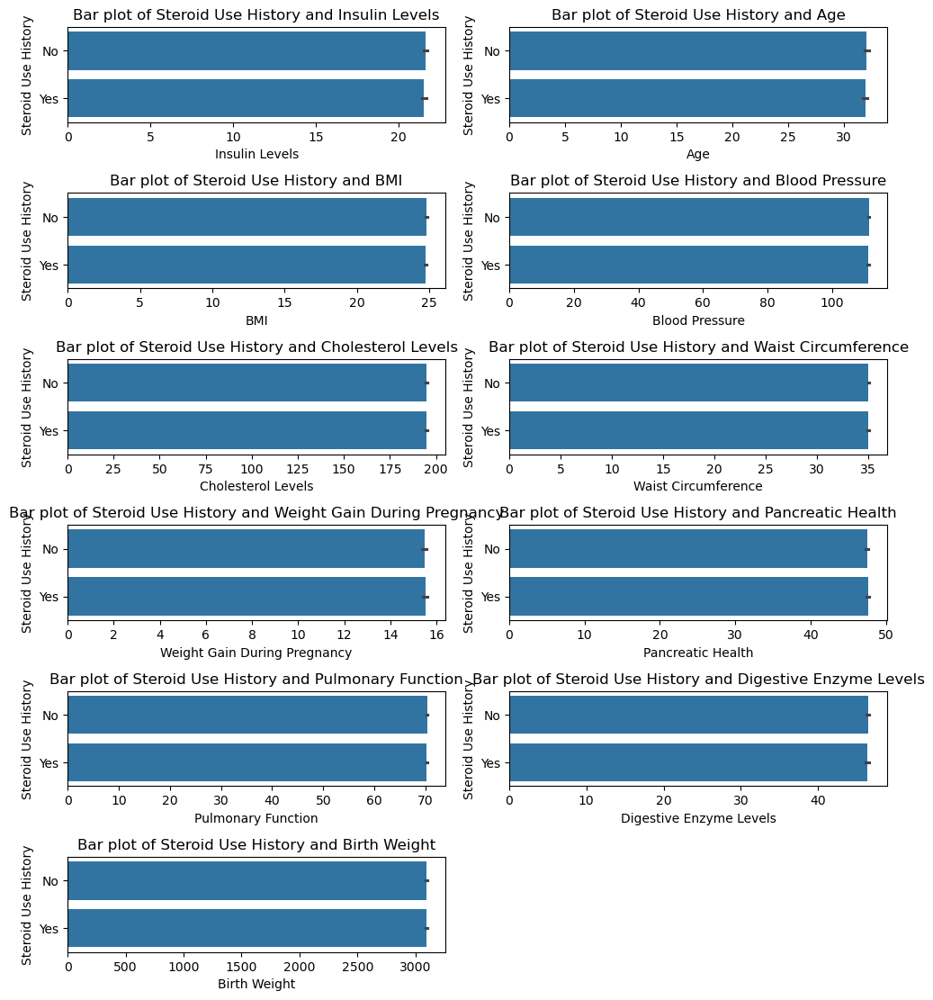

In [217]:
#Barplot of Steroid Use History with all the numeric

plt.figure(figsize=(10,20))
t=1 
for i in num:
        plt.subplot(11,2,t)
        sns.barplot(x=df[i],y=df['Steroid Use History'])
        plt.title(f'Bar plot of Steroid Use History and {i}')
        t+=1
plt.tight_layout()
plt.show()

In [ ]:
# We can observe that all the data is amost equally distributed for Steroid Use History across all the numeric variables

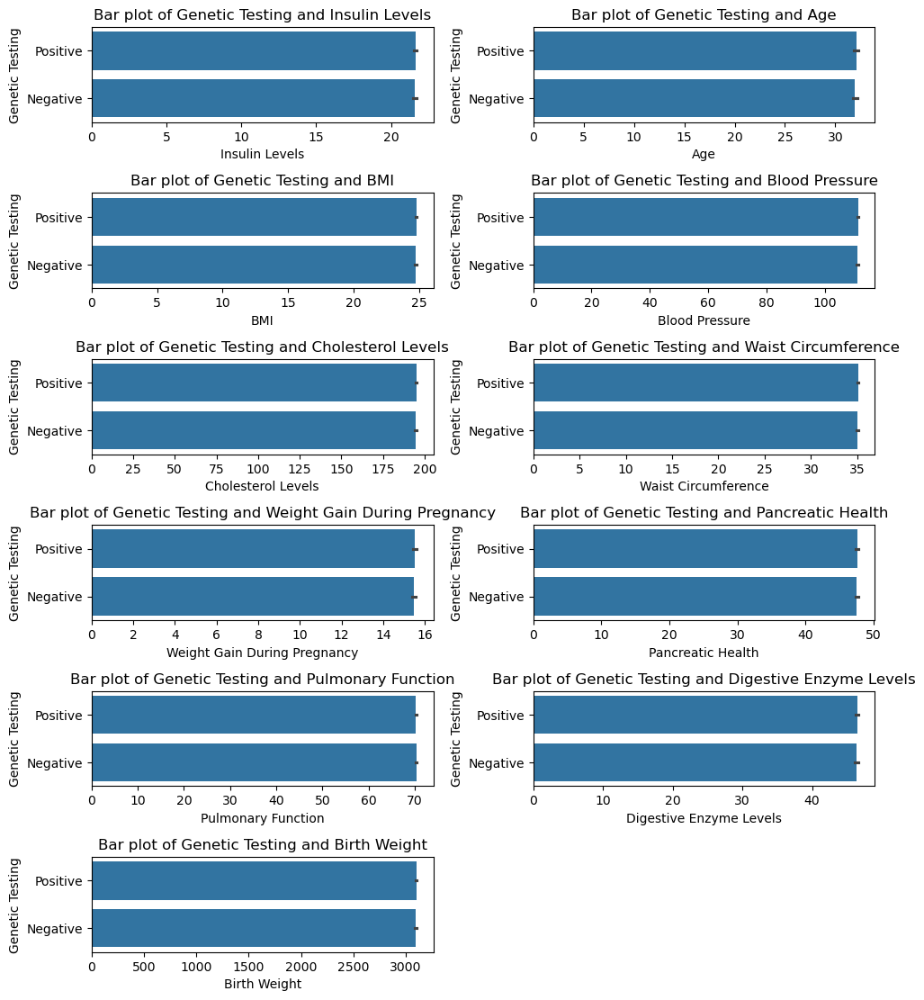

In [218]:
#Barplot of Genetic Testing with all the numeric

plt.figure(figsize=(10,20))
t=1 
for i in num:
        plt.subplot(11,2,t)
        sns.barplot(x=df[i],y=df['Genetic Testing'])
        plt.title(f'Bar plot of Genetic Testing and {i}')
        t+=1
plt.tight_layout()
plt.show()

In [ ]:
# We can observe that all the data is amost equally distributed for Genetic Testing across all the numeric variables

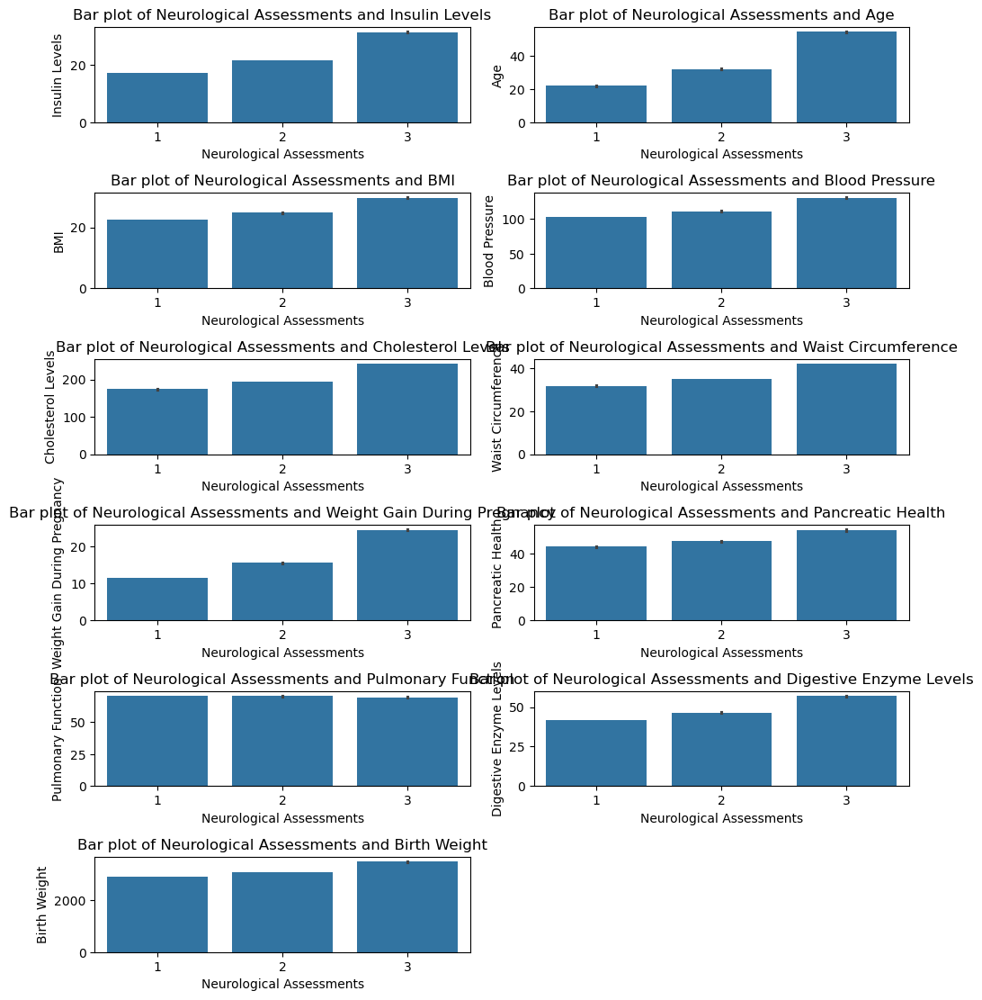

In [222]:
#Barplot of Neurological Assessments with all the numeric

plt.figure(figsize=(10,20))
t=1 
for i in num:
        plt.subplot(11,2,t)
        sns.barplot(y=df[i],x=df['Neurological Assessments'])
        plt.title(f'Bar plot of Neurological Assessments and {i}')
        t+=1
plt.tight_layout()
plt.show()

In [ ]:
# We can observe that all the data is not equally distributed equally for Neurological Assessments across all the numeric variables
#For 'Insulin Levels','Age','BMI','Blood Pressure','Cholesterol Levels','Waist Circumference','Weight Gain During Pregnancy','Pancreatic Health',
#'Digestive Enzyme Levels','Birth Weight , type 3 of Neurological Assessments average is higher
#'Pulmonary Function' ,  type 1 of Neurological Assessments average is higher

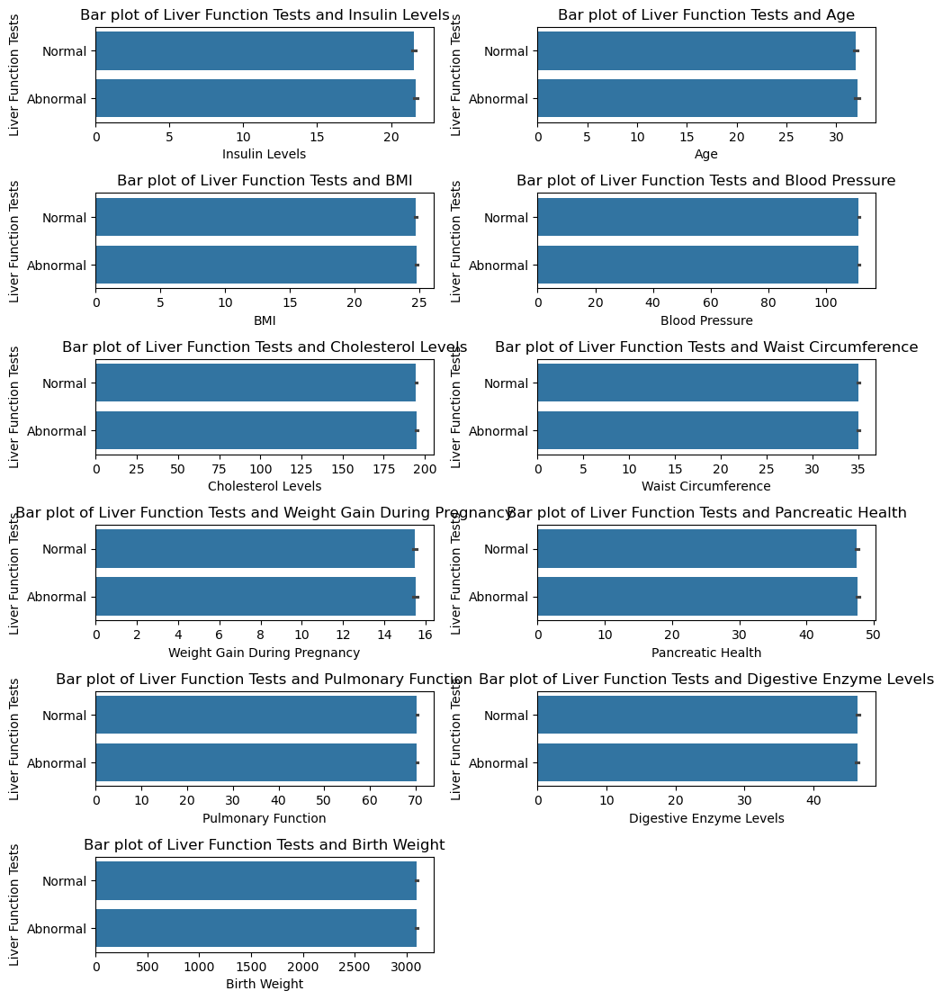

In [225]:
#Barplot of Liver Function Tests with all the numeric

plt.figure(figsize=(10,20))
t=1 
for i in num:
        plt.subplot(11,2,t)
        sns.barplot(x=df[i],y=df['Liver Function Tests'])
        plt.title(f'Bar plot of Liver Function Tests and {i}')
        t+=1
plt.tight_layout()
plt.show()

In [ ]:
# We can observe that all the data is amost equally distributed for Liver Function Tests across all the numeric variables

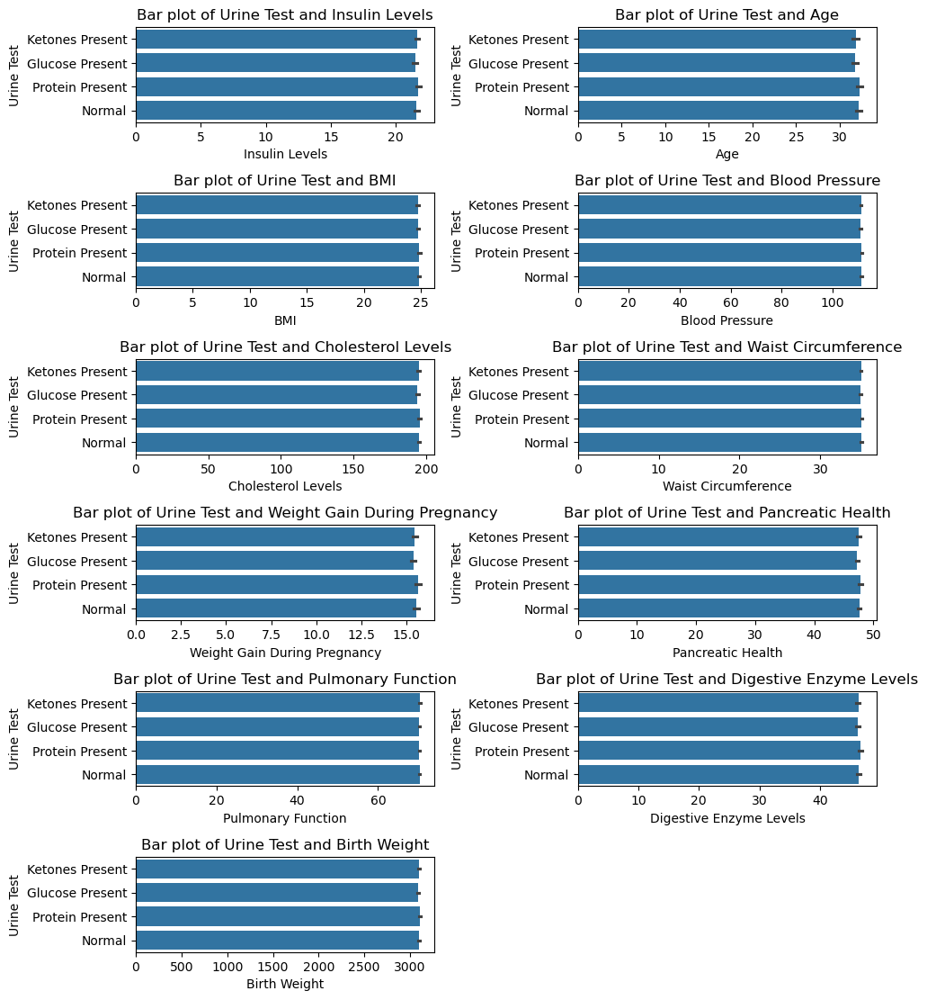

In [226]:
#Barplot of Urine Test with all the numeric

plt.figure(figsize=(10,20))
t=1 
for i in num:
        plt.subplot(11,2,t)
        sns.barplot(x=df[i],y=df['Urine Test'])
        plt.title(f'Bar plot of Urine Test and {i}')
        t+=1
plt.tight_layout()
plt.show()

In [ ]:
# We can observe that all the data is amost equally distributed for Urine Test across all the numeric variables

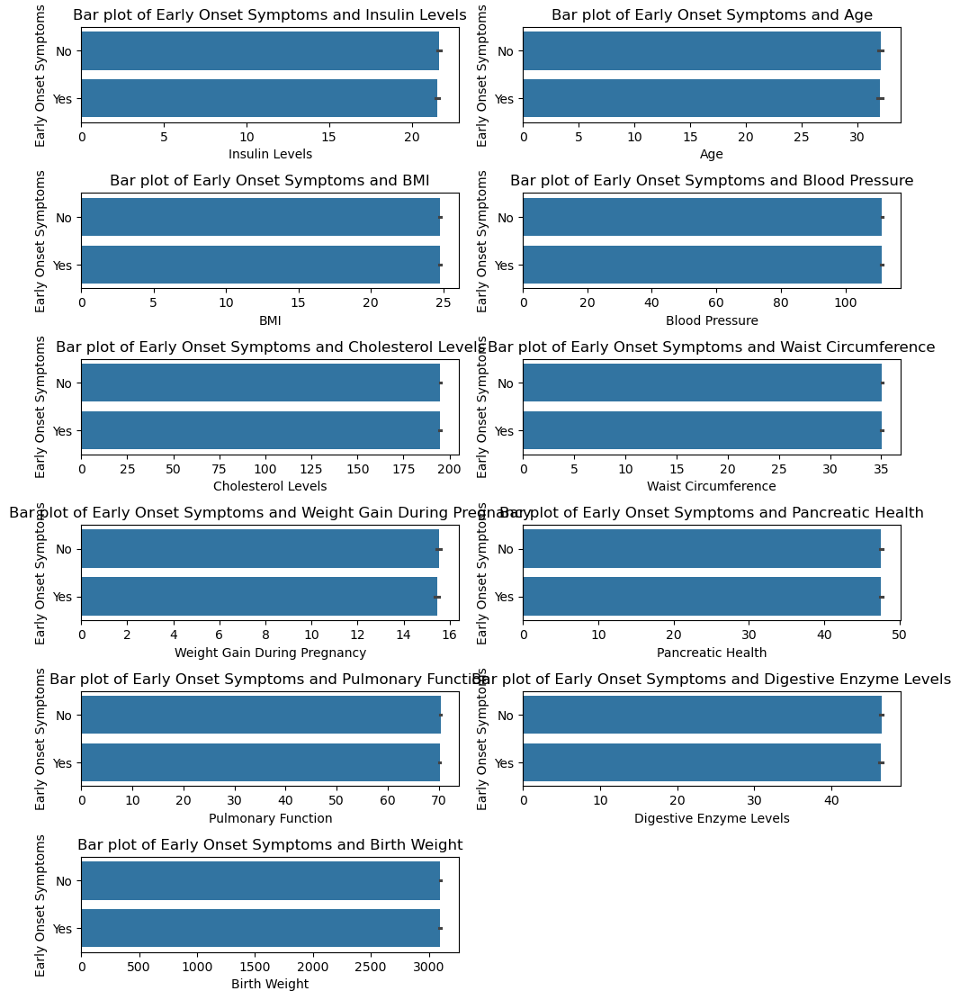

In [227]:
#Barplot of Early Onset Symptoms with all the numeric

plt.figure(figsize=(10,20))
t=1 
for i in num:
        plt.subplot(11,2,t)
        sns.barplot(x=df[i],y=df['Early Onset Symptoms'])
        plt.title(f'Bar plot of Early Onset Symptoms and {i}')
        t+=1
plt.tight_layout()
plt.show()

In [228]:
# We can observe that all the data is amost equally distributed for Early Onset Symptoms across all the numeric variables

## Multivariate Analysis

In [38]:
df[num].corr()

,Insulin Levels,Age,BMI,Blood Pressure,Cholesterol Levels,Waist Circumference,Weight Gain During Pregnancy,Pancreatic Health,Pulmonary Function,Digestive Enzyme Levels,Birth Weight
Insulin Levels,1.000000,0.608128,0.534044,0.581814,0.551892,0.580608,0.510186,0.295518,0.123034,0.398418,0.396347
Age,0.608128,1.000000,0.662997,0.763398,0.730426,0.733633,0.698480,0.444710,0.261972,0.581695,0.523554
BMI,0.534044,0.662997,1.000000,0.654009,0.603086,0.620750,0.588552,0.386623,0.233309,0.523032,0.476306
Blood Pressure,0.581814,0.763398,0.654009,1.000000,0.674503,0.712538,0.666891,0.438638,0.259290,0.577388,0.539148
Cholesterol Levels,0.551892,0.730426,0.603086,0.674503,1.000000,0.672560,0.692473,0.413477,0.277911,0.559936,0.523226
Waist Circumference,0.580608,0.733633,0.620750,0.712538,0.672560,1.000000,0.622174,0.371773,0.180723,0.487710,0.476957
Weight Gain During Pregnancy,0.510186,0.698480,0.588552,0.666891,0.692473,0.622174,1.000000,0.464724,0.350113,0.639297,0.570781
Pancreatic Health,0.295518,0.444710,0.386623,0.438638,0.413477,0.371773,0.464724,1.000000,0.421684,0.501860,0.451777
Pulmonary Function,0.123034,0.261972,0.233309,0.259290,0.277911,0.180723,0.350113,0.421684,1.000000,0.456181,0.441958
Digestive Enzyme Levels,0.398418,0.581695,0.523032,0.577388,0.559936,0.487710,0.639297,0.501860,0.456181,1.000000,0.555680


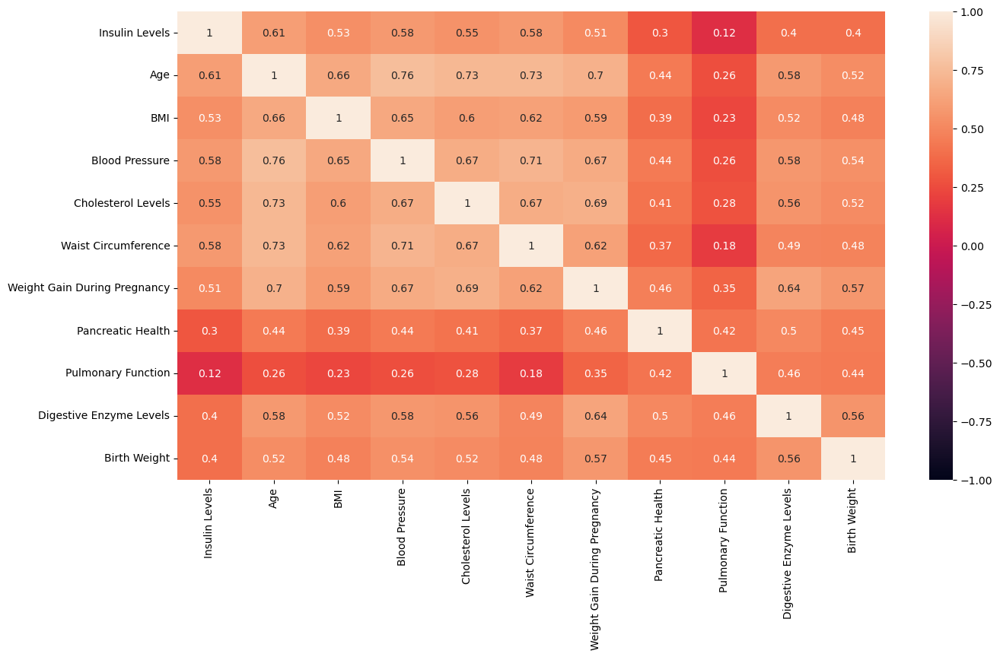

In [39]:
sns.heatmap(df[num].corr(), annot=True,vmax=1,vmin= -1)
plt.show()

In [41]:
# There are positive correlation between all the variables with each other
# The strongest corelation is between Age and BP
# There are no negaive corelation between numeric varaibles

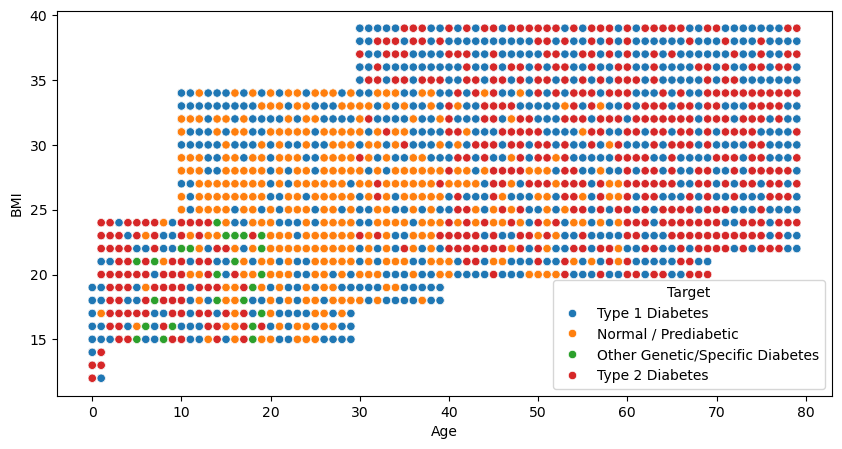

In [86]:
# To understand how Age and BMI are distributed wrt to Target
plt.figure(figsize=(10,5))
sns.scatterplot(x=df['Age'],y=df['BMI'],hue=df['Target'])
plt.show()

In [95]:
# We can say that the Majority of people having Type 2 diabetes between age group 0-15 years , which is actually not so common and 40-80 years,
#Which is actually common.



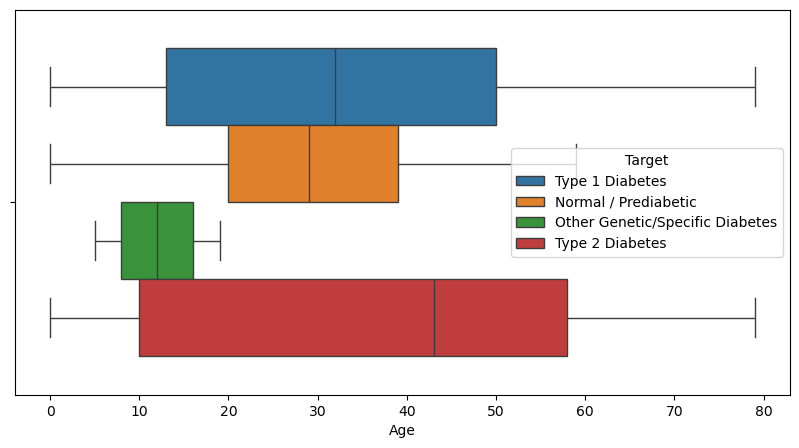

In [104]:
#Box plot of Age
plt.figure(figsize=(10,5))
sns.boxplot(x=df['Age'],hue=df['Target'])
plt.show()
# Type 2 diabetes is most common for age over 40 years

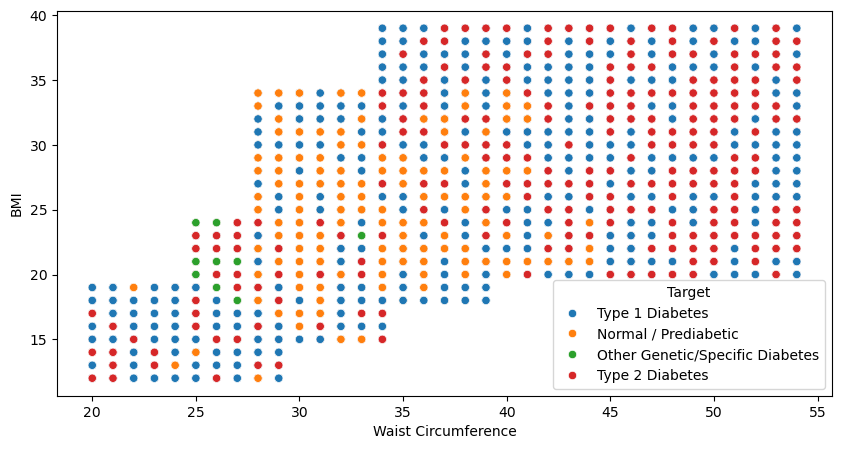

In [109]:
# To understand how Waist Circumference and BMI are distributed wrt to Target
plt.figure(figsize=(10,5))
sns.scatterplot(x=df['Waist Circumference'],y=df['BMI'],hue=df['Target'])
plt.show()

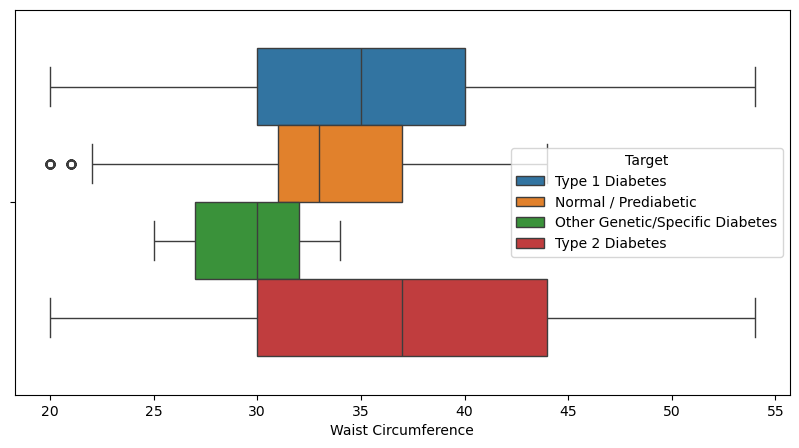

In [108]:
#Box plot of Waist Circumference
plt.figure(figsize=(10,5))
sns.boxplot(x=df['Waist Circumference'],hue=df['Target'])
plt.show()
# Median Waist Circumference of the type 2 diabetes patient is on higher side

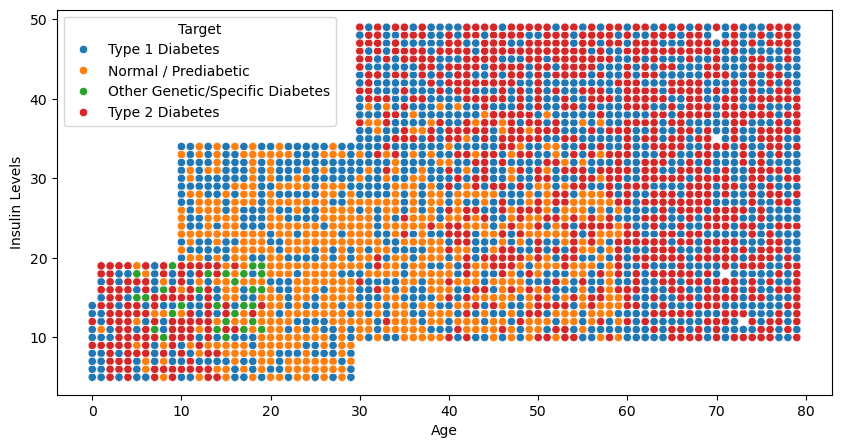

In [112]:
# To understand how Insulin Levels and Age are distributed wrt to Target
plt.figure(figsize=(10,5))
sns.scatterplot(y=df['Insulin Levels'],x=df['Age'],hue=df['Target'])
plt.show()

# we can observe the segmentation of type 2 diabetes across the age groups wrt to insulin levels

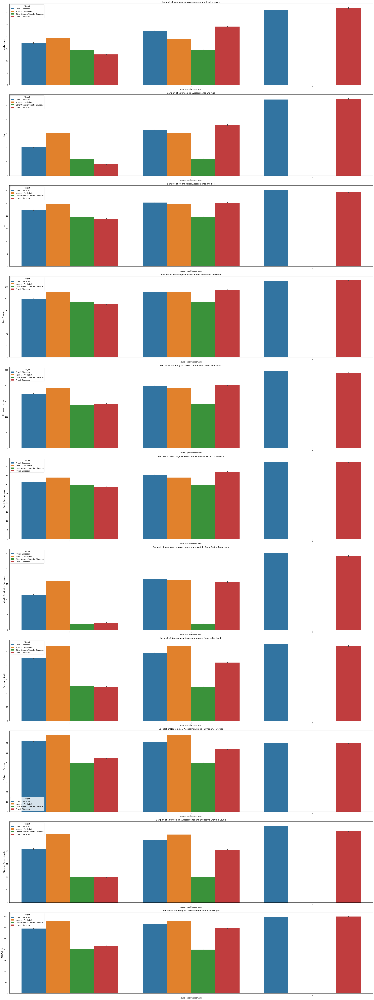

In [237]:
#Barplot of Neurological Assessments with all the numeric and Target variable.

plt.figure(figsize=(30,80))
t=1 
for i in num:
        plt.subplot(11,1,t)
        sns.barplot(y=df[i],x=df['Neurological Assessments'],hue=df['Target'])
        plt.title(f'Bar plot of Neurological Assessments and {i}')
        t+=1
plt.tight_layout()
plt.show()

In [ ]:
# We can observe that there are missing values in type 3 of Neurological Assessments, there is no data for  Normal / Prediabetic and Other Genetic/Specific Diabetes for all the numeric variables
#There is variablity across each of the Neurological Assessments and target with numeric varaibles.

## Summarization of EDA with domain

Facts as per domain:
-Type 1 Diabetes: Typically autoimmune and often diagnosed in childhood.

-Normal / Prediabetic: Individuals at risk but not yet diagnosed with diabetes.

-Other Genetic/Specific Diabetes: Rare forms linked to genetic mutations or specific medical conditions.

-Type 2 Diabetes: Often related to lifestyle factors and typically diagnosed in adulthood.

Below intepretation with data and domain
1. Glucose Tolerance Test (numeric results): Determines whether individuals fall into Normal / Prediabetic or diabetic categories. 
It helps stratify risk levels for progression into Type 2 diabetes.

2.	Age and BMI: Age groups and weight categories correlate differently with each diabetes type. For example:

	-Younger individuals might show trends toward Type 1 Diabetes.

	-Higher BMI is often associated with Type 2 Diabetes.

4. Blood Sugar Variability: Analysis of fluctuations might indicate early onset (Type 1) versus lifestyle factors (Type 2).

5. Physical Activity,Enviromental factors and Smoking: These are lifestyle factors which are significant for predictors of type 2 diabetes.

6. Pregnancy-Related Factors (History of PCOS, Previous Gestational Diabetes, Pregnancy History): Useful for identifying women at risk for gestational diabetes or later developing Type 2 Diabetes.

7. Neurological Assessments, Liver Function Tests, and Urine Test Results:Aid in evaluating complications or secondary effects of diabetes.

8. Early Onset Symptoms: Critical for differentiating between Type 1 Diabetes (often early-onset) and Type 2 Diabetes (commonly late-onset).

9. Waist Circumference and BMI can helping in predicting the type 2 diabetes.

10. Insulin level and Age can help help us in segmentation of type of diabetes.









# Step-2 : Preprocessing- Encoding

### Encoding

Lets see the distribution of categorical variables 

In [33]:
#checking on the categoric variables, with number of classes, inorder to do the encoding based on data- label, ordinal or nominal
for i in cat:
    print(f'{i} has {df[i].nunique()} sub categories\n')
    print(df[i].value_counts())
    print('-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=')



Target has 4 sub categories

Target
Type 1 Diabetes                    27030
Normal / Prediabetic               20732
Type 2 Diabetes                    19685
Other Genetic/Specific Diabetes     2553
Name: count, dtype: int64
-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=
Genetic Markers has 2 sub categories

Genetic Markers
Positive    35101
Negative    34899
Name: count, dtype: int64
-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=
Autoantibodies has 2 sub categories

Autoantibodies
Negative    35058
Positive    34942
Name: count, dtype: int64
-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=
Family History has 2 sub categories

Family History
Yes    35168
No     34832
Name: count, dtype: int64
-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=
Environmental Factors has 2 sub categories

Environmental Factors
Absent     35088
Present    34912
Name: count, dtype: int64
-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=
Physical Activity has 3 sub categories

Physical Activity
Moderate    23427
Low         2

Consolidating the no of unique values for each categorical column

In [34]:
n_unique = {x:df[x].nunique() for x in cat} # dict comprehension
n_unique
# Total no of classes of each categoric variable

{'Target': 4,
 'Genetic Markers': 2,
 'Autoantibodies': 2,
 'Family History': 2,
 'Environmental Factors': 2,
 'Physical Activity': 3,
 'Dietary Habits': 2,
 'Ethnicity': 2,
 'Socioeconomic Factors': 3,
 'Smoking Status': 2,
 'Alcohol Consumption': 3,
 'Glucose Tolerance Test': 2,
 'History of PCOS': 2,
 'Previous Gestational Diabetes': 2,
 'Pregnancy History': 2,
 'Cystic Fibrosis Diagnosis': 2,
 'Steroid Use History': 2,
 'Genetic Testing': 2,
 'Neurological Assessments': 3,
 'Liver Function Tests': 2,
 'Urine Test': 4,
 'Early Onset Symptoms': 2}

<Axes: >

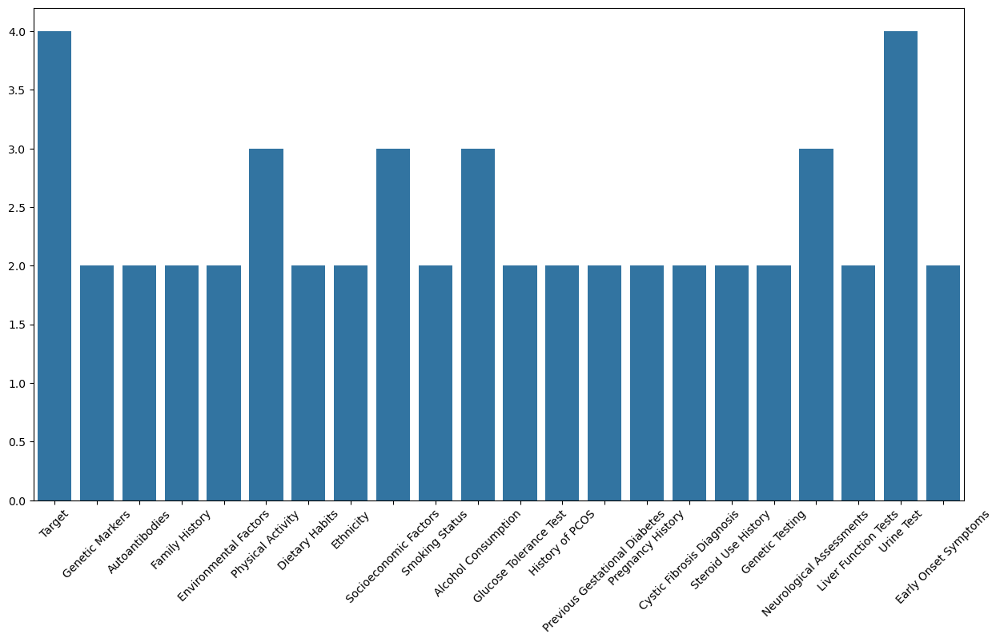

In [35]:
#palette = sns.color_palette("summer", len(cat))
plt.xticks(rotation=45)
sns.barplot(y=n_unique.values(),x=n_unique.keys())

In [36]:
# We can visually see the no of classes in each categoric variable

In [37]:
set(n_unique.values())
# Total no of unique class group available

{2, 3, 4}

Cateogrical columns have only 2 , 3 or 4 sub categories 

In [38]:
# Doing one-dummy encoding for all the nominal categoric features
encoded_cat = pd.get_dummies

In [39]:
encoded_cat

<function pandas.core.reshape.encoding.get_dummies(data, prefix=None, prefix_sep: 'str | Iterable[str] | dict[str, str]' = '_', dummy_na: 'bool' = False, columns=None, sparse: 'bool' = False, drop_first: 'bool' = False, dtype: 'NpDtype | None' = None) -> 'DataFrame'>

In [40]:
nominal_columns = df[cat].drop(['Alcohol Consumption' ,'Socioeconomic Factors','Physical Activity','Target'],axis=1)

In [41]:
# dropping ['Alcohol Consumption' ,'Socioeconomic Factors','Physical Activity','Target'] not nominal features and prepartion for one-dummy encoding

In [42]:
nominal_columns
# displaying the nominal features before encoding

,Genetic Markers,Autoantibodies,Family History,Environmental Factors,Dietary Habits,Ethnicity,Smoking Status,Glucose Tolerance Test,History of PCOS,Previous Gestational Diabetes,Pregnancy History,Cystic Fibrosis Diagnosis,Steroid Use History,Genetic Testing,Neurological Assessments,Liver Function Tests,Urine Test,Early Onset Symptoms
SI.No,,,,,,,,,,,,,,,,,,
1,Positive,Negative,No,Present,Healthy,Low Risk,Smoker,Normal,No,No,Normal,No,No,Positive,3,Normal,Ketones Present,No
2,Positive,Negative,No,Present,Healthy,Low Risk,Non-Smoker,Normal,Yes,No,Normal,Yes,No,Negative,1,Normal,Glucose Present,Yes
3,Positive,Positive,Yes,Present,Unhealthy,Low Risk,Smoker,Abnormal,Yes,No,Normal,Yes,No,Negative,1,Abnormal,Ketones Present,Yes
4,Negative,Positive,No,Present,Unhealthy,Low Risk,Smoker,Abnormal,No,Yes,Normal,Yes,No,Positive,2,Abnormal,Ketones Present,No
5,Negative,Negative,Yes,Present,Healthy,Low Risk,Smoker,Normal,No,Yes,Complications,No,No,Positive,1,Normal,Protein Present,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69996,Negative,Negative,Yes,Present,Unhealthy,Low Risk,Non-Smoker,Abnormal,Yes,No,Normal,Yes,Yes,Positive,2,Abnormal,Normal,No
69997,Positive,Positive,No,Absent,Unhealthy,Low Risk,Smoker,Abnormal,Yes,No,Normal,Yes,Yes,Negative,1,Abnormal,Ketones Present,No
69998,Positive,Negative,No,Absent,Unhealthy,Low Risk,Smoker,Abnormal,Yes,No,Normal,Yes,Yes,Positive,2,Normal,Protein Present,No


In [43]:
# Nominal encoding using one-dummy
nominal_columns = pd.get_dummies(nominal_columns,dtype=int)
nominal_columns.reset_index(inplace=True)

In [44]:
nominal_columns
# displaying the nominal features before encoding

,SI.No,Genetic Markers_Negative,Genetic Markers_Positive,Autoantibodies_Negative,Autoantibodies_Positive,Family History_No,Family History_Yes,Environmental Factors_Absent,Environmental Factors_Present,Dietary Habits_Healthy,Dietary Habits_Unhealthy,Ethnicity_High Risk,Ethnicity_Low Risk,Smoking Status_Non-Smoker,Smoking Status_Smoker,Glucose Tolerance Test_Abnormal,Glucose Tolerance Test_Normal,History of PCOS_No,History of PCOS_Yes,Previous Gestational Diabetes_No,Previous Gestational Diabetes_Yes,Pregnancy History_Complications,Pregnancy History_Normal,Cystic Fibrosis Diagnosis_No,Cystic Fibrosis Diagnosis_Yes,Steroid Use History_No,Steroid Use History_Yes,Genetic Testing_Negative,Genetic Testing_Positive,Neurological Assessments_1,Neurological Assessments_2,Neurological Assessments_3,Liver Function Tests_Abnormal,Liver Function Tests_Normal,Urine Test_Glucose Present,Urine Test_Ketones Present,Urine Test_Normal,Urine Test_Protein Present,Early Onset Symptoms_No,Early Onset Symptoms_Yes
0,1,0,1,1,0,1,0,0,1,1,0,0,1,0,1,0,1,1,0,1,0,0,1,1,0,1,0,0,1,0,0,1,0,1,0,1,0,0,1,0
1,2,0,1,1,0,1,0,0,1,1,0,0,1,1,0,0,1,0,1,1,0,0,1,0,1,1,0,1,0,1,0,0,0,1,1,0,0,0,0,1
2,3,0,1,0,1,0,1,0,1,0,1,0,1,0,1,1,0,0,1,1,0,0,1,0,1,1,0,1,0,1,0,0,1,0,0,1,0,0,0,1
3,4,1,0,0,1,1,0,0,1,0,1,0,1,0,1,1,0,1,0,0,1,0,1,0,1,1,0,0,1,0,1,0,1,0,0,1,0,0,1,0
4,5,1,0,1,0,0,1,0,1,1,0,0,1,0,1,0,1,1,0,0,1,1,0,1,0,1,0,0,1,1,0,0,0,1,0,0,0,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69995,69996,1,0,1,0,0,1,0,1,0,1,0,1,1,0,1,0,0,1,1,0,0,1,0,1,0,1,0,1,0,1,0,1,0,0,0,1,0,1,0
69996,69997,0,1,0,1,1,0,1,0,0,1,0,1,0,1,1,0,0,1,1,0,0,1,0,1,0,1,1,0,1,0,0,1,0,0,1,0,0,1,0
69997,69998,0,1,1,0,1,0,1,0,0,1,0,1,0,1,1,0,0,1,1,0,0,1,0,1,0,1,0,1,0,1,0,0,1,0,0,0,1,1,0
69998,69999,0,1,1,0,1,0,1,0,1,0,1,0,1,0,0,1,1,0,1,0,0,1,1,0,1,0,0,1,1,0,0,1,0,0,1,0,0,0,1


In [45]:
# Ordinal features, checking on the values in them
k = ['Alcohol Consumption' ,'Socioeconomic Factors','Physical Activity']
for i in k:
    print(df[i].value_counts(),'\n')

Alcohol Consumption
Low         23411
Moderate    23343
High        23246
Name: count, dtype: int64 

Socioeconomic Factors
Medium    23413
High      23304
Low       23283
Name: count, dtype: int64 

Physical Activity
Moderate    23427
Low         23348
High        23225
Name: count, dtype: int64 



In [46]:
# Giving the order for the data
#Low=0
#Moderate=1
#High=2
from sklearn.preprocessing import OrdinalEncoder
O = OrdinalEncoder(categories=[['Low','Moderate','High'],['Low','Medium','High'],['Low','Moderate','High']])

In [47]:
ordinal_columns = df[['Alcohol Consumption' ,'Socioeconomic Factors','Physical Activity']]
ordinal_columns = pd.DataFrame(O.fit_transform(ordinal_columns),columns=ordinal_columns.columns)
ordinal_columns

,Alcohol Consumption,Socioeconomic Factors,Physical Activity
0,2.0,1.0,2.0
1,1.0,2.0,2.0
2,2.0,1.0,2.0
3,1.0,2.0,0.0
4,1.0,0.0,2.0
...,...,...,...
69995,0.0,2.0,2.0
69996,0.0,1.0,0.0
69997,2.0,2.0,0.0
69998,1.0,0.0,2.0


In [48]:
#Label encoding for target variable
from sklearn.preprocessing import LabelEncoder

In [49]:
labelencoder=LabelEncoder()
Target_col=labelencoder.fit_transform(df['Target'])

In [50]:
df_target_col=pd.DataFrame(Target_col,columns=['Target'])
df_target_col

,Target
0,2
1,2
2,0
3,0
4,1
...,...
69995,3
69996,2
69997,2
69998,2


In [51]:
#the following are the labels for Target
#Type 1 Diabetes= 2
#Normal / Prediabetic=0
#Type 2 Diabetes= 3
#Other Genetic/Specific Diabetes=1

In [52]:
#Combing the all the categorical encoded featrures into a single dataframe
cat_encoded = pd.concat([nominal_columns,ordinal_columns,df_target_col],axis=1)
cat_encoded

,SI.No,Genetic Markers_Negative,Genetic Markers_Positive,Autoantibodies_Negative,Autoantibodies_Positive,Family History_No,Family History_Yes,Environmental Factors_Absent,Environmental Factors_Present,Dietary Habits_Healthy,Dietary Habits_Unhealthy,Ethnicity_High Risk,Ethnicity_Low Risk,Smoking Status_Non-Smoker,Smoking Status_Smoker,Glucose Tolerance Test_Abnormal,Glucose Tolerance Test_Normal,History of PCOS_No,History of PCOS_Yes,Previous Gestational Diabetes_No,Previous Gestational Diabetes_Yes,Pregnancy History_Complications,Pregnancy History_Normal,Cystic Fibrosis Diagnosis_No,Cystic Fibrosis Diagnosis_Yes,Steroid Use History_No,Steroid Use History_Yes,Genetic Testing_Negative,Genetic Testing_Positive,Neurological Assessments_1,Neurological Assessments_2,Neurological Assessments_3,Liver Function Tests_Abnormal,Liver Function Tests_Normal,Urine Test_Glucose Present,Urine Test_Ketones Present,Urine Test_Normal,Urine Test_Protein Present,Early Onset Symptoms_No,Early Onset Symptoms_Yes,Alcohol Consumption,Socioeconomic Factors,Physical Activity,Target
0,1,0,1,1,0,1,0,0,1,1,0,0,1,0,1,0,1,1,0,1,0,0,1,1,0,1,0,0,1,0,0,1,0,1,0,1,0,0,1,0,2.0,1.0,2.0,2
1,2,0,1,1,0,1,0,0,1,1,0,0,1,1,0,0,1,0,1,1,0,0,1,0,1,1,0,1,0,1,0,0,0,1,1,0,0,0,0,1,1.0,2.0,2.0,2
2,3,0,1,0,1,0,1,0,1,0,1,0,1,0,1,1,0,0,1,1,0,0,1,0,1,1,0,1,0,1,0,0,1,0,0,1,0,0,0,1,2.0,1.0,2.0,0
3,4,1,0,0,1,1,0,0,1,0,1,0,1,0,1,1,0,1,0,0,1,0,1,0,1,1,0,0,1,0,1,0,1,0,0,1,0,0,1,0,1.0,2.0,0.0,0
4,5,1,0,1,0,0,1,0,1,1,0,0,1,0,1,0,1,1,0,0,1,1,0,1,0,1,0,0,1,1,0,0,0,1,0,0,0,1,1,0,1.0,0.0,2.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69995,69996,1,0,1,0,0,1,0,1,0,1,0,1,1,0,1,0,0,1,1,0,0,1,0,1,0,1,0,1,0,1,0,1,0,0,0,1,0,1,0,0.0,2.0,2.0,3
69996,69997,0,1,0,1,1,0,1,0,0,1,0,1,0,1,1,0,0,1,1,0,0,1,0,1,0,1,1,0,1,0,0,1,0,0,1,0,0,1,0,0.0,1.0,0.0,2
69997,69998,0,1,1,0,1,0,1,0,0,1,0,1,0,1,1,0,0,1,1,0,0,1,0,1,0,1,0,1,0,1,0,0,1,0,0,0,1,1,0,2.0,2.0,0.0,2
69998,69999,0,1,1,0,1,0,1,0,1,0,1,0,1,0,0,1,1,0,1,0,0,1,1,0,1,0,0,1,1,0,0,1,0,0,1,0,0,0,1,1.0,0.0,2.0,2


In [53]:
# droping the SI no , which is not required
cat_encoded=cat_encoded.drop(['SI.No'],axis=1)

In [54]:
# Displaying the encoded categoric Dataframe
cat_encoded

,Genetic Markers_Negative,Genetic Markers_Positive,Autoantibodies_Negative,Autoantibodies_Positive,Family History_No,Family History_Yes,Environmental Factors_Absent,Environmental Factors_Present,Dietary Habits_Healthy,Dietary Habits_Unhealthy,Ethnicity_High Risk,Ethnicity_Low Risk,Smoking Status_Non-Smoker,Smoking Status_Smoker,Glucose Tolerance Test_Abnormal,Glucose Tolerance Test_Normal,History of PCOS_No,History of PCOS_Yes,Previous Gestational Diabetes_No,Previous Gestational Diabetes_Yes,Pregnancy History_Complications,Pregnancy History_Normal,Cystic Fibrosis Diagnosis_No,Cystic Fibrosis Diagnosis_Yes,Steroid Use History_No,Steroid Use History_Yes,Genetic Testing_Negative,Genetic Testing_Positive,Neurological Assessments_1,Neurological Assessments_2,Neurological Assessments_3,Liver Function Tests_Abnormal,Liver Function Tests_Normal,Urine Test_Glucose Present,Urine Test_Ketones Present,Urine Test_Normal,Urine Test_Protein Present,Early Onset Symptoms_No,Early Onset Symptoms_Yes,Alcohol Consumption,Socioeconomic Factors,Physical Activity,Target
0,0,1,1,0,1,0,0,1,1,0,0,1,0,1,0,1,1,0,1,0,0,1,1,0,1,0,0,1,0,0,1,0,1,0,1,0,0,1,0,2.0,1.0,2.0,2
1,0,1,1,0,1,0,0,1,1,0,0,1,1,0,0,1,0,1,1,0,0,1,0,1,1,0,1,0,1,0,0,0,1,1,0,0,0,0,1,1.0,2.0,2.0,2
2,0,1,0,1,0,1,0,1,0,1,0,1,0,1,1,0,0,1,1,0,0,1,0,1,1,0,1,0,1,0,0,1,0,0,1,0,0,0,1,2.0,1.0,2.0,0
3,1,0,0,1,1,0,0,1,0,1,0,1,0,1,1,0,1,0,0,1,0,1,0,1,1,0,0,1,0,1,0,1,0,0,1,0,0,1,0,1.0,2.0,0.0,0
4,1,0,1,0,0,1,0,1,1,0,0,1,0,1,0,1,1,0,0,1,1,0,1,0,1,0,0,1,1,0,0,0,1,0,0,0,1,1,0,1.0,0.0,2.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69995,1,0,1,0,0,1,0,1,0,1,0,1,1,0,1,0,0,1,1,0,0,1,0,1,0,1,0,1,0,1,0,1,0,0,0,1,0,1,0,0.0,2.0,2.0,3
69996,0,1,0,1,1,0,1,0,0,1,0,1,0,1,1,0,0,1,1,0,0,1,0,1,0,1,1,0,1,0,0,1,0,0,1,0,0,1,0,0.0,1.0,0.0,2
69997,0,1,1,0,1,0,1,0,0,1,0,1,0,1,1,0,0,1,1,0,0,1,0,1,0,1,0,1,0,1,0,0,1,0,0,0,1,1,0,2.0,2.0,0.0,2
69998,0,1,1,0,1,0,1,0,1,0,1,0,1,0,0,1,1,0,1,0,0,1,1,0,1,0,0,1,1,0,0,1,0,0,1,0,0,0,1,1.0,0.0,2.0,2


In [55]:
# Checking on the numbr of rows and columns
cat_encoded.shape

(70000, 43)

In [56]:
#Number of rows= 70000
#Number of columns= 41

# Step-3 : Transformation of Numeric Variables

### Transformation

In [57]:
# Displaying the list of numeric features in the dataset for transformation and scaling
num

['Insulin Levels',
 'Age',
 'BMI',
 'Blood Pressure',
 'Cholesterol Levels',
 'Waist Circumference',
 'Weight Gain During Pregnancy',
 'Pancreatic Health',
 'Pulmonary Function',
 'Digestive Enzyme Levels',
 'Birth Weight']

In [58]:
# As per the EDA that we have done, we have observed that 2 features are skewed and require transformation.
# Those 2 features are Insulin Levels and Pulmonary Function
#Insulin Levels is right skewed and we need to use log transformation inorder to make it a normal distributed curve

In [59]:
#Creating a new Dataframe to store the transformed result
trans_data=pd.DataFrame()

In [60]:
#Using logorithmic transformation to make it normally distributed curve from right skewed.
trans_data['trans_insulin_levels']=np.log(df['Insulin Levels'])


In [61]:
# Displaying after transformation
trans_data['trans_insulin_levels']

SI.No
1        3.688879
2        2.564949
3        3.295837
4        2.079442
5        2.833213
           ...   
69996    3.178054
69997    3.044522
69998    2.890372
69999    3.465736
70000    3.295837
Name: trans_insulin_levels, Length: 70000, dtype: float64

In [62]:
# Displaying after the skewness of transformed_insulin_levels
trans_data['trans_insulin_levels'].skew()

-0.30240063706480835

In [63]:
# we can observe that the skewness is reduced 

<Axes: ylabel='Density'>

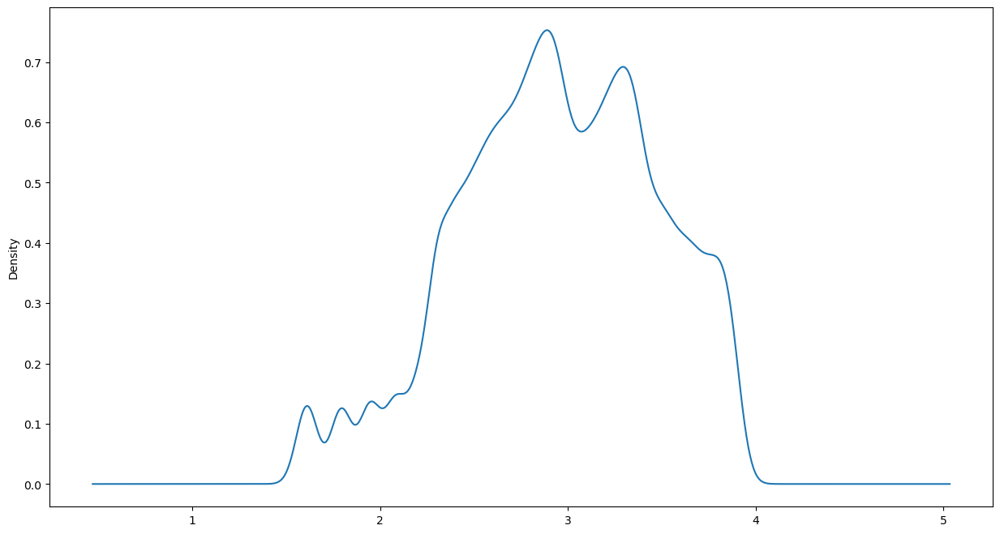

In [64]:
# Visualizing the transformed_insulin_levels
trans_data['trans_insulin_levels'].plot(kind='kde')

In [65]:
# And the other feature Pulmonary Function which is left skewed, we will be using box-cox transformation.

In [66]:
# We will be using PowerTransformer with box-cox
from sklearn.preprocessing import PowerTransformer

In [67]:
power_transformer = PowerTransformer(method='box-cox',standardize=False)
trans_data['trans_pulmonary_function']= power_transformer.fit_transform(pd.DataFrame(df['Pulmonary Function']))

In [68]:
# # Displaying after transformation
trans_data['trans_pulmonary_function']

SI.No
1        24494.299414
2        13405.964283
3        27916.737178
4        36636.893418
5         5077.326335
             ...     
69996    20592.345918
69997    29730.895287
69998    25324.472274
69999    19860.875955
70000    31614.939483
Name: trans_pulmonary_function, Length: 70000, dtype: float64

In [69]:
#Displaying after the skewness of transformed_pulmonary_function
trans_data['trans_pulmonary_function'].skew()

-0.1123244575634656

In [70]:
# we can observe that the skewness is reduced 

<Axes: ylabel='Frequency'>

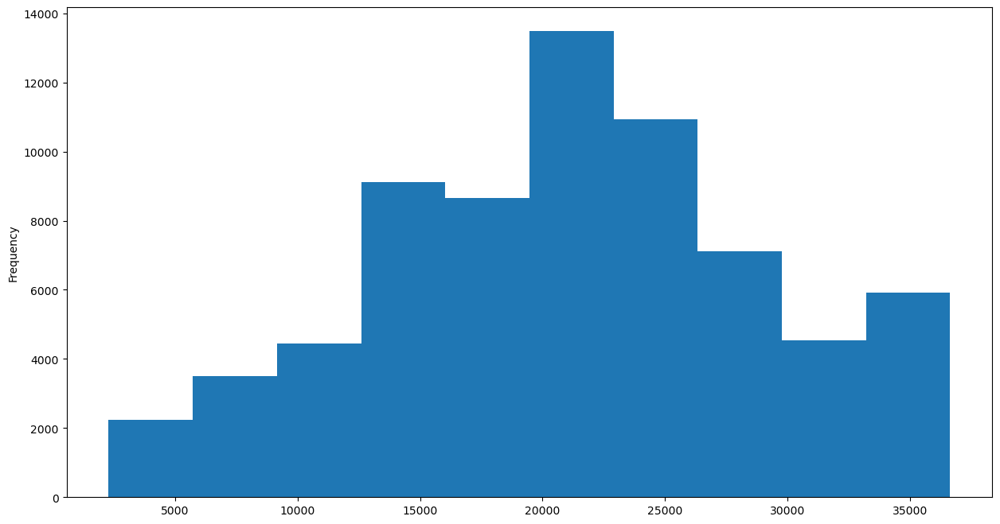

In [71]:
# Visualizing the transformed_pulmonary_function
trans_data['trans_pulmonary_function'].plot(kind='hist')

In [72]:
#Droping the original 'Insulin Levels','Pulmonary Function' from the dataset and storing it in new datframe df_s1
df_s1=df[num].drop(['Insulin Levels','Pulmonary Function'],axis=1)

In [73]:
#Combing the the transformed data with the dataframe df_s1
df_final=pd.concat([df_s1,trans_data],axis=1)

In [74]:
# Displaying the final dataframe
df_final=df_final.reset_index()
df_final

,SI.No,Age,BMI,Blood Pressure,Cholesterol Levels,Waist Circumference,Weight Gain During Pregnancy,Pancreatic Health,Digestive Enzyme Levels,Birth Weight,trans_insulin_levels,trans_pulmonary_function
0,1,44,38,124,201,50,18,36,56,2629,3.688879,24494.299414
1,2,1,17,73,121,24,8,26,28,1881,2.564949,13405.964283
2,3,36,24,121,185,36,15,56,55,3622,3.295837,27916.737178
3,4,7,16,100,151,29,12,49,60,3542,2.079442,36636.893418
4,5,10,17,103,146,33,2,10,24,1770,2.833213,5077.326335
...,...,...,...,...,...,...,...,...,...,...,...,...
69995,69996,38,35,128,299,40,24,31,34,2575,3.178054,20592.345918
69996,69997,51,31,125,160,44,15,69,58,3002,3.044522,29730.895287
69997,69998,11,15,105,153,31,23,39,53,3593,2.890372,25324.472274
69998,69999,30,24,111,177,33,21,53,35,2592,3.465736,19860.875955


In [75]:
df_final.drop('SI.No',axis=1,inplace=True)

In [76]:
# Combing the final and encoded dataframe together for further model building
df_final=pd.concat([df_final,cat_encoded],axis=1)

In [77]:
#Displaying the final Dataframe
df_final

,Age,BMI,Blood Pressure,Cholesterol Levels,Waist Circumference,Weight Gain During Pregnancy,Pancreatic Health,Digestive Enzyme Levels,Birth Weight,trans_insulin_levels,trans_pulmonary_function,Genetic Markers_Negative,Genetic Markers_Positive,Autoantibodies_Negative,Autoantibodies_Positive,Family History_No,Family History_Yes,Environmental Factors_Absent,Environmental Factors_Present,Dietary Habits_Healthy,Dietary Habits_Unhealthy,Ethnicity_High Risk,Ethnicity_Low Risk,Smoking Status_Non-Smoker,Smoking Status_Smoker,Glucose Tolerance Test_Abnormal,Glucose Tolerance Test_Normal,History of PCOS_No,History of PCOS_Yes,Previous Gestational Diabetes_No,Previous Gestational Diabetes_Yes,Pregnancy History_Complications,Pregnancy History_Normal,Cystic Fibrosis Diagnosis_No,Cystic Fibrosis Diagnosis_Yes,Steroid Use History_No,Steroid Use History_Yes,Genetic Testing_Negative,Genetic Testing_Positive,Neurological Assessments_1,Neurological Assessments_2,Neurological Assessments_3,Liver Function Tests_Abnormal,Liver Function Tests_Normal,Urine Test_Glucose Present,Urine Test_Ketones Present,Urine Test_Normal,Urine Test_Protein Present,Early Onset Symptoms_No,Early Onset Symptoms_Yes,Alcohol Consumption,Socioeconomic Factors,Physical Activity,Target
0,44,38,124,201,50,18,36,56,2629,3.688879,24494.299414,0,1,1,0,1,0,0,1,1,0,0,1,0,1,0,1,1,0,1,0,0,1,1,0,1,0,0,1,0,0,1,0,1,0,1,0,0,1,0,2.0,1.0,2.0,2
1,1,17,73,121,24,8,26,28,1881,2.564949,13405.964283,0,1,1,0,1,0,0,1,1,0,0,1,1,0,0,1,0,1,1,0,0,1,0,1,1,0,1,0,1,0,0,0,1,1,0,0,0,0,1,1.0,2.0,2.0,2
2,36,24,121,185,36,15,56,55,3622,3.295837,27916.737178,0,1,0,1,0,1,0,1,0,1,0,1,0,1,1,0,0,1,1,0,0,1,0,1,1,0,1,0,1,0,0,1,0,0,1,0,0,0,1,2.0,1.0,2.0,0
3,7,16,100,151,29,12,49,60,3542,2.079442,36636.893418,1,0,0,1,1,0,0,1,0,1,0,1,0,1,1,0,1,0,0,1,0,1,0,1,1,0,0,1,0,1,0,1,0,0,1,0,0,1,0,1.0,2.0,0.0,0
4,10,17,103,146,33,2,10,24,1770,2.833213,5077.326335,1,0,1,0,0,1,0,1,1,0,0,1,0,1,0,1,1,0,0,1,1,0,1,0,1,0,0,1,1,0,0,0,1,0,0,0,1,1,0,1.0,0.0,2.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69995,38,35,128,299,40,24,31,34,2575,3.178054,20592.345918,1,0,1,0,0,1,0,1,0,1,0,1,1,0,1,0,0,1,1,0,0,1,0,1,0,1,0,1,0,1,0,1,0,0,0,1,0,1,0,0.0,2.0,2.0,3
69996,51,31,125,160,44,15,69,58,3002,3.044522,29730.895287,0,1,0,1,1,0,1,0,0,1,0,1,0,1,1,0,0,1,1,0,0,1,0,1,0,1,1,0,1,0,0,1,0,0,1,0,0,1,0,0.0,1.0,0.0,2
69997,11,15,105,153,31,23,39,53,3593,2.890372,25324.472274,0,1,1,0,1,0,1,0,0,1,0,1,0,1,1,0,0,1,1,0,0,1,0,1,0,1,0,1,0,1,0,0,1,0,0,0,1,1,0,2.0,2.0,0.0,2
69998,30,24,111,177,33,21,53,35,2592,3.465736,19860.875955,0,1,1,0,1,0,1,0,1,0,1,0,1,0,0,1,1,0,1,0,0,1,1,0,1,0,0,1,1,0,0,1,0,0,1,0,0,0,1,1.0,0.0,2.0,2


# Step-4: Statistical test to find the Significance between Categoric Variables

## Chi square test of independence

In [73]:
# As we have to find the significance of categoric variable with each other, we can do it with the help of chi square test of independence

In [74]:
#Chi2 test
from scipy.stats import chi2_contingency

In [75]:
#Droping the Target column, since it is not required in this analysis
cat1=df[cat].drop(['Target'],axis=1)

In [76]:
#Displaying the columns in categoric varaibles
cat1.columns

Index(['Genetic Markers', 'Autoantibodies', 'Family History',
       'Environmental Factors', 'Physical Activity', 'Dietary Habits',
       'Ethnicity', 'Socioeconomic Factors', 'Smoking Status',
       'Alcohol Consumption', 'Glucose Tolerance Test', 'History of PCOS',
       'Previous Gestational Diabetes', 'Pregnancy History',
       'Cystic Fibrosis Diagnosis', 'Steroid Use History', 'Genetic Testing',
       'Neurological Assessments', 'Liver Function Tests', 'Urine Test',
       'Early Onset Symptoms'],
      dtype='object')

### Defining the Null and Alternate hypothesis
H0:The categoric variables are Independent (No significance)

H1:The categoric variables are not independent (significance)

(pvalue is less than 0.05 reject H0)

In [77]:
#Chi2 test for Genetic Markers and other categoric variables
for i in cat1.columns:
    if i!='Genetic Markers':
        ct = pd.crosstab(df[i], df['Genetic Markers'])
        tstat, p_value, dof, expected = chi2_contingency(ct)
        print(f'Chi2 test for {i}')
        print()
        print(f'P_Value {p_value}')
        if p_value < 0.05:
            print(f'There is a Significant Association between {i} and Genetic Markers')
            print()
        else:
            print(f'There is no Significant Association between {i} and Genetic Markers')
            print()

Chi2 test for Autoantibodies

P_Value 0.07219988791528266
There is no Significant Association between Autoantibodies and Genetic Markers

Chi2 test for Family History

P_Value 0.07020385740308036
There is no Significant Association between Family History and Genetic Markers

Chi2 test for Environmental Factors

P_Value 0.43289212904670316
There is no Significant Association between Environmental Factors and Genetic Markers

Chi2 test for Physical Activity

P_Value 0.2755561467825266
There is no Significant Association between Physical Activity and Genetic Markers

Chi2 test for Dietary Habits

P_Value 0.26992957324022193
There is no Significant Association between Dietary Habits and Genetic Markers

Chi2 test for Ethnicity

P_Value 0.9641365785859912
There is no Significant Association between Ethnicity and Genetic Markers

Chi2 test for Socioeconomic Factors

P_Value 0.9328434913933887
There is no Significant Association between Socioeconomic Factors and Genetic Markers

Chi2 test for

In [78]:
# We can observe that there is no significant Association between Genetic Markers and other categoric variables

In [80]:
#Chi2 test for Autoantibodies and other categoric variables
for i in cat1.columns:
    if i!='Autoantibodies':
        ct = pd.crosstab(df[i], df['Autoantibodies'])
        tstat, p_value, dof, expected = chi2_contingency(ct)
        print(f'Chi2 test for {i}')
        print()
        print(f'P_Value {p_value}')
        if p_value < 0.05:
            print(f'There is a Significant Association between {i} and Autoantibodies')
            print()
        else:
            print(f'There is no Significant Association between {i} and Autoantibodies')
            print()

Chi2 test for Genetic Markers

P_Value 0.07219988791528266
There is no Significant Association between Genetic Markers and Autoantibodies

Chi2 test for Family History

P_Value 0.7550105824299186
There is no Significant Association between Family History and Autoantibodies

Chi2 test for Environmental Factors

P_Value 0.25322121770271055
There is no Significant Association between Environmental Factors and Autoantibodies

Chi2 test for Physical Activity

P_Value 0.938057449854349
There is no Significant Association between Physical Activity and Autoantibodies

Chi2 test for Dietary Habits

P_Value 0.10098067687680472
There is no Significant Association between Dietary Habits and Autoantibodies

Chi2 test for Ethnicity

P_Value 0.13256195773084933
There is no Significant Association between Ethnicity and Autoantibodies

Chi2 test for Socioeconomic Factors

P_Value 0.6885038851071161
There is no Significant Association between Socioeconomic Factors and Autoantibodies

Chi2 test for Smoki

In [81]:
# We can observe that there is no significant Association between Autoantibodies and other categoric variables except Early Onset Symptoms and Cystic Fibrosis Diagnosis

In [82]:
#Chi2 test for Family History and other categoric variables
for i in cat1.columns:
    if i!='Family History':
        ct = pd.crosstab(df[i], df['Family History'])
        tstat, p_value, dof, expected = chi2_contingency(ct)
        print(f'Chi2 test for {i}')
        print()
        print(f'P_Value {p_value}')
        if p_value < 0.05:
            print(f'There is a Significant Association between {i} and Family History')
            print()
        else:
            print(f'There is no Significant Association between {i} and Family History')
            print()

Chi2 test for Genetic Markers

P_Value 0.07020385740308036
There is no Significant Association between Genetic Markers and Family History

Chi2 test for Autoantibodies

P_Value 0.7550105824299186
There is no Significant Association between Autoantibodies and Family History

Chi2 test for Environmental Factors

P_Value 0.1629266006931057
There is no Significant Association between Environmental Factors and Family History

Chi2 test for Physical Activity

P_Value 0.19073660649005286
There is no Significant Association between Physical Activity and Family History

Chi2 test for Dietary Habits

P_Value 0.6881457291778532
There is no Significant Association between Dietary Habits and Family History

Chi2 test for Ethnicity

P_Value 0.27331664317445975
There is no Significant Association between Ethnicity and Family History

Chi2 test for Socioeconomic Factors

P_Value 0.7667102616034894
There is no Significant Association between Socioeconomic Factors and Family History

Chi2 test for Smoki

In [294]:
# We can observe that there is no significant Association between Family History and other categoric variables.

In [83]:
#Chi2 test for Environmental Factors and other categoric variables
for i in cat1.columns:
    if i!='Environmental Factors':
        ct = pd.crosstab(df[i], df['Environmental Factors'])
        tstat, p_value, dof, expected = chi2_contingency(ct)
        print(f'Chi2 test for {i}')
        print()
        print(f'P_Value {p_value}')
        if p_value < 0.05:
            print(f'There is a Significant Association between {i} and Environmental Factors')
            print()
        else:
            print(f'There is no Significant Association between {i} and Environmental Factors')
            print()

Chi2 test for Genetic Markers

P_Value 0.43289212904670316
There is no Significant Association between Genetic Markers and Environmental Factors

Chi2 test for Autoantibodies

P_Value 0.25322121770271055
There is no Significant Association between Autoantibodies and Environmental Factors

Chi2 test for Family History

P_Value 0.1629266006931057
There is no Significant Association between Family History and Environmental Factors

Chi2 test for Physical Activity

P_Value 0.9553739038430856
There is no Significant Association between Physical Activity and Environmental Factors

Chi2 test for Dietary Habits

P_Value 0.46317205233619796
There is no Significant Association between Dietary Habits and Environmental Factors

Chi2 test for Ethnicity

P_Value 0.9099928158677334
There is no Significant Association between Ethnicity and Environmental Factors

Chi2 test for Socioeconomic Factors

P_Value 0.9389294240361371
There is no Significant Association between Socioeconomic Factors and Environ

In [84]:
# We can observe that there is no significant Association between Environmental Factors and other categoric variables except Smoking Status.

In [85]:
#Chi2 test for Physical Activity and other categoric variables
for i in cat1.columns:
    if i!='Physical Activity':
        ct = pd.crosstab(df[i], df['Physical Activity'])
        tstat, p_value, dof, expected = chi2_contingency(ct)
        print(f'Chi2 test for {i}')
        print()
        print(f'P_Value {p_value}')
        if p_value < 0.05:
            print(f'There is a Significant Association between {i} and Physical Activity')
            print()
        else:
            print(f'There is no Significant Association between {i} and Physical Activity')
            print()

Chi2 test for Genetic Markers

P_Value 0.27555614678252666
There is no Significant Association between Genetic Markers and Physical Activity

Chi2 test for Autoantibodies

P_Value 0.938057449854349
There is no Significant Association between Autoantibodies and Physical Activity

Chi2 test for Family History

P_Value 0.19073660649005286
There is no Significant Association between Family History and Physical Activity

Chi2 test for Environmental Factors

P_Value 0.9553739038430856
There is no Significant Association between Environmental Factors and Physical Activity

Chi2 test for Dietary Habits

P_Value 0.42030646002551797
There is no Significant Association between Dietary Habits and Physical Activity

Chi2 test for Ethnicity

P_Value 0.10237083942431918
There is no Significant Association between Ethnicity and Physical Activity

Chi2 test for Socioeconomic Factors

P_Value 0.47761634527290275
There is no Significant Association between Socioeconomic Factors and Physical Activity

Chi

In [86]:
# We can observe that there is no significant Association between Physical Activity and other categoric variables except Cystic Fibrosis Diagnosis.

In [87]:
#Chi2 test for Dietary Habits and other categoric variables
for i in cat1.columns:
    if i!='Dietary Habits':
        ct = pd.crosstab(df[i], df['Dietary Habits'])
        tstat, p_value, dof, expected = chi2_contingency(ct)
        print(f'Chi2 test for {i}')
        print()
        print(f'P_Value {p_value}')
        if p_value < 0.05:
            print(f'There is a Significant Association between {i} and Dietary Habits')
            print()
        else:
            print(f'There is no Significant Association between {i} and Dietary Habits')
            print()

Chi2 test for Genetic Markers

P_Value 0.26992957324022193
There is no Significant Association between Genetic Markers and Dietary Habits

Chi2 test for Autoantibodies

P_Value 0.10098067687680472
There is no Significant Association between Autoantibodies and Dietary Habits

Chi2 test for Family History

P_Value 0.6881457291778532
There is no Significant Association between Family History and Dietary Habits

Chi2 test for Environmental Factors

P_Value 0.46317205233619796
There is no Significant Association between Environmental Factors and Dietary Habits

Chi2 test for Physical Activity

P_Value 0.42030646002551797
There is no Significant Association between Physical Activity and Dietary Habits

Chi2 test for Ethnicity

P_Value 0.3683153423503216
There is no Significant Association between Ethnicity and Dietary Habits

Chi2 test for Socioeconomic Factors

P_Value 0.5565848013875085
There is no Significant Association between Socioeconomic Factors and Dietary Habits

Chi2 test for Smok

In [88]:
# We can observe that there is no significant Association between Dietary Habits and other categoric variables.

In [89]:
#Chi2 test for Ethnicity and other categoric variables
for i in cat1.columns:
    if i!='Ethnicity':
        ct = pd.crosstab(df[i], df['Ethnicity'])
        tstat, p_value, dof, expected = chi2_contingency(ct)
        print(f'Chi2 test for {i}')
        print()
        print(f'P_Value {p_value}')
        if p_value < 0.05:
            print(f'There is a Significant Association between {i} and Ethnicity')
            print()
        else:
            print(f'There is no Significant Association between {i} and Ethnicity')
            print()

Chi2 test for Genetic Markers

P_Value 0.9641365785859912
There is no Significant Association between Genetic Markers and Ethnicity

Chi2 test for Autoantibodies

P_Value 0.13256195773084933
There is no Significant Association between Autoantibodies and Ethnicity

Chi2 test for Family History

P_Value 0.27331664317445975
There is no Significant Association between Family History and Ethnicity

Chi2 test for Environmental Factors

P_Value 0.9099928158677334
There is no Significant Association between Environmental Factors and Ethnicity

Chi2 test for Physical Activity

P_Value 0.10237083942431925
There is no Significant Association between Physical Activity and Ethnicity

Chi2 test for Dietary Habits

P_Value 0.3683153423503216
There is no Significant Association between Dietary Habits and Ethnicity

Chi2 test for Socioeconomic Factors

P_Value 0.44935763234211434
There is no Significant Association between Socioeconomic Factors and Ethnicity

Chi2 test for Smoking Status

P_Value 0.867

In [90]:
# We can observe that there is no significant Association between Ethnicity and other categoric variables.

In [91]:
#Chi2 test for Socioeconomic Factors and other categoric variables
for i in cat1.columns:
    if i!='Socioeconomic Factors':
        ct = pd.crosstab(df[i], df['Socioeconomic Factors'])
        tstat, p_value, dof, expected = chi2_contingency(ct)
        print(f'Chi2 test for {i}')
        print()
        print(f'P_Value {p_value}')
        if p_value < 0.05:
            print(f'There is a Significant Association between {i} and Socioeconomic Factors')
            print()
        else:
            print(f'There is no Significant Association between {i} and Socioeconomic Factors')
            print()

Chi2 test for Genetic Markers

P_Value 0.9328434913933887
There is no Significant Association between Genetic Markers and Socioeconomic Factors

Chi2 test for Autoantibodies

P_Value 0.6885038851071161
There is no Significant Association between Autoantibodies and Socioeconomic Factors

Chi2 test for Family History

P_Value 0.7667102616034894
There is no Significant Association between Family History and Socioeconomic Factors

Chi2 test for Environmental Factors

P_Value 0.9389294240361371
There is no Significant Association between Environmental Factors and Socioeconomic Factors

Chi2 test for Physical Activity

P_Value 0.47761634527290275
There is no Significant Association between Physical Activity and Socioeconomic Factors

Chi2 test for Dietary Habits

P_Value 0.5565848013875085
There is no Significant Association between Dietary Habits and Socioeconomic Factors

Chi2 test for Ethnicity

P_Value 0.44935763234211434
There is no Significant Association between Ethnicity and Socioeco

In [92]:
# We can observe that there is no significant Association between Socioeconomic Factors and other categoric variables.

In [93]:
#Chi2 test for Smoking Status and other categoric variables
for i in cat1.columns:
    if i!='Smoking Status':
        ct = pd.crosstab(df[i], df['Smoking Status'])
        tstat, p_value, dof, expected = chi2_contingency(ct)
        print(f'Chi2 test for {i}')
        print()
        print(f'P_Value {p_value}')
        if p_value < 0.05:
            print(f'There is a Significant Association between {i} and Smoking Status')
            print()
        else:
            print(f'There is no Significant Association between {i} and Smoking Status')
            print()

Chi2 test for Genetic Markers

P_Value 0.5497275207384922
There is no Significant Association between Genetic Markers and Smoking Status

Chi2 test for Autoantibodies

P_Value 0.1266259095599131
There is no Significant Association between Autoantibodies and Smoking Status

Chi2 test for Family History

P_Value 0.22010354268740312
There is no Significant Association between Family History and Smoking Status

Chi2 test for Environmental Factors

P_Value 0.026311386161768733
There is a Significant Association between Environmental Factors and Smoking Status

Chi2 test for Physical Activity

P_Value 0.1728660857113261
There is no Significant Association between Physical Activity and Smoking Status

Chi2 test for Dietary Habits

P_Value 0.49616823239190944
There is no Significant Association between Dietary Habits and Smoking Status

Chi2 test for Ethnicity

P_Value 0.8677796372616797
There is no Significant Association between Ethnicity and Smoking Status

Chi2 test for Socioeconomic Facto

In [94]:
# We can observe that there is no significant Association between Smoking Status and other categoric variables except Environmental Factors.

In [95]:
#Chi2 test for Alcohol Consumption and other categoric variables
for i in cat1.columns:
    if i!='Alcohol Consumption':
        ct = pd.crosstab(df[i], df['Alcohol Consumption'])
        tstat, p_value, dof, expected = chi2_contingency(ct)
        print(f'Chi2 test for {i}')
        print()
        print(f'P_Value {p_value}')
        if p_value < 0.05:
            print(f'There is a Significant Association between {i} and Alcohol Consumption')
            print()
        else:
            print(f'There is no Significant Association between {i} and Alcohol Consumption')
            print()

Chi2 test for Genetic Markers

P_Value 0.8068384850550533
There is no Significant Association between Genetic Markers and Alcohol Consumption

Chi2 test for Autoantibodies

P_Value 0.4019939443939334
There is no Significant Association between Autoantibodies and Alcohol Consumption

Chi2 test for Family History

P_Value 0.2934677271107341
There is no Significant Association between Family History and Alcohol Consumption

Chi2 test for Environmental Factors

P_Value 0.5095587100949067
There is no Significant Association between Environmental Factors and Alcohol Consumption

Chi2 test for Physical Activity

P_Value 0.3007394047487427
There is no Significant Association between Physical Activity and Alcohol Consumption

Chi2 test for Dietary Habits

P_Value 0.931945024576526
There is no Significant Association between Dietary Habits and Alcohol Consumption

Chi2 test for Ethnicity

P_Value 0.21285462621590825
There is no Significant Association between Ethnicity and Alcohol Consumption

C

In [96]:
# We can observe that there is no significant Association between Alcohol Consumption and other categoric variables.

In [97]:
#Chi2 test for Glucose Tolerance Test and other categoric variables
for i in cat1.columns:
    if i!='Glucose Tolerance Test':
        ct = pd.crosstab(df[i], df['Glucose Tolerance Test'])
        tstat, p_value, dof, expected = chi2_contingency(ct)
        print(f'Chi2 test for {i}')
        print()
        print(f'P_Value {p_value}')
        if p_value < 0.05:
            print(f'There is a Significant Association between {i} and Glucose Tolerance Test')
            print()
        else:
            print(f'There is no Significant Association between {i} and Glucose Tolerance Test')
            print()

Chi2 test for Genetic Markers

P_Value 0.3154141216235342
There is no Significant Association between Genetic Markers and Glucose Tolerance Test

Chi2 test for Autoantibodies

P_Value 0.8528322637755126
There is no Significant Association between Autoantibodies and Glucose Tolerance Test

Chi2 test for Family History

P_Value 0.451189418691309
There is no Significant Association between Family History and Glucose Tolerance Test

Chi2 test for Environmental Factors

P_Value 0.5338373947350454
There is no Significant Association between Environmental Factors and Glucose Tolerance Test

Chi2 test for Physical Activity

P_Value 0.6008413396498118
There is no Significant Association between Physical Activity and Glucose Tolerance Test

Chi2 test for Dietary Habits

P_Value 0.10762097168128636
There is no Significant Association between Dietary Habits and Glucose Tolerance Test

Chi2 test for Ethnicity

P_Value 0.18053245148695374
There is no Significant Association between Ethnicity and Glu

In [98]:
# We can observe that there is no significant Association between Glucose Tolerance Test and other categoric variables.

In [99]:
#Chi2 test for History of PCOS and other categoric variables
for i in cat1.columns:
    if i!='History of PCOS':
        ct = pd.crosstab(df[i], df['History of PCOS'])
        tstat, p_value, dof, expected = chi2_contingency(ct)
        print(f'Chi2 test for {i}')
        print()
        print(f'P_Value {p_value}')
        if p_value < 0.05:
            print(f'There is a Significant Association between {i} and History of PCOS')
            print()
        else:
            print(f'There is no Significant Association between {i} and History of PCOS')
            print()

Chi2 test for Genetic Markers

P_Value 0.18017753522137517
There is no Significant Association between Genetic Markers and History of PCOS

Chi2 test for Autoantibodies

P_Value 0.09015978803952318
There is no Significant Association between Autoantibodies and History of PCOS

Chi2 test for Family History

P_Value 0.782699003232038
There is no Significant Association between Family History and History of PCOS

Chi2 test for Environmental Factors

P_Value 0.5567274623812655
There is no Significant Association between Environmental Factors and History of PCOS

Chi2 test for Physical Activity

P_Value 0.9508284258916692
There is no Significant Association between Physical Activity and History of PCOS

Chi2 test for Dietary Habits

P_Value 0.6175317491737746
There is no Significant Association between Dietary Habits and History of PCOS

Chi2 test for Ethnicity

P_Value 0.7511685834468396
There is no Significant Association between Ethnicity and History of PCOS

Chi2 test for Socioeconomic 

In [100]:
# We can observe that there is no significant Association between History of PCOS and other categoric variables.

In [101]:
#Chi2 test for Previous Gestational Diabetes and other categoric variables
for i in cat1.columns:
    if i!='Previous Gestational Diabetes':
        ct = pd.crosstab(df[i], df['Previous Gestational Diabetes'])
        tstat, p_value, dof, expected = chi2_contingency(ct)
        print(f'Chi2 test for {i}')
        print()
        print(f'P_Value {p_value}')
        if p_value < 0.05:
            print(f'There is a Significant Association between {i} and Previous Gestational Diabetes')
            print()
        else:
            print(f'There is no Significant Association between {i} and Previous Gestational Diabetes')
            print()

Chi2 test for Genetic Markers

P_Value 0.15725704611866828
There is no Significant Association between Genetic Markers and Previous Gestational Diabetes

Chi2 test for Autoantibodies

P_Value 0.2570223456147679
There is no Significant Association between Autoantibodies and Previous Gestational Diabetes

Chi2 test for Family History

P_Value 0.22598324853161017
There is no Significant Association between Family History and Previous Gestational Diabetes

Chi2 test for Environmental Factors

P_Value 0.6836129599923996
There is no Significant Association between Environmental Factors and Previous Gestational Diabetes

Chi2 test for Physical Activity

P_Value 0.468786850170411
There is no Significant Association between Physical Activity and Previous Gestational Diabetes

Chi2 test for Dietary Habits

P_Value 0.7395436218275999
There is no Significant Association between Dietary Habits and Previous Gestational Diabetes

Chi2 test for Ethnicity

P_Value 0.9998914340053999
There is no Signifi

In [102]:
# We can observe that there is no significant Association between Previous Gestational Diabetes and other categoric variables except Urine Test.

In [103]:
#Chi2 test for Pregnancy History and other categoric variables
for i in cat1.columns:
    if i!='Pregnancy History':
        ct = pd.crosstab(df[i], df['Pregnancy History'])
        tstat, p_value, dof, expected = chi2_contingency(ct)
        print(f'Chi2 test for {i}')
        print()
        print(f'P_Value {p_value}')
        if p_value < 0.05:
            print(f'There is a Significant Association between {i} and Pregnancy History')
            print()
        else:
            print(f'There is no Significant Association between {i} and Pregnancy History')
            print()

Chi2 test for Genetic Markers

P_Value 0.050435381226408775
There is no Significant Association between Genetic Markers and Pregnancy History

Chi2 test for Autoantibodies

P_Value 0.1016232549826309
There is no Significant Association between Autoantibodies and Pregnancy History

Chi2 test for Family History

P_Value 0.8424291460074534
There is no Significant Association between Family History and Pregnancy History

Chi2 test for Environmental Factors

P_Value 0.4852364730716294
There is no Significant Association between Environmental Factors and Pregnancy History

Chi2 test for Physical Activity

P_Value 0.8767248477813633
There is no Significant Association between Physical Activity and Pregnancy History

Chi2 test for Dietary Habits

P_Value 0.30802815687652396
There is no Significant Association between Dietary Habits and Pregnancy History

Chi2 test for Ethnicity

P_Value 0.29288107069381303
There is no Significant Association between Ethnicity and Pregnancy History

Chi2 test f

In [104]:
# We can observe that there is no significant Association between Pregnancy History and other categoric variables.

In [105]:
#Chi2 test for Cystic Fibrosis Diagnosis and other categoric variables
for i in cat1.columns:
    if i!='Cystic Fibrosis Diagnosis':
        ct = pd.crosstab(df[i], df['Cystic Fibrosis Diagnosis'])
        tstat, p_value, dof, expected = chi2_contingency(ct)
        print(f'Chi2 test for {i}')
        print()
        print(f'P_Value {p_value}')
        if p_value < 0.05:
            print(f'There is a Significant Association between {i} and Cystic Fibrosis Diagnosis')
            print()
        else:
            print(f'There is no Significant Association between {i} and Cystic Fibrosis Diagnosis')
            print()

Chi2 test for Genetic Markers

P_Value 0.7774513788511375
There is no Significant Association between Genetic Markers and Cystic Fibrosis Diagnosis

Chi2 test for Autoantibodies

P_Value 0.035448978489295194
There is a Significant Association between Autoantibodies and Cystic Fibrosis Diagnosis

Chi2 test for Family History

P_Value 0.3087433027533342
There is no Significant Association between Family History and Cystic Fibrosis Diagnosis

Chi2 test for Environmental Factors

P_Value 0.10846030987779226
There is no Significant Association between Environmental Factors and Cystic Fibrosis Diagnosis

Chi2 test for Physical Activity

P_Value 0.024550731123209022
There is a Significant Association between Physical Activity and Cystic Fibrosis Diagnosis

Chi2 test for Dietary Habits

P_Value 0.5062811752658759
There is no Significant Association between Dietary Habits and Cystic Fibrosis Diagnosis

Chi2 test for Ethnicity

P_Value 0.5762526149576683
There is no Significant Association betwe

In [106]:
# We can observe that there is no significant Association between Cystic Fibrosis Diagnosis and other categoric variables except Autoantibodies and Physical Activity. 

In [107]:
#Chi2 test for Steroid Use History and other categoric variables
for i in cat1.columns:
    if i!='Steroid Use History':
        ct = pd.crosstab(df[i], df['Steroid Use History'])
        tstat, p_value, dof, expected = chi2_contingency(ct)
        print(f'Chi2 test for {i}')
        print()
        print(f'P_Value {p_value}')
        if p_value < 0.05:
            print(f'There is a Significant Association between {i} and Steroid Use History')
            print()
        else:
            print(f'There is no Significant Association between {i} and Steroid Use History')
            print()

Chi2 test for Genetic Markers

P_Value 0.21392810552122343
There is no Significant Association between Genetic Markers and Steroid Use History

Chi2 test for Autoantibodies

P_Value 0.7350674504342884
There is no Significant Association between Autoantibodies and Steroid Use History

Chi2 test for Family History

P_Value 0.8187211761006549
There is no Significant Association between Family History and Steroid Use History

Chi2 test for Environmental Factors

P_Value 0.4837256019185805
There is no Significant Association between Environmental Factors and Steroid Use History

Chi2 test for Physical Activity

P_Value 0.24546923469045684
There is no Significant Association between Physical Activity and Steroid Use History

Chi2 test for Dietary Habits

P_Value 0.4722937904885177
There is no Significant Association between Dietary Habits and Steroid Use History

Chi2 test for Ethnicity

P_Value 0.06613984086162539
There is no Significant Association between Ethnicity and Steroid Use History

In [108]:
# We can observe that there is no significant Association between Steroid Use History and other categoric variables.

In [109]:
#Chi2 test for Genetic Testing and other categoric variables
for i in cat1.columns:
    if i!='Genetic Testing':
        ct = pd.crosstab(df[i], df['Genetic Testing'])
        tstat, p_value, dof, expected = chi2_contingency(ct)
        print(f'Chi2 test for {i}')
        print()
        print(f'P_Value {p_value}')
        if p_value < 0.05:
            print(f'There is a Significant Association between {i} and Genetic Testing')
            print()
        else:
            print(f'There is no Significant Association between {i} and Genetic Testing')
            print()

Chi2 test for Genetic Markers

P_Value 0.9643704766200649
There is no Significant Association between Genetic Markers and Genetic Testing

Chi2 test for Autoantibodies

P_Value 0.8948840032787807
There is no Significant Association between Autoantibodies and Genetic Testing

Chi2 test for Family History

P_Value 0.20817612763939602
There is no Significant Association between Family History and Genetic Testing

Chi2 test for Environmental Factors

P_Value 0.1754990397362865
There is no Significant Association between Environmental Factors and Genetic Testing

Chi2 test for Physical Activity

P_Value 0.5434933572517424
There is no Significant Association between Physical Activity and Genetic Testing

Chi2 test for Dietary Habits

P_Value 0.34152900877994685
There is no Significant Association between Dietary Habits and Genetic Testing

Chi2 test for Ethnicity

P_Value 0.1556136458529558
There is no Significant Association between Ethnicity and Genetic Testing

Chi2 test for Socioeconomic

In [110]:
# We can observe that there is no significant Association between Genetic Testing and other categoric variables.

In [111]:
#Chi2 test for Neurological Assessments and other categoric variables
for i in cat1.columns:
    if i!='Neurological Assessments':
        ct = pd.crosstab(df[i], df['Neurological Assessments'])
        tstat, p_value, dof, expected = chi2_contingency(ct)
        print(f'Chi2 test for {i}')
        print()
        print(f'P_Value {p_value}')
        if p_value < 0.05:
            print(f'There is a Significant Association between {i} and Neurological Assessments')
            print()
        else:
            print(f'There is no Significant Association between {i} and Neurological Assessments')
            print()

Chi2 test for Genetic Markers

P_Value 0.16856861885435687
There is no Significant Association between Genetic Markers and Neurological Assessments

Chi2 test for Autoantibodies

P_Value 0.6303442689336627
There is no Significant Association between Autoantibodies and Neurological Assessments

Chi2 test for Family History

P_Value 0.48718823261609623
There is no Significant Association between Family History and Neurological Assessments

Chi2 test for Environmental Factors

P_Value 0.9716331974079881
There is no Significant Association between Environmental Factors and Neurological Assessments

Chi2 test for Physical Activity

P_Value 0.7003686058440443
There is no Significant Association between Physical Activity and Neurological Assessments

Chi2 test for Dietary Habits

P_Value 0.6670363068640273
There is no Significant Association between Dietary Habits and Neurological Assessments

Chi2 test for Ethnicity

P_Value 0.4067782089214014
There is no Significant Association between Ethn

In [112]:
# We can observe that there is no significant Association between Neurological Assessments and other categoric variables.

In [113]:
#Chi2 test for Liver Function Tests and other categoric variables
for i in cat1.columns:
    if i!='Liver Function Tests':
        ct = pd.crosstab(df[i], df['Liver Function Tests'])
        tstat, p_value, dof, expected = chi2_contingency(ct)
        print(f'Chi2 test for {i}')
        print()
        print(f'P_Value {p_value}')
        if p_value < 0.05:
            print(f'There is a Significant Association between {i} and Liver Function Tests')
            print()
        else:
            print(f'There is no Significant Association between {i} and Liver Function Tests')
            print()

Chi2 test for Genetic Markers

P_Value 0.6022422527714929
There is no Significant Association between Genetic Markers and Liver Function Tests

Chi2 test for Autoantibodies

P_Value 0.1124639155534904
There is no Significant Association between Autoantibodies and Liver Function Tests

Chi2 test for Family History

P_Value 0.4321687568276349
There is no Significant Association between Family History and Liver Function Tests

Chi2 test for Environmental Factors

P_Value 0.4771234753219453
There is no Significant Association between Environmental Factors and Liver Function Tests

Chi2 test for Physical Activity

P_Value 0.8896596642992634
There is no Significant Association between Physical Activity and Liver Function Tests

Chi2 test for Dietary Habits

P_Value 0.6830653093421695
There is no Significant Association between Dietary Habits and Liver Function Tests

Chi2 test for Ethnicity

P_Value 0.36430693691952387
There is no Significant Association between Ethnicity and Liver Function 

In [114]:
# We can observe that there is no significant Association between Liver Function Tests and other categoric variables.

In [115]:
#Chi2 test for Urine Test and other categoric variables
for i in cat1.columns:
    if i!='Urine Test':
        ct = pd.crosstab(df[i], df['Urine Test'])
        tstat, p_value, dof, expected = chi2_contingency(ct)
        print(f'Chi2 test for {i}')
        print()
        print(f'P_Value {p_value}')
        if p_value < 0.05:
            print(f'There is a Significant Association between {i} and Urine Test')
            print()
        else:
            print(f'There is no Significant Association between {i} and Urine Test')
            print()

Chi2 test for Genetic Markers

P_Value 0.31772821845643523
There is no Significant Association between Genetic Markers and Urine Test

Chi2 test for Autoantibodies

P_Value 0.25697553147690466
There is no Significant Association between Autoantibodies and Urine Test

Chi2 test for Family History

P_Value 0.4162251685380163
There is no Significant Association between Family History and Urine Test

Chi2 test for Environmental Factors

P_Value 0.27795504984706865
There is no Significant Association between Environmental Factors and Urine Test

Chi2 test for Physical Activity

P_Value 0.14339298345319412
There is no Significant Association between Physical Activity and Urine Test

Chi2 test for Dietary Habits

P_Value 0.693887009124051
There is no Significant Association between Dietary Habits and Urine Test

Chi2 test for Ethnicity

P_Value 0.10191106974632805
There is no Significant Association between Ethnicity and Urine Test

Chi2 test for Socioeconomic Factors

P_Value 0.6099105216376

In [116]:
# We can observe that there is no significant Association between Urine Test and other categoric variables except Previous Gestational Diabetes.

In [117]:
#Chi2 test for Early Onset Symptoms and other categoric variables
for i in cat1.columns:
    if i!='Early Onset Symptoms':
        ct = pd.crosstab(df[i], df['Early Onset Symptoms'])
        tstat, p_value, dof, expected = chi2_contingency(ct)
        print(f'Chi2 test for {i}')
        print()
        print(f'P_Value {p_value}')
        if p_value < 0.05:
            print(f'There is a Significant Association between {i} and Early Onset Symptoms')
            print()
        else:
            print(f'There is no Significant Association between {i} and Early Onset Symptoms')
            print()

Chi2 test for Genetic Markers

P_Value 0.16616112796826457
There is no Significant Association between Genetic Markers and Early Onset Symptoms

Chi2 test for Autoantibodies

P_Value 0.04427101380814886
There is a Significant Association between Autoantibodies and Early Onset Symptoms

Chi2 test for Family History

P_Value 0.1891180672902355
There is no Significant Association between Family History and Early Onset Symptoms

Chi2 test for Environmental Factors

P_Value 0.5648652969808705
There is no Significant Association between Environmental Factors and Early Onset Symptoms

Chi2 test for Physical Activity

P_Value 0.7270001912245032
There is no Significant Association between Physical Activity and Early Onset Symptoms

Chi2 test for Dietary Habits

P_Value 0.19361982370576414
There is no Significant Association between Dietary Habits and Early Onset Symptoms

Chi2 test for Ethnicity

P_Value 0.6391367950808367
There is no Significant Association between Ethnicity and Early Onset Sy

In [118]:
# We can observe that there is no significant Association between Early Onset Symptoms and other categoric variables except Autoantibodies.

### Chi square test for Target and other categoric variables

In [119]:
#Chi2 test for Target and other categoric variables
for i in cat:
    if i!='Target':
        ct = pd.crosstab(df[i], df['Target'])
        tstat, p_value, dof, expected = chi2_contingency(ct)
        print(f'Chi2 test for {i}')
        print()
        print(f'P_Value {p_value}')
        if p_value < 0.05:
            print(f'There is a Significant Association between {i} and Target')
            print()
        else:
            print(f'There is no Significant Association between {i} and Target')
            print()

Chi2 test for Genetic Markers

P_Value 0.8654904566807416
There is no Significant Association between Genetic Markers and Target

Chi2 test for Autoantibodies

P_Value 0.7752568071698029
There is no Significant Association between Autoantibodies and Target

Chi2 test for Family History

P_Value 0.6583180017435768
There is no Significant Association between Family History and Target

Chi2 test for Environmental Factors

P_Value 0.9705713733840794
There is no Significant Association between Environmental Factors and Target

Chi2 test for Physical Activity

P_Value 0.7910186564197617
There is no Significant Association between Physical Activity and Target

Chi2 test for Dietary Habits

P_Value 0.33638265120649824
There is no Significant Association between Dietary Habits and Target

Chi2 test for Ethnicity

P_Value 0.12737737202915667
There is no Significant Association between Ethnicity and Target

Chi2 test for Socioeconomic Factors

P_Value 0.2113052117731327
There is no Significant As

In [120]:
# We can observe that there is no significant Association between Target and other categoric variables.

## Summarization of chi2 Test of independence 

The below are significant varaibles:

Early Onset Symptoms and Autoantibodies:
This could indicates to us that there might be a connection between indiviuals experiencing early symptoms and the presence of autoantibodies,
which are indicator of autoimmune activity.

Urine Test and Previous Gestational Diabetes:
This could indicate that the urine test results are significant for tracking or understanding conditions related to gestational diabetes.

Cystic Fibrosis Diagnosis and Autoantibodies:
This pairing might suggest that autoantibodies play a role in diagnosing or understanding cystic fibrosis, which is a genetic condition. It might indicate an immune system response associated with the disease.

Cystic Fibrosis Diagnosis and Physical Activity:
This could reflect how physical activity impacts individuals diagnosed with cystic fibrosis—perhaps in terms of improving or monitoring their health outcomes

Smoking Status and Environmental Factors:
Smoking habits might be strongly influenced by/or have an impact on environmental conditions, such as air pollution.


Rest of the categoric features do not have any significance with each other.



## Anova test for numeric variables with respect to Target

### One Anova Test

In [121]:
num

['Insulin Levels',
 'Age',
 'BMI',
 'Blood Pressure',
 'Cholesterol Levels',
 'Waist Circumference',
 'Weight Gain During Pregnancy',
 'Pancreatic Health',
 'Pulmonary Function',
 'Digestive Enzyme Levels',
 'Birth Weight']

In [122]:
df['Target'].unique()

array(['Type 1 Diabetes', 'Normal / Prediabetic',
       'Other Genetic/Specific Diabetes', 'Type 2 Diabetes'], dtype=object)

#### Defining the Null and Alternate hypothesis
H0:The means of the numeric variables across the four classes ('Type 1 Diabetes', 'Normal / Prediabetic', 'Other Genetic/Specific Diabetes', 'Type 2 Diabetes') are equal

H1:The means of the numeric variables across the four classes ('Type 1 Diabetes', 'Normal / Prediabetic', 'Other Genetic/Specific Diabetes', 'Type 2 Diabetes') are not equal, atleast one class means are not equal

(pvalue is less than 0.05 reject H0)

In [123]:
columns=['Insulin Levels', 'Age', 'BMI', 'Blood Pressure', 'Cholesterol Levels', 'Waist Circumference', 'Weight Gain During Pregnancy', 
         'Pancreatic Health', 'Pulmonary Function', 'Digestive Enzyme Levels', 'Birth Weight']


#### Null and alternate hypothesis for Normailty and variance
Normality:
H0:Data is normal
H1:Data is not normal

Variance:
H0: Data has equal variance
H1: Data do not have equal variance

(pvalue is less than 0.05 reject H0)

In [124]:
#from scipy.stats import f_oneway
from statsmodels.stats.oneway import anova_oneway
from scipy import stats
import statsmodels.stats.multicomp as mc


In [125]:
for i in num:
    dd1=df[df['Target']=='Normal / Prediabetic'][i]
    dd2=df[df['Target']=='Type 1 Diabetes'][i]
    dd3=df[df['Target']=='Type 2 Diabetes'][i]
    dd4=df[df['Target']=='Normal / Prediabetic'][i]
    data=[dd1,dd2,dd3,dd4]
    result = anova_oneway(data, use_var='unequal')
    
    print()
    if result.pvalue < 0.05:
        print(f'The means of the numeric variable {i} across the four classes are not equal p_value:{result.pvalue} ')
        print()
        comp=mc.MultiComparison(data=df[i],groups=df['Target'])
        post_hoc=comp.tukeyhsd(alpha=0.05)
        print(post_hoc.summary())
    else:
        print(f'The means of the numeric variable{i} across the four classes are equal and p_value:{result.pvalue}')
        print()
        

    


The means of the numeric variable Insulin Levels across the four classes are not equal p_value:0.0 

                         Multiple Comparison of Means - Tukey HSD, FWER=0.05                         
             group1                          group2             meandiff p-adj  lower   upper  reject
-----------------------------------------------------------------------------------------------------
           Normal / Prediabetic Other Genetic/Specific Diabetes  -4.7147   0.0 -5.2818 -4.1475   True
           Normal / Prediabetic                 Type 1 Diabetes   3.0022   0.0  2.7525  3.2518   True
           Normal / Prediabetic                 Type 2 Diabetes   4.9804   0.0  4.7113  5.2495   True
Other Genetic/Specific Diabetes                 Type 1 Diabetes   7.7168   0.0   7.157  8.2767   True
Other Genetic/Specific Diabetes                 Type 2 Diabetes   9.6951   0.0  9.1263 10.2639   True
                Type 1 Diabetes                 Type 2 Diabetes   1.9783   0.0  1.

## Summarization of Annova test for numeric variables with respect to Target

If the means of the numeric variables (e.g., 'Insulin Levels', 'Age', etc.) across the four classes
('Type 1 Diabetes', 'Normal / Prediabetic', 'Other Genetic/Specific Diabetes', 'Type 2 Diabetes') are not equal, 
it implies that these numeric variables differ significantly among the groups. 
This indicates that:
- Group-specific Differences: The value of the numeric variable is influenced by which class a data point belongs to. For instance,
'Insulin Levels' may be higher for 'Type 1 Diabetes' compared to 'Normal / Prediabetic'.
- Significance of Group Impact: The result suggests that the categorical variable ('Group') plays a statistically significant role 
in explaining variability in the numeric variable.
- Actionable Insights: Such differences can help in identifying patterns or trends. 

For example:
- Higher BMI values in certain diabetes types might highlight risk factors.
- Cholesterol levels could vary in a way that informs tailored treatments.

# Step-5:  Model Building

## Base Model

In [78]:
#Spliting of target variable and independent variable X1 being independent and y1 being dependent variable
X1=df_final.iloc[:,:53]
y1=df_final['Target']
X1

,Age,BMI,Blood Pressure,Cholesterol Levels,Waist Circumference,Weight Gain During Pregnancy,Pancreatic Health,Digestive Enzyme Levels,Birth Weight,trans_insulin_levels,trans_pulmonary_function,Genetic Markers_Negative,Genetic Markers_Positive,Autoantibodies_Negative,Autoantibodies_Positive,Family History_No,Family History_Yes,Environmental Factors_Absent,Environmental Factors_Present,Dietary Habits_Healthy,Dietary Habits_Unhealthy,Ethnicity_High Risk,Ethnicity_Low Risk,Smoking Status_Non-Smoker,Smoking Status_Smoker,Glucose Tolerance Test_Abnormal,Glucose Tolerance Test_Normal,History of PCOS_No,History of PCOS_Yes,Previous Gestational Diabetes_No,Previous Gestational Diabetes_Yes,Pregnancy History_Complications,Pregnancy History_Normal,Cystic Fibrosis Diagnosis_No,Cystic Fibrosis Diagnosis_Yes,Steroid Use History_No,Steroid Use History_Yes,Genetic Testing_Negative,Genetic Testing_Positive,Neurological Assessments_1,Neurological Assessments_2,Neurological Assessments_3,Liver Function Tests_Abnormal,Liver Function Tests_Normal,Urine Test_Glucose Present,Urine Test_Ketones Present,Urine Test_Normal,Urine Test_Protein Present,Early Onset Symptoms_No,Early Onset Symptoms_Yes,Alcohol Consumption,Socioeconomic Factors,Physical Activity
0,44,38,124,201,50,18,36,56,2629,3.688879,24494.299414,0,1,1,0,1,0,0,1,1,0,0,1,0,1,0,1,1,0,1,0,0,1,1,0,1,0,0,1,0,0,1,0,1,0,1,0,0,1,0,2.0,1.0,2.0
1,1,17,73,121,24,8,26,28,1881,2.564949,13405.964283,0,1,1,0,1,0,0,1,1,0,0,1,1,0,0,1,0,1,1,0,0,1,0,1,1,0,1,0,1,0,0,0,1,1,0,0,0,0,1,1.0,2.0,2.0
2,36,24,121,185,36,15,56,55,3622,3.295837,27916.737178,0,1,0,1,0,1,0,1,0,1,0,1,0,1,1,0,0,1,1,0,0,1,0,1,1,0,1,0,1,0,0,1,0,0,1,0,0,0,1,2.0,1.0,2.0
3,7,16,100,151,29,12,49,60,3542,2.079442,36636.893418,1,0,0,1,1,0,0,1,0,1,0,1,0,1,1,0,1,0,0,1,0,1,0,1,1,0,0,1,0,1,0,1,0,0,1,0,0,1,0,1.0,2.0,0.0
4,10,17,103,146,33,2,10,24,1770,2.833213,5077.326335,1,0,1,0,0,1,0,1,1,0,0,1,0,1,0,1,1,0,0,1,1,0,1,0,1,0,0,1,1,0,0,0,1,0,0,0,1,1,0,1.0,0.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69995,38,35,128,299,40,24,31,34,2575,3.178054,20592.345918,1,0,1,0,0,1,0,1,0,1,0,1,1,0,1,0,0,1,1,0,0,1,0,1,0,1,0,1,0,1,0,1,0,0,0,1,0,1,0,0.0,2.0,2.0
69996,51,31,125,160,44,15,69,58,3002,3.044522,29730.895287,0,1,0,1,1,0,1,0,0,1,0,1,0,1,1,0,0,1,1,0,0,1,0,1,0,1,1,0,1,0,0,1,0,0,1,0,0,1,0,0.0,1.0,0.0
69997,11,15,105,153,31,23,39,53,3593,2.890372,25324.472274,0,1,1,0,1,0,1,0,0,1,0,1,0,1,1,0,0,1,1,0,0,1,0,1,0,1,0,1,0,1,0,0,1,0,0,0,1,1,0,2.0,2.0,0.0
69998,30,24,111,177,33,21,53,35,2592,3.465736,19860.875955,0,1,1,0,1,0,1,0,1,0,1,0,1,0,0,1,1,0,1,0,0,1,1,0,1,0,0,1,1,0,0,1,0,0,1,0,0,0,1,1.0,0.0,2.0


In [79]:
X1.columns

Index(['Age', 'BMI', 'Blood Pressure', 'Cholesterol Levels',
       'Waist Circumference', 'Weight Gain During Pregnancy',
       'Pancreatic Health', 'Digestive Enzyme Levels', 'Birth Weight',
       'trans_insulin_levels', 'trans_pulmonary_function',
       'Genetic Markers_Negative', 'Genetic Markers_Positive',
       'Autoantibodies_Negative', 'Autoantibodies_Positive',
       'Family History_No', 'Family History_Yes',
       'Environmental Factors_Absent', 'Environmental Factors_Present',
       'Dietary Habits_Healthy', 'Dietary Habits_Unhealthy',
       'Ethnicity_High Risk', 'Ethnicity_Low Risk',
       'Smoking Status_Non-Smoker', 'Smoking Status_Smoker',
       'Glucose Tolerance Test_Abnormal', 'Glucose Tolerance Test_Normal',
       'History of PCOS_No', 'History of PCOS_Yes',
       'Previous Gestational Diabetes_No', 'Previous Gestational Diabetes_Yes',
       'Pregnancy History_Complications', 'Pregnancy History_Normal',
       'Cystic Fibrosis Diagnosis_No', 'Cystic Fib

In [149]:
#Displaying the independent variables
X1

,Age,BMI,Blood Pressure,Cholesterol Levels,Waist Circumference,Weight Gain During Pregnancy,Pancreatic Health,Digestive Enzyme Levels,Birth Weight,trans_insulin_levels,trans_pulmonary_function,Genetic Markers_Negative,Genetic Markers_Positive,Autoantibodies_Negative,Autoantibodies_Positive,Family History_No,Family History_Yes,Environmental Factors_Absent,Environmental Factors_Present,Dietary Habits_Healthy,Dietary Habits_Unhealthy,Ethnicity_High Risk,Ethnicity_Low Risk,Smoking Status_Non-Smoker,Smoking Status_Smoker,Glucose Tolerance Test_Abnormal,Glucose Tolerance Test_Normal,History of PCOS_No,History of PCOS_Yes,Previous Gestational Diabetes_No,Previous Gestational Diabetes_Yes,Pregnancy History_Complications,Pregnancy History_Normal,Cystic Fibrosis Diagnosis_No,Cystic Fibrosis Diagnosis_Yes,Steroid Use History_No,Steroid Use History_Yes,Genetic Testing_Negative,Genetic Testing_Positive,Neurological Assessments_1,Neurological Assessments_2,Neurological Assessments_3,Liver Function Tests_Abnormal,Liver Function Tests_Normal,Urine Test_Glucose Present,Urine Test_Ketones Present,Urine Test_Normal,Urine Test_Protein Present,Early Onset Symptoms_No,Early Onset Symptoms_Yes,Alcohol Consumption,Socioeconomic Factors,Physical Activity
0,44,38,124,201,50,18,36,56,2629,3.688879,24494.299414,0,1,1,0,1,0,0,1,1,0,0,1,0,1,0,1,1,0,1,0,0,1,1,0,1,0,0,1,0,0,1,0,1,0,1,0,0,1,0,2.0,1.0,2.0
1,1,17,73,121,24,8,26,28,1881,2.564949,13405.964283,0,1,1,0,1,0,0,1,1,0,0,1,1,0,0,1,0,1,1,0,0,1,0,1,1,0,1,0,1,0,0,0,1,1,0,0,0,0,1,1.0,2.0,2.0
2,36,24,121,185,36,15,56,55,3622,3.295837,27916.737178,0,1,0,1,0,1,0,1,0,1,0,1,0,1,1,0,0,1,1,0,0,1,0,1,1,0,1,0,1,0,0,1,0,0,1,0,0,0,1,2.0,1.0,2.0
3,7,16,100,151,29,12,49,60,3542,2.079442,36636.893418,1,0,0,1,1,0,0,1,0,1,0,1,0,1,1,0,1,0,0,1,0,1,0,1,1,0,0,1,0,1,0,1,0,0,1,0,0,1,0,1.0,2.0,0.0
4,10,17,103,146,33,2,10,24,1770,2.833213,5077.326335,1,0,1,0,0,1,0,1,1,0,0,1,0,1,0,1,1,0,0,1,1,0,1,0,1,0,0,1,1,0,0,0,1,0,0,0,1,1,0,1.0,0.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69995,38,35,128,299,40,24,31,34,2575,3.178054,20592.345918,1,0,1,0,0,1,0,1,0,1,0,1,1,0,1,0,0,1,1,0,0,1,0,1,0,1,0,1,0,1,0,1,0,0,0,1,0,1,0,0.0,2.0,2.0
69996,51,31,125,160,44,15,69,58,3002,3.044522,29730.895287,0,1,0,1,1,0,1,0,0,1,0,1,0,1,1,0,0,1,1,0,0,1,0,1,0,1,1,0,1,0,0,1,0,0,1,0,0,1,0,0.0,1.0,0.0
69997,11,15,105,153,31,23,39,53,3593,2.890372,25324.472274,0,1,1,0,1,0,1,0,0,1,0,1,0,1,1,0,0,1,1,0,0,1,0,1,0,1,0,1,0,1,0,0,1,0,0,0,1,1,0,2.0,2.0,0.0
69998,30,24,111,177,33,21,53,35,2592,3.465736,19860.875955,0,1,1,0,1,0,1,0,1,0,1,0,1,0,0,1,1,0,1,0,0,1,1,0,1,0,0,1,1,0,0,1,0,0,1,0,0,0,1,1.0,0.0,2.0


In [150]:
#Displaying the dependent variable
y1

0        2
1        2
2        0
3        0
4        1
        ..
69995    3
69996    2
69997    2
69998    2
69999    0
Name: Target, Length: 70000, dtype: int32

In [80]:
#Train test split of data
xtrain,xtest,ytrain,ytest=train_test_split(X1,y1,test_size=0.2,random_state=10)

In [124]:
# Create and fit the multinomial logistic regression model
model = LogisticRegression(multi_class='multinomial', solver='newton-cg')
model.fit(xtrain, ytrain)

<IPython.core.display.Javascript object>

LogisticRegression(multi_class='multinomial', solver='newton-cg')

In [125]:
# Storing the test set predictions in a variable predictions
predictions = model.predict(xtest)
predictions

array([3, 1, 3, ..., 2, 0, 0])

In [126]:
# Storing the train set predictions in a variable predictions
pred_train=model.predict(xtrain)
pred_train

array([2, 3, 3, ..., 2, 0, 2])

In [127]:
# Finding the accuracy score on the train set
accuracy_score(ytrain,pred_train)

0.5581428571428572

In [128]:
# Finding the accuracy score on the test set
accuracy_score(ytest,predictions)

0.5607857142857143

In [129]:
df['Target'].unique()

array(['Type 1 Diabetes', 'Normal / Prediabetic',
       'Other Genetic/Specific Diabetes', 'Type 2 Diabetes'], dtype=object)

In [130]:
pd.DataFrame(confusion_matrix(ytest,predictions),columns=['Type 1 Diabetes', 'Normal / Prediabetic',
       'Other Genetic/Specific Diabetes', 'Type 2 Diabetes'],index=['Type 1 Diabetes', 'Normal / Prediabetic',
       'Other Genetic/Specific Diabetes', 'Type 2 Diabetes'])

,Type 1 Diabetes,Normal / Prediabetic,Other Genetic/Specific Diabetes,Type 2 Diabetes
Type 1 Diabetes,2860,0,1221,40
Normal / Prediabetic,0,103,44,366
Other Genetic/Specific Diabetes,1586,18,2454,1356
Type 2 Diabetes,78,141,1299,2434


In [131]:
# Finding the accuracy score on the train set
f1_score(ytrain,pred_train,average='weighted')

0.5531968322896154

In [132]:
# Finding the accuracy score on the test set
f1_score(ytest,predictions,average='weighted')

0.5550929272072018

In [141]:
# We can observe that the accuracy score of multinomial logistic regression model is 0.56
# We can observe that the f1_score of multinomial logistic regression model is 0.55

In [142]:
#trying other ensemble models to check on the accuracy score
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier,AdaBoostClassifier,ExtraTreesClassifier
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

In [119]:
#Creating a function that has all the models
def base_models():
    models=dict()
    models['rf']=RandomForestClassifier()
    models['dtree']=DecisionTreeClassifier()
    models['etree']=ExtraTreesClassifier()
    models['gbm']=GradientBoostingClassifier()
    models['adaboost']=AdaBoostClassifier()
    models['xgb']=XGBClassifier()
    models['lgbm']=LGBMClassifier()
    return models

In [144]:
#Calling the user defined function base_models and checking on the accuracy score of each model for test set
models=base_models()

for name, model in models.items():
    model.fit(xtrain,ytrain)
    preds=model.predict(xtest)
   
    ac=accuracy_score(ytest,preds)
    print(f'{name} accuracy_score of test:{ac}')

rf accuracy_score of test:0.6451428571428571
dtree accuracy_score of test:0.5647857142857143
etree accuracy_score of test:0.6181428571428571
gbm accuracy_score of test:0.6458571428571429
adaboost accuracy_score of test:0.49807142857142855
xgb accuracy_score of test:0.647
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015879 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1108
[LightGBM] [Info] Number of data points in the train set: 56000, number of used features: 53
[LightGBM] [Info] Start training from score -1.215287
[LightGBM] [Info] Start training from score -3.312402
[LightGBM] [Info] Start training from score -0.951918
[LightGBM] [Info] Start training from score -1.269591
lgbm accuracy_score of test:0.6545714285714286


In [145]:
#For test set
#We can observe that lgbm accuracy_score of test:0.653 has the best accuracy score
# And the next best model is xgb accuracy_score of test with accuracy score 0.644

In [133]:
# Calling the user defined function base_models and checking on the accuracy score of each model for train set
models=base_models()

for name, model in models.items():
    model.fit(xtrain,ytrain)
    preds=model.predict(xtrain)
   
    ac=accuracy_score(ytrain,preds)
    print(f'{name} accuracy_score of train:{ac}')

rf accuracy_score of train:1.0
dtree accuracy_score of train:1.0
etree accuracy_score of train:1.0
gbm accuracy_score of train:0.6540178571428571
adaboost accuracy_score of train:0.5188571428571429
xgb accuracy_score of train:0.7659642857142858
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003598 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1108
[LightGBM] [Info] Number of data points in the train set: 56000, number of used features: 53
[LightGBM] [Info] Start training from score -1.215287
[LightGBM] [Info] Start training from score -3.312402
[LightGBM] [Info] Start training from score -0.951918
[LightGBM] [Info] Start training from score -1.269591
lgbm accuracy_score of train:0.7214642857142857


In [147]:
#For train set
#We can observe that randomforest rf ,decision tree, ExtraTrees are showing accuracy as 1
# if we compare with the result that we got with test set
#lightgbm is 0.72 in train set and 0.65 in test set
#xgb accuracy is 0.76 in train set and 0.64 in test set
# we can observe there is over fitting in the results

In [148]:
#For train set
# We can observe that PCA model is showing reduced accuracy
#We can observe that randomforest rf ,decision tree, ExtraTrees are showing accuracy as 1

# if we compare with the result that we got with test set
#gbm accuracy is 0.62 in train set and 0.63 in test set, no much overfit

#lightgbm accuracy is 0.71 in train set and 0.62 in test set
#xgb accuracy is 0.82 in train set and 0.61 in test set
# we can observe there is over fitting in the results

## SMOTE

In [93]:
#Prepare Your Dataset
X1=df_final.iloc[:,:53]
y1=df_final['Target']

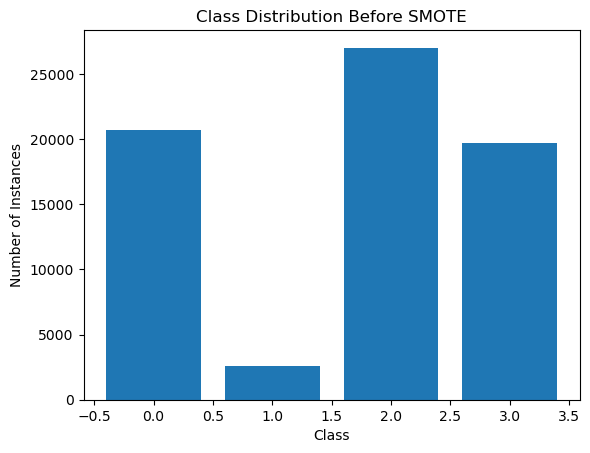

In [154]:
# Count the number of instances for each class in the target variable y1
counter = Counter(y1)

# Create a bar plot showing the class distribution
plt.bar(counter.keys(), counter.values())

# Set the title of the plot
plt.title('Class Distribution Before SMOTE')

# Label the x-axis (classes: e.g., 0 for Non-Diabetic, 1 for Diabetic)
plt.xlabel('Class')

# Label the y-axis (number of samples for each class)
plt.ylabel('Number of Instances')

# Display the plot
plt.show()

In [155]:
# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X1, y1, test_size=0.2, random_state=42)

In [156]:
#Applying SMOTE
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

In [157]:
#Check the shape (number of rows and columns) of the resampled training feature set
X_train_resampled.shape

(86704, 53)

In [158]:
# Check the shape (number of samples) of the resampled training labels array
y_train_resampled.shape

(86704,)

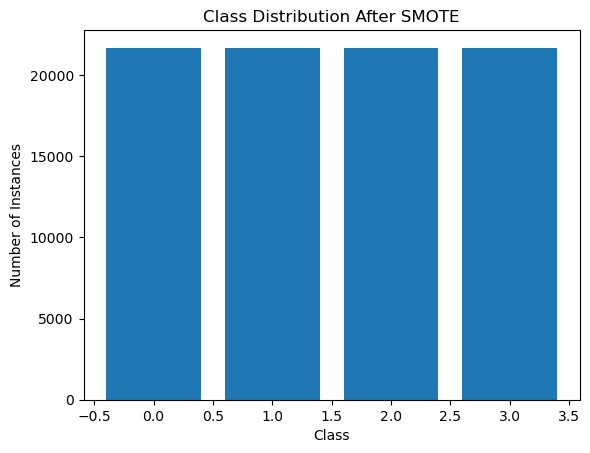

In [159]:
#Plotting the class distribution of the resampled training labels to visualize balance after applying SMOTE.
counter_resampled = Counter(y_train_resampled)
plt.bar(counter_resampled.keys(), counter_resampled.values())
plt.title('Class Distribution After SMOTE')
plt.xlabel('Class')
plt.ylabel('Number of Instances')
plt.show()

In [160]:
#Define a dictionary of various machine learning models, including individual classifiers and an ensemble VotingClassifier combining logistic regression, random forest, and decision tree.
models = {
    "logistic_regression": LogisticRegression(),
    "decision_tree": DecisionTreeClassifier(),
    # Ensemble models
    "random_forest": RandomForestClassifier(),
    "gradient_boosting": GradientBoostingClassifier(),
    "adaboost": AdaBoostClassifier(),
    "XGBoost": XGBClassifier(),
    
    # Voting classifier as an ensemble of some base models
    "voting": VotingClassifier(
        estimators=[
            ("lr", LogisticRegression()),
            ("rf", RandomForestClassifier()),
            ("dt", DecisionTreeClassifier())
        ],
        voting='soft'
    )
}

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [162]:
#Train each model on the resampled training data, predict on the same data, and print the training accuracy for each model.
for i in models:
    clf = models[i]
    clf.fit(X_train_resampled, y_train_resampled)
    y_pred_train = clf.predict(X_train_resampled)
    print(f'SMOTE|{i}')
    print(f'{accuracy_score(y_train_resampled, y_pred_train)*100:.2f}%')
    print(f'=========================')

SMOTE|logistic_regression
57.98%
SMOTE|decision_tree
100.00%
SMOTE|random_forest
100.00%
SMOTE|gradient_boosting
75.39%
SMOTE|adaboost
60.67%
SMOTE|XGBoost
82.74%
SMOTE|voting
100.00%


In [163]:
#Train each model on the resampled training data, predict on the test set, and print the test accuracy for each model.
for i in models:
    clf = models[i]
    clf.fit(X_train_resampled, y_train_resampled)
    y_pred = clf.predict(X_test)
    print(f'SMOTE|{i}')
    print(f'{accuracy_score(y_test, y_pred)*100:.2f}%')
    print(f'=========================')

SMOTE|logistic_regression
47.58%
SMOTE|decision_tree
56.19%
SMOTE|random_forest
64.01%
SMOTE|gradient_boosting
63.16%
SMOTE|adaboost
49.93%
SMOTE|XGBoost
64.00%
SMOTE|voting
56.19%


## Removing Target class label (Other Genetic/Specific Diabetes) and building the model

In [164]:
## Removing class #Other Genetic/Specific Diabetes=1
#the following are the labels for Target
#Type 1 Diabetes= 2
#Normal / Prediabetic=0
#Type 2 Diabetes= 3
#Other Genetic/Specific Diabetes=1

In [94]:
#Displaying the final dataframe
df_final

,Age,BMI,Blood Pressure,Cholesterol Levels,Waist Circumference,Weight Gain During Pregnancy,Pancreatic Health,Digestive Enzyme Levels,Birth Weight,trans_insulin_levels,trans_pulmonary_function,Genetic Markers_Negative,Genetic Markers_Positive,Autoantibodies_Negative,Autoantibodies_Positive,Family History_No,Family History_Yes,Environmental Factors_Absent,Environmental Factors_Present,Dietary Habits_Healthy,Dietary Habits_Unhealthy,Ethnicity_High Risk,Ethnicity_Low Risk,Smoking Status_Non-Smoker,Smoking Status_Smoker,Glucose Tolerance Test_Abnormal,Glucose Tolerance Test_Normal,History of PCOS_No,History of PCOS_Yes,Previous Gestational Diabetes_No,Previous Gestational Diabetes_Yes,Pregnancy History_Complications,Pregnancy History_Normal,Cystic Fibrosis Diagnosis_No,Cystic Fibrosis Diagnosis_Yes,Steroid Use History_No,Steroid Use History_Yes,Genetic Testing_Negative,Genetic Testing_Positive,Neurological Assessments_1,Neurological Assessments_2,Neurological Assessments_3,Liver Function Tests_Abnormal,Liver Function Tests_Normal,Urine Test_Glucose Present,Urine Test_Ketones Present,Urine Test_Normal,Urine Test_Protein Present,Early Onset Symptoms_No,Early Onset Symptoms_Yes,Alcohol Consumption,Socioeconomic Factors,Physical Activity,Target
0,44,38,124,201,50,18,36,56,2629,3.688879,24494.299414,0,1,1,0,1,0,0,1,1,0,0,1,0,1,0,1,1,0,1,0,0,1,1,0,1,0,0,1,0,0,1,0,1,0,1,0,0,1,0,2.0,1.0,2.0,2
1,1,17,73,121,24,8,26,28,1881,2.564949,13405.964283,0,1,1,0,1,0,0,1,1,0,0,1,1,0,0,1,0,1,1,0,0,1,0,1,1,0,1,0,1,0,0,0,1,1,0,0,0,0,1,1.0,2.0,2.0,2
2,36,24,121,185,36,15,56,55,3622,3.295837,27916.737178,0,1,0,1,0,1,0,1,0,1,0,1,0,1,1,0,0,1,1,0,0,1,0,1,1,0,1,0,1,0,0,1,0,0,1,0,0,0,1,2.0,1.0,2.0,0
3,7,16,100,151,29,12,49,60,3542,2.079442,36636.893418,1,0,0,1,1,0,0,1,0,1,0,1,0,1,1,0,1,0,0,1,0,1,0,1,1,0,0,1,0,1,0,1,0,0,1,0,0,1,0,1.0,2.0,0.0,0
4,10,17,103,146,33,2,10,24,1770,2.833213,5077.326335,1,0,1,0,0,1,0,1,1,0,0,1,0,1,0,1,1,0,0,1,1,0,1,0,1,0,0,1,1,0,0,0,1,0,0,0,1,1,0,1.0,0.0,2.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69995,38,35,128,299,40,24,31,34,2575,3.178054,20592.345918,1,0,1,0,0,1,0,1,0,1,0,1,1,0,1,0,0,1,1,0,0,1,0,1,0,1,0,1,0,1,0,1,0,0,0,1,0,1,0,0.0,2.0,2.0,3
69996,51,31,125,160,44,15,69,58,3002,3.044522,29730.895287,0,1,0,1,1,0,1,0,0,1,0,1,0,1,1,0,0,1,1,0,0,1,0,1,0,1,1,0,1,0,0,1,0,0,1,0,0,1,0,0.0,1.0,0.0,2
69997,11,15,105,153,31,23,39,53,3593,2.890372,25324.472274,0,1,1,0,1,0,1,0,0,1,0,1,0,1,1,0,0,1,1,0,0,1,0,1,0,1,0,1,0,1,0,0,1,0,0,0,1,1,0,2.0,2.0,0.0,2
69998,30,24,111,177,33,21,53,35,2592,3.465736,19860.875955,0,1,1,0,1,0,1,0,1,0,1,0,1,0,0,1,1,0,1,0,0,1,1,0,1,0,0,1,1,0,0,1,0,0,1,0,0,0,1,1.0,0.0,2.0,2


In [95]:
#Create a new DataFrame df_new containing only rows where the 'Target' column is not equal to 1 (i.e., exclude class 1).
df_new=df_final[~(df_final['Target']==1)]
df_new

,Age,BMI,Blood Pressure,Cholesterol Levels,Waist Circumference,Weight Gain During Pregnancy,Pancreatic Health,Digestive Enzyme Levels,Birth Weight,trans_insulin_levels,trans_pulmonary_function,Genetic Markers_Negative,Genetic Markers_Positive,Autoantibodies_Negative,Autoantibodies_Positive,Family History_No,Family History_Yes,Environmental Factors_Absent,Environmental Factors_Present,Dietary Habits_Healthy,Dietary Habits_Unhealthy,Ethnicity_High Risk,Ethnicity_Low Risk,Smoking Status_Non-Smoker,Smoking Status_Smoker,Glucose Tolerance Test_Abnormal,Glucose Tolerance Test_Normal,History of PCOS_No,History of PCOS_Yes,Previous Gestational Diabetes_No,Previous Gestational Diabetes_Yes,Pregnancy History_Complications,Pregnancy History_Normal,Cystic Fibrosis Diagnosis_No,Cystic Fibrosis Diagnosis_Yes,Steroid Use History_No,Steroid Use History_Yes,Genetic Testing_Negative,Genetic Testing_Positive,Neurological Assessments_1,Neurological Assessments_2,Neurological Assessments_3,Liver Function Tests_Abnormal,Liver Function Tests_Normal,Urine Test_Glucose Present,Urine Test_Ketones Present,Urine Test_Normal,Urine Test_Protein Present,Early Onset Symptoms_No,Early Onset Symptoms_Yes,Alcohol Consumption,Socioeconomic Factors,Physical Activity,Target
0,44,38,124,201,50,18,36,56,2629,3.688879,24494.299414,0,1,1,0,1,0,0,1,1,0,0,1,0,1,0,1,1,0,1,0,0,1,1,0,1,0,0,1,0,0,1,0,1,0,1,0,0,1,0,2.0,1.0,2.0,2
1,1,17,73,121,24,8,26,28,1881,2.564949,13405.964283,0,1,1,0,1,0,0,1,1,0,0,1,1,0,0,1,0,1,1,0,0,1,0,1,1,0,1,0,1,0,0,0,1,1,0,0,0,0,1,1.0,2.0,2.0,2
2,36,24,121,185,36,15,56,55,3622,3.295837,27916.737178,0,1,0,1,0,1,0,1,0,1,0,1,0,1,1,0,0,1,1,0,0,1,0,1,1,0,1,0,1,0,0,1,0,0,1,0,0,0,1,2.0,1.0,2.0,0
3,7,16,100,151,29,12,49,60,3542,2.079442,36636.893418,1,0,0,1,1,0,0,1,0,1,0,1,0,1,1,0,1,0,0,1,0,1,0,1,1,0,0,1,0,1,0,1,0,0,1,0,0,1,0,1.0,2.0,0.0,0
5,41,26,127,208,32,11,40,52,3835,2.833213,32583.460504,0,1,1,0,0,1,0,1,1,0,0,1,1,0,1,0,1,0,1,0,0,1,0,1,1,0,1,0,0,1,0,0,1,0,1,0,0,0,1,0.0,0.0,1.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69995,38,35,128,299,40,24,31,34,2575,3.178054,20592.345918,1,0,1,0,0,1,0,1,0,1,0,1,1,0,1,0,0,1,1,0,0,1,0,1,0,1,0,1,0,1,0,1,0,0,0,1,0,1,0,0.0,2.0,2.0,3
69996,51,31,125,160,44,15,69,58,3002,3.044522,29730.895287,0,1,0,1,1,0,1,0,0,1,0,1,0,1,1,0,0,1,1,0,0,1,0,1,0,1,1,0,1,0,0,1,0,0,1,0,0,1,0,0.0,1.0,0.0,2
69997,11,15,105,153,31,23,39,53,3593,2.890372,25324.472274,0,1,1,0,1,0,1,0,0,1,0,1,0,1,1,0,0,1,1,0,0,1,0,1,0,1,0,1,0,1,0,0,1,0,0,0,1,1,0,2.0,2.0,0.0,2
69998,30,24,111,177,33,21,53,35,2592,3.465736,19860.875955,0,1,1,0,1,0,1,0,1,0,1,0,1,0,0,1,1,0,1,0,0,1,1,0,1,0,0,1,1,0,0,1,0,0,1,0,0,0,1,1.0,0.0,2.0,2


In [96]:
#Check the number of rows and columns in the filtered DataFrame df_new.
df_new.shape

(67447, 54)

In [97]:
#the following are the labels for Target
#Type 1 Diabetes= 2
#Normal / Prediabetic=0
#Type 2 Diabetes= 3
#Other Genetic/Specific Diabetes=1

# As we are removing the Other Genetic/Specific Diabetes (encoded as 1 )
# we need to reencode it as inconsistent number will not be taken by the XGBmodel
df_new['Target']=df_new['Target'].replace(2,1).replace(3,2)

#Normal / Prediabetic=0
#Type 1 Diabetes =1
#Type 2 Diabetes= 2

In [98]:
#Displaying the dataframe
df_new

,Age,BMI,Blood Pressure,Cholesterol Levels,Waist Circumference,Weight Gain During Pregnancy,Pancreatic Health,Digestive Enzyme Levels,Birth Weight,trans_insulin_levels,trans_pulmonary_function,Genetic Markers_Negative,Genetic Markers_Positive,Autoantibodies_Negative,Autoantibodies_Positive,Family History_No,Family History_Yes,Environmental Factors_Absent,Environmental Factors_Present,Dietary Habits_Healthy,Dietary Habits_Unhealthy,Ethnicity_High Risk,Ethnicity_Low Risk,Smoking Status_Non-Smoker,Smoking Status_Smoker,Glucose Tolerance Test_Abnormal,Glucose Tolerance Test_Normal,History of PCOS_No,History of PCOS_Yes,Previous Gestational Diabetes_No,Previous Gestational Diabetes_Yes,Pregnancy History_Complications,Pregnancy History_Normal,Cystic Fibrosis Diagnosis_No,Cystic Fibrosis Diagnosis_Yes,Steroid Use History_No,Steroid Use History_Yes,Genetic Testing_Negative,Genetic Testing_Positive,Neurological Assessments_1,Neurological Assessments_2,Neurological Assessments_3,Liver Function Tests_Abnormal,Liver Function Tests_Normal,Urine Test_Glucose Present,Urine Test_Ketones Present,Urine Test_Normal,Urine Test_Protein Present,Early Onset Symptoms_No,Early Onset Symptoms_Yes,Alcohol Consumption,Socioeconomic Factors,Physical Activity,Target
0,44,38,124,201,50,18,36,56,2629,3.688879,24494.299414,0,1,1,0,1,0,0,1,1,0,0,1,0,1,0,1,1,0,1,0,0,1,1,0,1,0,0,1,0,0,1,0,1,0,1,0,0,1,0,2.0,1.0,2.0,1
1,1,17,73,121,24,8,26,28,1881,2.564949,13405.964283,0,1,1,0,1,0,0,1,1,0,0,1,1,0,0,1,0,1,1,0,0,1,0,1,1,0,1,0,1,0,0,0,1,1,0,0,0,0,1,1.0,2.0,2.0,1
2,36,24,121,185,36,15,56,55,3622,3.295837,27916.737178,0,1,0,1,0,1,0,1,0,1,0,1,0,1,1,0,0,1,1,0,0,1,0,1,1,0,1,0,1,0,0,1,0,0,1,0,0,0,1,2.0,1.0,2.0,0
3,7,16,100,151,29,12,49,60,3542,2.079442,36636.893418,1,0,0,1,1,0,0,1,0,1,0,1,0,1,1,0,1,0,0,1,0,1,0,1,1,0,0,1,0,1,0,1,0,0,1,0,0,1,0,1.0,2.0,0.0,0
5,41,26,127,208,32,11,40,52,3835,2.833213,32583.460504,0,1,1,0,0,1,0,1,1,0,0,1,1,0,1,0,1,0,1,0,0,1,0,1,1,0,1,0,0,1,0,0,1,0,1,0,0,0,1,0.0,0.0,1.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69995,38,35,128,299,40,24,31,34,2575,3.178054,20592.345918,1,0,1,0,0,1,0,1,0,1,0,1,1,0,1,0,0,1,1,0,0,1,0,1,0,1,0,1,0,1,0,1,0,0,0,1,0,1,0,0.0,2.0,2.0,2
69996,51,31,125,160,44,15,69,58,3002,3.044522,29730.895287,0,1,0,1,1,0,1,0,0,1,0,1,0,1,1,0,0,1,1,0,0,1,0,1,0,1,1,0,1,0,0,1,0,0,1,0,0,1,0,0.0,1.0,0.0,1
69997,11,15,105,153,31,23,39,53,3593,2.890372,25324.472274,0,1,1,0,1,0,1,0,0,1,0,1,0,1,1,0,0,1,1,0,0,1,0,1,0,1,0,1,0,1,0,0,1,0,0,0,1,1,0,2.0,2.0,0.0,1
69998,30,24,111,177,33,21,53,35,2592,3.465736,19860.875955,0,1,1,0,1,0,1,0,1,0,1,0,1,0,0,1,1,0,1,0,0,1,1,0,1,0,0,1,1,0,0,1,0,0,1,0,0,0,1,1.0,0.0,2.0,1


In [99]:
#Split the features (first 53 columns) and target from the filtered DataFrame, then split them into training and testing sets with 80% training and 20% testing data.
X1=df_new.iloc[:,:53]
y1=df_new['Target']
X_train,X_test,y_train,y_test=train_test_split(X1,y1,test_size=0.2,random_state=42)

In [100]:
#Define a dictionary of various machine learning models, including individual classifiers and an ensemble VotingClassifier combining logistic regression, random forest, and decision tree.
models = {
    "logistic_regression": LogisticRegression(),
    "decision_tree": DecisionTreeClassifier(),
    # Ensemble models
    "random_forest": RandomForestClassifier(),
    "gradient_boosting": GradientBoostingClassifier(),
    "adaboost": AdaBoostClassifier(),
    "XGBoost": XGBClassifier(),
    
    # Voting classifier as an ensemble of some base models
     "voting": VotingClassifier(
        estimators=[
            ("lr", LogisticRegression()),
            ("rf", RandomForestClassifier()),
            ("dt", DecisionTreeClassifier())
        ],
        voting='soft'
    )
}

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [101]:
#Train each model on the training data after removing class 1, predict on the same training data, and print the training accuracy for each model.
for i in models:
    clf = models[i]
    clf.fit(X_train, y_train)
    y_pred_train = clf.predict(X_train)
    print(f'After Removal of class 1 (others/genetic type)|{i}')
    print(f'{accuracy_score(y_train, y_pred_train)*100:.2f}%')
    print(f'=========================')

After Removal of class 1 (others/genetic type)|logistic_regression
55.82%
After Removal of class 1 (others/genetic type)|decision_tree
100.00%
After Removal of class 1 (others/genetic type)|random_forest
100.00%
After Removal of class 1 (others/genetic type)|gradient_boosting
67.39%
After Removal of class 1 (others/genetic type)|adaboost
63.13%
After Removal of class 1 (others/genetic type)|XGBoost
77.41%
After Removal of class 1 (others/genetic type)|voting
100.00%


In [102]:
#Train each model on the training data after removing class 1, predict on the test data, and print the test accuracy for each model.
for i in models:
    clf = models[i]
    clf.fit(X_train, y_train)
    y_pred_test = clf.predict(X_test)
    print(f'After Removal of class 1 (others/genetic type)|{i}')
    print(f'{accuracy_score(y_test, y_pred_test)*100:.2f}%')
    print(f'=========================')

After Removal of class 1 (others/genetic type)|logistic_regression
55.23%
After Removal of class 1 (others/genetic type)|decision_tree
58.61%
After Removal of class 1 (others/genetic type)|random_forest
66.62%
After Removal of class 1 (others/genetic type)|gradient_boosting
67.08%
After Removal of class 1 (others/genetic type)|adaboost
63.37%
After Removal of class 1 (others/genetic type)|XGBoost
66.95%
After Removal of class 1 (others/genetic type)|voting
59.27%


## Removing Multiple Target class label (Other Genetic/Specific Diabetes and Normal / Prediabetic) and building the model

In [103]:
#Displaying the final dataframe
df_final

,Age,BMI,Blood Pressure,Cholesterol Levels,Waist Circumference,Weight Gain During Pregnancy,Pancreatic Health,Digestive Enzyme Levels,Birth Weight,trans_insulin_levels,trans_pulmonary_function,Genetic Markers_Negative,Genetic Markers_Positive,Autoantibodies_Negative,Autoantibodies_Positive,Family History_No,Family History_Yes,Environmental Factors_Absent,Environmental Factors_Present,Dietary Habits_Healthy,Dietary Habits_Unhealthy,Ethnicity_High Risk,Ethnicity_Low Risk,Smoking Status_Non-Smoker,Smoking Status_Smoker,Glucose Tolerance Test_Abnormal,Glucose Tolerance Test_Normal,History of PCOS_No,History of PCOS_Yes,Previous Gestational Diabetes_No,Previous Gestational Diabetes_Yes,Pregnancy History_Complications,Pregnancy History_Normal,Cystic Fibrosis Diagnosis_No,Cystic Fibrosis Diagnosis_Yes,Steroid Use History_No,Steroid Use History_Yes,Genetic Testing_Negative,Genetic Testing_Positive,Neurological Assessments_1,Neurological Assessments_2,Neurological Assessments_3,Liver Function Tests_Abnormal,Liver Function Tests_Normal,Urine Test_Glucose Present,Urine Test_Ketones Present,Urine Test_Normal,Urine Test_Protein Present,Early Onset Symptoms_No,Early Onset Symptoms_Yes,Alcohol Consumption,Socioeconomic Factors,Physical Activity,Target
0,44,38,124,201,50,18,36,56,2629,3.688879,24494.299414,0,1,1,0,1,0,0,1,1,0,0,1,0,1,0,1,1,0,1,0,0,1,1,0,1,0,0,1,0,0,1,0,1,0,1,0,0,1,0,2.0,1.0,2.0,2
1,1,17,73,121,24,8,26,28,1881,2.564949,13405.964283,0,1,1,0,1,0,0,1,1,0,0,1,1,0,0,1,0,1,1,0,0,1,0,1,1,0,1,0,1,0,0,0,1,1,0,0,0,0,1,1.0,2.0,2.0,2
2,36,24,121,185,36,15,56,55,3622,3.295837,27916.737178,0,1,0,1,0,1,0,1,0,1,0,1,0,1,1,0,0,1,1,0,0,1,0,1,1,0,1,0,1,0,0,1,0,0,1,0,0,0,1,2.0,1.0,2.0,0
3,7,16,100,151,29,12,49,60,3542,2.079442,36636.893418,1,0,0,1,1,0,0,1,0,1,0,1,0,1,1,0,1,0,0,1,0,1,0,1,1,0,0,1,0,1,0,1,0,0,1,0,0,1,0,1.0,2.0,0.0,0
4,10,17,103,146,33,2,10,24,1770,2.833213,5077.326335,1,0,1,0,0,1,0,1,1,0,0,1,0,1,0,1,1,0,0,1,1,0,1,0,1,0,0,1,1,0,0,0,1,0,0,0,1,1,0,1.0,0.0,2.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69995,38,35,128,299,40,24,31,34,2575,3.178054,20592.345918,1,0,1,0,0,1,0,1,0,1,0,1,1,0,1,0,0,1,1,0,0,1,0,1,0,1,0,1,0,1,0,1,0,0,0,1,0,1,0,0.0,2.0,2.0,3
69996,51,31,125,160,44,15,69,58,3002,3.044522,29730.895287,0,1,0,1,1,0,1,0,0,1,0,1,0,1,1,0,0,1,1,0,0,1,0,1,0,1,1,0,1,0,0,1,0,0,1,0,0,1,0,0.0,1.0,0.0,2
69997,11,15,105,153,31,23,39,53,3593,2.890372,25324.472274,0,1,1,0,1,0,1,0,0,1,0,1,0,1,1,0,0,1,1,0,0,1,0,1,0,1,0,1,0,1,0,0,1,0,0,0,1,1,0,2.0,2.0,0.0,2
69998,30,24,111,177,33,21,53,35,2592,3.465736,19860.875955,0,1,1,0,1,0,1,0,1,0,1,0,1,0,0,1,1,0,1,0,0,1,1,0,1,0,0,1,1,0,0,1,0,0,1,0,0,0,1,1.0,0.0,2.0,2


In [104]:
#Create a new DataFrame df_new2 by filtering out rows where the 'Target' is either 0 or 1, keeping only other classes.
df_new2=df_final[~((df_final['Target']==1) | (df_final["Target"]==0))]
df_new2

,Age,BMI,Blood Pressure,Cholesterol Levels,Waist Circumference,Weight Gain During Pregnancy,Pancreatic Health,Digestive Enzyme Levels,Birth Weight,trans_insulin_levels,trans_pulmonary_function,Genetic Markers_Negative,Genetic Markers_Positive,Autoantibodies_Negative,Autoantibodies_Positive,Family History_No,Family History_Yes,Environmental Factors_Absent,Environmental Factors_Present,Dietary Habits_Healthy,Dietary Habits_Unhealthy,Ethnicity_High Risk,Ethnicity_Low Risk,Smoking Status_Non-Smoker,Smoking Status_Smoker,Glucose Tolerance Test_Abnormal,Glucose Tolerance Test_Normal,History of PCOS_No,History of PCOS_Yes,Previous Gestational Diabetes_No,Previous Gestational Diabetes_Yes,Pregnancy History_Complications,Pregnancy History_Normal,Cystic Fibrosis Diagnosis_No,Cystic Fibrosis Diagnosis_Yes,Steroid Use History_No,Steroid Use History_Yes,Genetic Testing_Negative,Genetic Testing_Positive,Neurological Assessments_1,Neurological Assessments_2,Neurological Assessments_3,Liver Function Tests_Abnormal,Liver Function Tests_Normal,Urine Test_Glucose Present,Urine Test_Ketones Present,Urine Test_Normal,Urine Test_Protein Present,Early Onset Symptoms_No,Early Onset Symptoms_Yes,Alcohol Consumption,Socioeconomic Factors,Physical Activity,Target
0,44,38,124,201,50,18,36,56,2629,3.688879,24494.299414,0,1,1,0,1,0,0,1,1,0,0,1,0,1,0,1,1,0,1,0,0,1,1,0,1,0,0,1,0,0,1,0,1,0,1,0,0,1,0,2.0,1.0,2.0,2
1,1,17,73,121,24,8,26,28,1881,2.564949,13405.964283,0,1,1,0,1,0,0,1,1,0,0,1,1,0,0,1,0,1,1,0,0,1,0,1,1,0,1,0,1,0,0,0,1,1,0,0,0,0,1,1.0,2.0,2.0,2
5,41,26,127,208,32,11,40,52,3835,2.833213,32583.460504,0,1,1,0,0,1,0,1,1,0,0,1,1,0,1,0,1,0,1,0,0,1,0,1,1,0,1,0,0,1,0,0,1,0,1,0,0,0,1,0.0,0.0,1.0,2
6,30,31,115,237,43,15,62,96,4426,3.367296,15803.950190,1,0,1,0,1,0,1,0,1,0,1,0,1,0,0,1,1,0,0,1,0,1,0,1,0,1,1,0,0,0,1,1,0,0,1,0,0,1,0,0.0,2.0,1.0,3
7,3,18,80,157,29,4,13,29,1644,2.302585,6079.079224,0,1,1,0,1,0,1,0,0,1,1,0,0,1,0,1,0,1,0,1,0,1,0,1,1,0,1,0,1,0,0,0,1,0,1,0,0,0,1,0.0,0.0,0.0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69994,2,16,89,138,25,0,25,22,2578,2.833213,13405.964283,0,1,1,0,0,1,1,0,0,1,0,1,0,1,1,0,1,0,1,0,0,1,1,0,1,0,1,0,1,0,0,0,1,0,1,0,0,0,1,0.0,1.0,2.0,3
69995,38,35,128,299,40,24,31,34,2575,3.178054,20592.345918,1,0,1,0,0,1,0,1,0,1,0,1,1,0,1,0,0,1,1,0,0,1,0,1,0,1,0,1,0,1,0,1,0,0,0,1,0,1,0,0.0,2.0,2.0,3
69996,51,31,125,160,44,15,69,58,3002,3.044522,29730.895287,0,1,0,1,1,0,1,0,0,1,0,1,0,1,1,0,0,1,1,0,0,1,0,1,0,1,1,0,1,0,0,1,0,0,1,0,0,1,0,0.0,1.0,0.0,2
69997,11,15,105,153,31,23,39,53,3593,2.890372,25324.472274,0,1,1,0,1,0,1,0,0,1,0,1,0,1,1,0,0,1,1,0,0,1,0,1,0,1,0,1,0,1,0,0,1,0,0,0,1,1,0,2.0,2.0,0.0,2


In [105]:
#Check the number of rows and columns in the filtered DataFrame df_new2.
df_new2.shape

(46715, 54)

In [106]:
#Print the relative frequencies (proportions) of each class in the 'Target' column of df_new2.
print(df_new2["Target"].value_counts(normalize=True))

Target
2    0.578615
3    0.421385
Name: proportion, dtype: float64


In [107]:
#the following are the labels for Target
#Type 1 Diabetes= 2
#Normal / Prediabetic=0
#Type 2 Diabetes= 3
#Other Genetic/Specific Diabetes=1

# As we are removing the Other Genetic/Specific Diabetes (encoded as 1 ) and #Normal / Prediabetic (encoded as 0)
# we need to reencode it as inconsistent number will not be taken by the XGBmodel
df_new2['Target']=df_new2['Target'].replace(2,0).replace(3,1)

#Type 1 Diabetes =0
#Type 2 Diabetes= 1

In [108]:
#Display the contents of the filtered DataFrame df_new2.
df_new2

,Age,BMI,Blood Pressure,Cholesterol Levels,Waist Circumference,Weight Gain During Pregnancy,Pancreatic Health,Digestive Enzyme Levels,Birth Weight,trans_insulin_levels,trans_pulmonary_function,Genetic Markers_Negative,Genetic Markers_Positive,Autoantibodies_Negative,Autoantibodies_Positive,Family History_No,Family History_Yes,Environmental Factors_Absent,Environmental Factors_Present,Dietary Habits_Healthy,Dietary Habits_Unhealthy,Ethnicity_High Risk,Ethnicity_Low Risk,Smoking Status_Non-Smoker,Smoking Status_Smoker,Glucose Tolerance Test_Abnormal,Glucose Tolerance Test_Normal,History of PCOS_No,History of PCOS_Yes,Previous Gestational Diabetes_No,Previous Gestational Diabetes_Yes,Pregnancy History_Complications,Pregnancy History_Normal,Cystic Fibrosis Diagnosis_No,Cystic Fibrosis Diagnosis_Yes,Steroid Use History_No,Steroid Use History_Yes,Genetic Testing_Negative,Genetic Testing_Positive,Neurological Assessments_1,Neurological Assessments_2,Neurological Assessments_3,Liver Function Tests_Abnormal,Liver Function Tests_Normal,Urine Test_Glucose Present,Urine Test_Ketones Present,Urine Test_Normal,Urine Test_Protein Present,Early Onset Symptoms_No,Early Onset Symptoms_Yes,Alcohol Consumption,Socioeconomic Factors,Physical Activity,Target
0,44,38,124,201,50,18,36,56,2629,3.688879,24494.299414,0,1,1,0,1,0,0,1,1,0,0,1,0,1,0,1,1,0,1,0,0,1,1,0,1,0,0,1,0,0,1,0,1,0,1,0,0,1,0,2.0,1.0,2.0,0
1,1,17,73,121,24,8,26,28,1881,2.564949,13405.964283,0,1,1,0,1,0,0,1,1,0,0,1,1,0,0,1,0,1,1,0,0,1,0,1,1,0,1,0,1,0,0,0,1,1,0,0,0,0,1,1.0,2.0,2.0,0
5,41,26,127,208,32,11,40,52,3835,2.833213,32583.460504,0,1,1,0,0,1,0,1,1,0,0,1,1,0,1,0,1,0,1,0,0,1,0,1,1,0,1,0,0,1,0,0,1,0,1,0,0,0,1,0.0,0.0,1.0,0
6,30,31,115,237,43,15,62,96,4426,3.367296,15803.950190,1,0,1,0,1,0,1,0,1,0,1,0,1,0,0,1,1,0,0,1,0,1,0,1,0,1,1,0,0,0,1,1,0,0,1,0,0,1,0,0.0,2.0,1.0,1
7,3,18,80,157,29,4,13,29,1644,2.302585,6079.079224,0,1,1,0,1,0,1,0,0,1,1,0,0,1,0,1,0,1,0,1,0,1,0,1,1,0,1,0,1,0,0,0,1,0,1,0,0,0,1,0.0,0.0,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69994,2,16,89,138,25,0,25,22,2578,2.833213,13405.964283,0,1,1,0,0,1,1,0,0,1,0,1,0,1,1,0,1,0,1,0,0,1,1,0,1,0,1,0,1,0,0,0,1,0,1,0,0,0,1,0.0,1.0,2.0,1
69995,38,35,128,299,40,24,31,34,2575,3.178054,20592.345918,1,0,1,0,0,1,0,1,0,1,0,1,1,0,1,0,0,1,1,0,0,1,0,1,0,1,0,1,0,1,0,1,0,0,0,1,0,1,0,0.0,2.0,2.0,1
69996,51,31,125,160,44,15,69,58,3002,3.044522,29730.895287,0,1,0,1,1,0,1,0,0,1,0,1,0,1,1,0,0,1,1,0,0,1,0,1,0,1,1,0,1,0,0,1,0,0,1,0,0,1,0,0.0,1.0,0.0,0
69997,11,15,105,153,31,23,39,53,3593,2.890372,25324.472274,0,1,1,0,1,0,1,0,0,1,0,1,0,1,1,0,0,1,1,0,0,1,0,1,0,1,0,1,0,1,0,0,1,0,0,0,1,1,0,2.0,2.0,0.0,0


In [109]:
#Split features (first 53 columns) and target from df_new2, then create training and testing sets with 80% training and 20% testing data.
X1=df_new2.iloc[:,:53]
y1=df_new2['Target']
X_train,X_test,y_train,y_test=train_test_split(X1,y1,test_size=0.2,random_state=42)

In [110]:
#Define a dictionary of various machine learning models, including individual classifiers and an ensemble VotingClassifier combining logistic regression, random forest, and decision tree.
models = {
models = {
    "logistic_regression": LogisticRegression(),
    "decision_tree": DecisionTreeClassifier(),
    # Ensemble models
    "random_forest": RandomForestClassifier(),
    "gradient_boosting": GradientBoostingClassifier(),
    "adaboost": AdaBoostClassifier(),
    "XGBoost": XGBClassifier(),
    
    # Voting classifier as an ensemble of some base models
     "voting": VotingClassifier(
        estimators=[
            ("lr", LogisticRegression()),
            ("rf", RandomForestClassifier()),
            ("dt", DecisionTreeClassifier())
        ],
        voting='soft'
    )
}

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [116]:
# Train each model on the training data after removing classes 0 and 1, then print the training accuracy and precision scores for each model.
for i in models:
    clf = models[i]
    clf.fit(X_train, y_train)
    y_pred_train = clf.predict(X_train)
    print(f'After Removal of class 0 &1 (Normal / Prediabetic & others/genetic type)|{i}')
    print(f'Accuracy score {accuracy_score(y_train, y_pred_train)*100:.2f}%')
    print(f'Precision score {precision_score(y_train, y_pred_train)*100:.2f}%')
    print(f'=========================')

After Removal of class 0 &1 (Normal / Prediabetic & others/genetic type)|logistic_regression
69.94%
65.36%
After Removal of class 0 &1 (Normal / Prediabetic & others/genetic type)|decision_tree
100.00%
100.00%
After Removal of class 0 &1 (Normal / Prediabetic & others/genetic type)|random_forest
100.00%
100.00%
After Removal of class 0 &1 (Normal / Prediabetic & others/genetic type)|gradient_boosting
76.38%
68.44%
After Removal of class 0 &1 (Normal / Prediabetic & others/genetic type)|adaboost
74.31%
67.51%
After Removal of class 0 &1 (Normal / Prediabetic & others/genetic type)|XGBoost
86.69%
80.38%
After Removal of class 0 &1 (Normal / Prediabetic & others/genetic type)|voting
100.00%
100.00%


In [117]:
#Train each model on the training data after removing classes 0 and 1, predict on the test set, and print the test accuracy and precision scores for each model.
for i in models:
    clf = models[i]
    clf.fit(X_train, y_train)
    y_pred_test = clf.predict(X_test)
    print(f'After Removal of class 0 & 1 (Normal / Prediabetic & others/genetic type)|{i}')
    print(f'Accuracy score {accuracy_score(y_test, y_pred_test)*100:.2f}%')
    print(f'Precision score {precision_score(y_test, y_pred_test)*100:.2f}%')
    print(f'=========================')

After Removal of class 0 & 1 (Normal / Prediabetic & others/genetic type)|logistic_regression
69.83%
64.27%
After Removal of class 0 & 1 (Normal / Prediabetic & others/genetic type)|decision_tree
68.98%
62.50%
After Removal of class 0 & 1 (Normal / Prediabetic & others/genetic type)|random_forest
75.86%
67.47%
After Removal of class 0 & 1 (Normal / Prediabetic & others/genetic type)|gradient_boosting
75.71%
66.96%
After Removal of class 0 & 1 (Normal / Prediabetic & others/genetic type)|adaboost
73.76%
65.96%
After Removal of class 0 & 1 (Normal / Prediabetic & others/genetic type)|XGBoost
74.53%
66.53%
After Removal of class 0 & 1 (Normal / Prediabetic & others/genetic type)|voting
70.43%
64.48%


## Converting to binary class without dropping

In [106]:
# Create a copy of the original DataFrame df_final and assign it to df_2c to preserve the original data while working on the copy.
df_2c=df_final.copy()

In [107]:
# Convert the 'Target' column in df_2c to a binary format where class 0 remains 0, and all other classes are merged into class 1, then display the updated 'Target' column.
df_2c['Target'] = df_2c['Target'].apply(lambda x: 0 if x == 0 else 1)
df_2c['Target']

0        1
1        1
2        0
3        0
4        1
        ..
69995    1
69996    1
69997    1
69998    1
69999    0
Name: Target, Length: 70000, dtype: int64

In [108]:
#Count and display the number of instances in each class of the updated binary 'Target' column in df_2c.
df_2c['Target'].value_counts()

Target
1    49268
0    20732
Name: count, dtype: int64

In [109]:
# display dataframe df_2c
df_2c

,Age,BMI,Blood Pressure,Cholesterol Levels,Waist Circumference,Weight Gain During Pregnancy,Pancreatic Health,Digestive Enzyme Levels,Birth Weight,trans_insulin_levels,trans_pulmonary_function,Genetic Markers_Negative,Genetic Markers_Positive,Autoantibodies_Negative,Autoantibodies_Positive,Family History_No,Family History_Yes,Environmental Factors_Absent,Environmental Factors_Present,Dietary Habits_Healthy,Dietary Habits_Unhealthy,Ethnicity_High Risk,Ethnicity_Low Risk,Smoking Status_Non-Smoker,Smoking Status_Smoker,Glucose Tolerance Test_Abnormal,Glucose Tolerance Test_Normal,History of PCOS_No,History of PCOS_Yes,Previous Gestational Diabetes_No,Previous Gestational Diabetes_Yes,Pregnancy History_Complications,Pregnancy History_Normal,Cystic Fibrosis Diagnosis_No,Cystic Fibrosis Diagnosis_Yes,Steroid Use History_No,Steroid Use History_Yes,Genetic Testing_Negative,Genetic Testing_Positive,Neurological Assessments_1,Neurological Assessments_2,Neurological Assessments_3,Liver Function Tests_Abnormal,Liver Function Tests_Normal,Urine Test_Glucose Present,Urine Test_Ketones Present,Urine Test_Normal,Urine Test_Protein Present,Early Onset Symptoms_No,Early Onset Symptoms_Yes,Alcohol Consumption,Socioeconomic Factors,Physical Activity,Target
0,44,38,124,201,50,18,36,56,2629,3.688879,24494.299414,0,1,1,0,1,0,0,1,1,0,0,1,0,1,0,1,1,0,1,0,0,1,1,0,1,0,0,1,0,0,1,0,1,0,1,0,0,1,0,2.0,1.0,2.0,1
1,1,17,73,121,24,8,26,28,1881,2.564949,13405.964283,0,1,1,0,1,0,0,1,1,0,0,1,1,0,0,1,0,1,1,0,0,1,0,1,1,0,1,0,1,0,0,0,1,1,0,0,0,0,1,1.0,2.0,2.0,1
2,36,24,121,185,36,15,56,55,3622,3.295837,27916.737178,0,1,0,1,0,1,0,1,0,1,0,1,0,1,1,0,0,1,1,0,0,1,0,1,1,0,1,0,1,0,0,1,0,0,1,0,0,0,1,2.0,1.0,2.0,0
3,7,16,100,151,29,12,49,60,3542,2.079442,36636.893418,1,0,0,1,1,0,0,1,0,1,0,1,0,1,1,0,1,0,0,1,0,1,0,1,1,0,0,1,0,1,0,1,0,0,1,0,0,1,0,1.0,2.0,0.0,0
4,10,17,103,146,33,2,10,24,1770,2.833213,5077.326335,1,0,1,0,0,1,0,1,1,0,0,1,0,1,0,1,1,0,0,1,1,0,1,0,1,0,0,1,1,0,0,0,1,0,0,0,1,1,0,1.0,0.0,2.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69995,38,35,128,299,40,24,31,34,2575,3.178054,20592.345918,1,0,1,0,0,1,0,1,0,1,0,1,1,0,1,0,0,1,1,0,0,1,0,1,0,1,0,1,0,1,0,1,0,0,0,1,0,1,0,0.0,2.0,2.0,1
69996,51,31,125,160,44,15,69,58,3002,3.044522,29730.895287,0,1,0,1,1,0,1,0,0,1,0,1,0,1,1,0,0,1,1,0,0,1,0,1,0,1,1,0,1,0,0,1,0,0,1,0,0,1,0,0.0,1.0,0.0,1
69997,11,15,105,153,31,23,39,53,3593,2.890372,25324.472274,0,1,1,0,1,0,1,0,0,1,0,1,0,1,1,0,0,1,1,0,0,1,0,1,0,1,0,1,0,1,0,0,1,0,0,0,1,1,0,2.0,2.0,0.0,1
69998,30,24,111,177,33,21,53,35,2592,3.465736,19860.875955,0,1,1,0,1,0,1,0,1,0,1,0,1,0,0,1,1,0,1,0,0,1,1,0,1,0,0,1,1,0,0,1,0,0,1,0,0,0,1,1.0,0.0,2.0,1


In [110]:
# Split the features (X) and binary target (y) from df_2c, then create training and testing sets with 80% training and 20% testing data using a fixed random seed for reproducibility.
X = df_2c.drop(['Target'],axis=1)
y = df_2c['Target']
xtrain,xtest,ytrain,ytest = train_test_split(X,y,test_size=0.2,random_state=42)

In [111]:
xtest.shape

(14000, 53)

In [112]:
#Define a dictionary with two machine learning base models: Logistic Regression (with increased max iterations) and Decision Tree classifier.
models = {'Logistic Regression': LogisticRegression(max_iter=5000),
         'Decision Tree': DecisionTreeClassifier()}

<IPython.core.display.Javascript object>

In [113]:
#Train each model on the training data, then print the training and test accuracy scores for each model.
import sklearn.metrics as skm
for name,model in models.items():
    print(f'Model: {name}')
    model.fit(xtrain,ytrain)
    acc = skm.accuracy_score(ytrain,model.predict(xtrain))
    print(f'Accuracy Score for Train: {acc*100:.2f}')
    acc = skm.accuracy_score(ytest,model.predict(xtest))
    print(f'Accuracy Score for Test: {acc*100:.2f}')
    print('======================================')

Model: Logistic Regression
Accuracy Score for Train: 78.08
Accuracy Score for Test: 77.54
Model: Decision Tree
Accuracy Score for Train: 100.00
Accuracy Score for Test: 80.51


In [114]:
#ensemble model
#Train each ensemble model on the training data, then print the training and test accuracy scores for each, after squeezing target arrays to ensure correct shape.
ensemble_models = {
    'Random Forest': RandomForestClassifier(),
    'Gradient Boosting': GradientBoostingClassifier(),
    'AdaBoost': AdaBoostClassifier(),
    'XGBoost': XGBClassifier(),
    "voting": VotingClassifier(
        estimators=[
            ("lr", LogisticRegression()),
            ("rf", RandomForestClassifier()),
            ("dt", DecisionTreeClassifier())
        ],
        voting='soft'
    )
}
ytrain = ytrain.squeeze()
ytest = ytest.squeeze()
for name,model in ensemble_models.items():
    print(f'Model: {name}')
    model.fit(xtrain,ytrain)
    acc = skm.accuracy_score(ytrain,model.predict(xtrain))
    print(f'Accuracy Score for Train: {acc*100:.2f}')
    acc = skm.accuracy_score(ytest,model.predict(xtest))
    print(f'Accuracy Score for Test: {acc*100:.2f}')
    print('======================================')

<IPython.core.display.Javascript object>

Model: Random Forest
Accuracy Score for Train: 100.00
Accuracy Score for Test: 83.81
Model: Gradient Boosting
Accuracy Score for Train: 84.45
Accuracy Score for Test: 83.69
Model: AdaBoost
Accuracy Score for Train: 83.73
Accuracy Score for Test: 83.03
Model: XGBoost
Accuracy Score for Train: 89.48
Accuracy Score for Test: 83.39
Model: voting
Accuracy Score for Train: 100.00
Accuracy Score for Test: 80.93


In [118]:
#Apply SMOTE to balance the dataset by oversampling the minority class, then split the resampled data into training (80%) and testing (20%) sets with a fixed random seed for reproducibility.
sm = SMOTE()
X_res, y_res = sm.fit_resample(X, y)
xtrain,xtest,ytrain,ytest = train_test_split(X_res,y_res,random_state=41,test_size=0.2)

In [119]:
# Train each base and ensemble model on the training data, then print the training and test accuracy scores for each model.
all_models = {
    # Base models
    'Logistic Regression': LogisticRegression(max_iter=1000),
    'Decision Tree': DecisionTreeClassifier(),

    # Ensemble models
    'Random Forest': RandomForestClassifier(),
    'Gradient Boosting': GradientBoostingClassifier(),
    'AdaBoost': AdaBoostClassifier(),
    'XGBoost': XGBClassifier(),
    "voting": VotingClassifier(
        estimators=[
            ("lr", LogisticRegression()),
            ("rf", RandomForestClassifier()),
            ("dt", DecisionTreeClassifier())
        ],
        voting='soft'
    )
    
}

for name,model in all_models.items():
    print(f'Model: {name}')
    model.fit(xtrain,ytrain)
    acc = accuracy_score(ytrain,model.predict(xtrain))
    print(f'Accuracy Score for Train: {acc*100:.2f}')
    acc = accuracy_score(ytest,model.predict(xtest))
    print(f'Accuracy Score for Test: {acc*100:.2f}')
    print('======================================')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Model: Logistic Regression
Accuracy Score for Train: 83.41
Accuracy Score for Test: 83.58
Model: Decision Tree
Accuracy Score for Train: 100.00
Accuracy Score for Test: 85.83
Model: Random Forest
Accuracy Score for Train: 100.00
Accuracy Score for Test: 88.96
Model: Gradient Boosting
Accuracy Score for Train: 88.70
Accuracy Score for Test: 88.90
Model: AdaBoost
Accuracy Score for Train: 87.87
Accuracy Score for Test: 87.79
Model: XGBoost
Accuracy Score for Train: 92.12
Accuracy Score for Test: 89.02
Model: voting
Accuracy Score for Train: 100.00
Accuracy Score for Test: 87.22


In [122]:
# For each model, fit on training data, predict on test data, then compute and print the confusion matrix, macro-averaged precision, and recall to evaluate classification performance.
for name, model in all_models.items():
    model.fit(xtrain,ytrain)
    y_pred = model.predict(xtest)

    cm = confusion_matrix(ytest, y_pred)
    precision = precision_score(ytest, y_pred, average='macro')
    recall = recall_score(ytest, y_pred, average='macro')

    print(f"Model: {name}")
    print("Confusion Matrix:")
    print(cm)
    print(f"Precision: {precision*100:.4f}")
    print(f"Recall: {recall*100:.4f}")
    print("-" * 40)

Model: Logistic Regression
Confusion Matrix:
[[8025 1887]
 [1350 8446]]
Precision: 83.6691
Recall: 83.5907
----------------------------------------
Model: Decision Tree
Confusion Matrix:
[[8521 1391]
 [1388 8408]]
Precision: 85.8986
Recall: 85.8987
----------------------------------------
Model: Random Forest
Confusion Matrix:
[[9392  520]
 [1609 8187]]
Precision: 89.7009
Recall: 89.1644
----------------------------------------
Model: Gradient Boosting
Confusion Matrix:
[[9354  558]
 [1629 8167]]
Precision: 89.3863
Recall: 88.8706
----------------------------------------
Model: AdaBoost
Confusion Matrix:
[[9344  568]
 [1838 7958]]
Precision: 88.4504
Recall: 87.7534
----------------------------------------
Model: XGBoost
Confusion Matrix:
[[9128  784]
 [1380 8416]]
Precision: 89.1727
Recall: 89.0015
----------------------------------------
Model: voting
Confusion Matrix:
[[8831 1081]
 [1446 8350]]
Precision: 87.2338
Recall: 87.1665
----------------------------------------


## Final Model

In [123]:
# Train the voting and stacking ensemble classifiers on the training data, then print their training and test accuracy scores to compare performance
best_model = {
    "voting": VotingClassifier(
        estimators=[
            ("ada", AdaBoostClassifier()),
            ("gb", GradientBoostingClassifier()),
            ("xgb", XGBClassifier())
        ],
        voting='soft'
    
    ),
    "stacking":StackingClassifier(
    estimators=[("ada", AdaBoostClassifier()),
            ("gb", GradientBoostingClassifier()),
            ("xgb", XGBClassifier())]
)
}

for name,model in best_model.items():
    print(f'Model: {name}')
    model.fit(xtrain,ytrain)
    acc = accuracy_score(ytrain,model.predict(xtrain))
    print(f'Accuracy Score for Train: {acc*100:.2f}')
    acc = accuracy_score(ytest,model.predict(xtest))
    print(f'Accuracy Score for Test: {acc*100:.2f}')
    print('======================================')

Model: voting
Accuracy Score for Train: 90.34
Accuracy Score for Test: 89.15
Model: stacking
Accuracy Score for Train: 90.64
Accuracy Score for Test: 89.18


In [124]:
# For each model in best_model, fit on the training data, predict on the test set, then print the confusion matrix, precision and recall, and the detailed classification report to evaluate performance comprehensively.
for name, model in best_model.items():
    model.fit(xtrain,ytrain)
    y_pred = model.predict(xtest)

    cm = confusion_matrix(ytest, y_pred)
    precision = precision_score(ytest, y_pred)
    recall = recall_score(ytest, y_pred)
    cr=classification_report(ytest, y_pred)

    print(f"Model: {name}")
    print("Confusion Matrix:")
    print(cm)
    print(f"Precision: {precision*100:.4f}")
    print(f"Recall: {recall*100:.4f}")
    print(f"classification report: {cr}")
    print("-" * 40)

Model: voting
Confusion Matrix:
[[9285  627]
 [1511 8285]]
Precision: 92.9645
Recall: 84.5753
classification report:               precision    recall  f1-score   support

           0       0.86      0.94      0.90      9912
           1       0.93      0.85      0.89      9796

    accuracy                           0.89     19708
   macro avg       0.89      0.89      0.89     19708
weighted avg       0.89      0.89      0.89     19708

----------------------------------------
Model: stacking
Confusion Matrix:
[[9225  687]
 [1445 8351]]
Precision: 92.3988
Recall: 85.2491
classification report:               precision    recall  f1-score   support

           0       0.86      0.93      0.90      9912
           1       0.92      0.85      0.89      9796

    accuracy                           0.89     19708
   macro avg       0.89      0.89      0.89     19708
weighted avg       0.89      0.89      0.89     19708

----------------------------------------


### Confusion Matrix

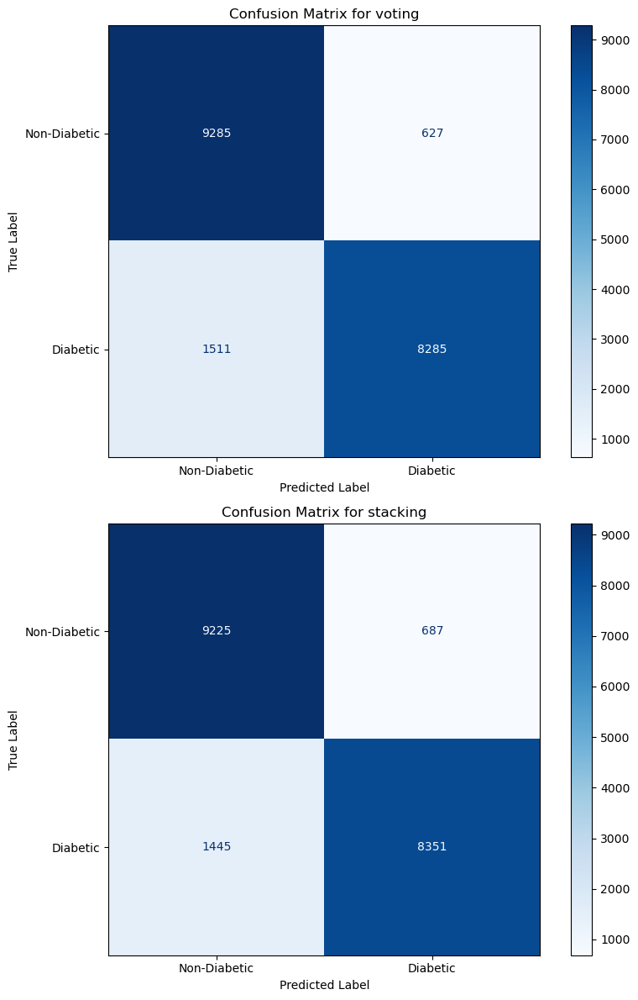

In [125]:
#Plot confusion matrices side-by-side for each model in best_model using subplots.

# Create a single figure with 2 subplots
fig, axs = plt.subplots(2, 1, figsize=(8, 12))  # 2 rows, 1 column

for t, (name, model) in enumerate(best_model.items()):
    model.fit(xtrain, ytrain)
    y_pred = model.predict(xtest)
    cm = confusion_matrix(ytest, y_pred)
    
    # Plot on the corresponding subplot axis
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Non-Diabetic", "Diabetic"])
    disp.plot(ax=axs[t], cmap=plt.cm.Blues)
    
    axs[t].set_title(f"Confusion Matrix for {name}")
    axs[t].set_xlabel("Predicted Label")
    axs[t].set_ylabel("True Label")

plt.tight_layout()
plt.show()



### ROC-AUC curve

Model: voting
Model: stacking


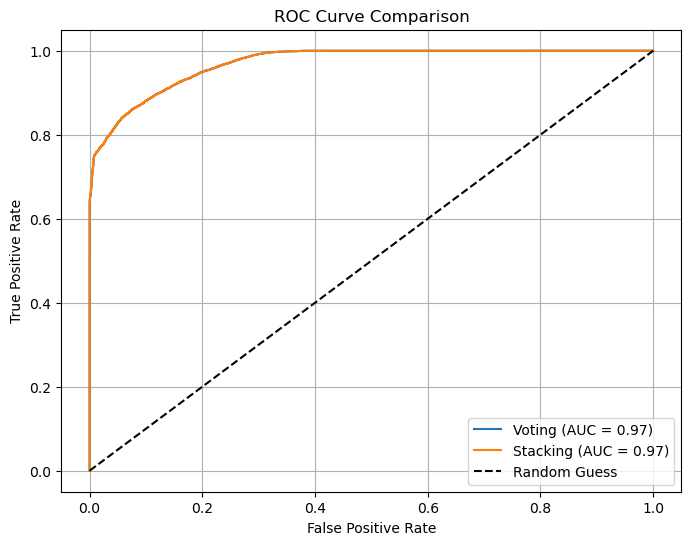

In [126]:
#Plot ROC curves with AUC scores for each model in best_model, showing their ability to distinguish classes on the test set alongside a random guess baseline.
from sklearn.metrics import accuracy_score, roc_curve, roc_auc_score
plt.figure(figsize=(8, 6))

for name, model in best_model.items():
    print(f'Model: {name}')
    
    # Train the model
    model.fit(xtrain, ytrain)
    
    # Accuracy
    train_acc = accuracy_score(ytrain, model.predict(xtrain))
    test_acc = accuracy_score(ytest, model.predict(xtest))

    
    # ROC AUC Curve
    y_scores = model.predict_proba(xtest)[:, 1]
    fpr, tpr, _ = roc_curve(ytest, y_scores)
    auc = roc_auc_score(ytest, y_scores)
    
    # Plot
    plt.plot(fpr, tpr, label=f'{name.capitalize()} (AUC = {auc:.2f})')
    print('======================================')

# Random line
plt.plot([0, 1], [0, 1], 'k--', label='Random Guess')

# Plot formatting
plt.title('ROC Curve Comparison')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
plt.grid()
plt.show()